In [ ]:
import sys
sys.version

'3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]'

# **NARMA系列予測**

In [ ]:
import numpy as np

def narma_series_stable(order: int, length: int, *, seed: int = 0, burn_in: int = 1000,
                        u_low: float = 0.0, u_high: float = 0.2,   # ←少し弱め推奨
                        a: float = 0.3, b: float = 0.05, c: float = 1.5, d: float = 0.1,
                        b_scale: str = "divide_by_order",          # "none" or "divide_by_order"
                        clip_y: float = 50.0,                      # 発散保険
                        check_every: int = 2000):
    if order < 1:
        raise ValueError("order must be >= 1")

    rng = np.random.default_rng(seed)
    total = length + burn_in

    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    if b_scale == "divide_by_order":
        b_eff = b / float(order)
    elif b_scale == "none":
        b_eff = b
    else:
        raise ValueError('b_scale must be "divide_by_order" or "none"')

    delay = order - 1

    for t in range(total - 1):
        # sum_{i=0..order-1} y(t-i)
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]

        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0

        y_next = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

        # 発散保険（クリップ）
        if clip_y is not None:
            y_next = float(np.clip(y_next, -clip_y, clip_y))

        y[t + 1] = y_next

        # 早期検知（任意）
        if check_every and (t % check_every == 0) and (t > 0):
            if not np.isfinite(y[t]):
                raise FloatingPointError(f"NARMA diverged at t={t}. Try smaller u_high or smaller b (or b_scale).")

    return y[burn_in:], u[burn_in:]

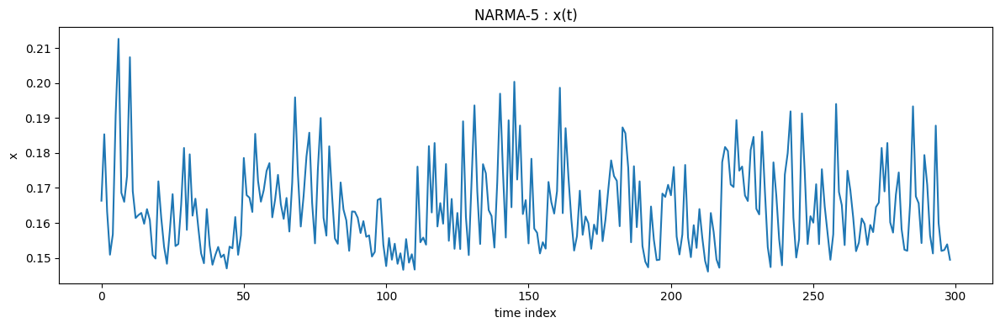

In [ ]:
# NARMA5
order = 5
x_series, u_series = narma_series_stable(order, 6000, seed=123, burn_in=1000,
                                         u_high=0.2, b_scale="divide_by_order", clip_y=50.0)
import numpy as np
import matplotlib.pyplot as plt

x = x_series

plt.figure(figsize=(12, 4))
plt.plot(x[1001:1300], lw=1.5)
plt.title("NARMA-5 : x(t)")
plt.xlabel("time index")
plt.ylabel("x")
plt.tight_layout()
plt.show()

**QRCと古典ESNでNARMA系列予測を行う**

(2-1)

In [ ]:
import numpy as np
from typing import Tuple, Optional

def simulate_and_fit_one_pass_scalar_input(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,                    # shape (T,)  入力: u(t)
    Y: np.ndarray,                    # shape (T,)  教師: y(t+1) など
    *,
    ridge: float = 1e-2,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",          # "pm" or "plus"
    input_mode: str = "scale",        # "scale" or "replace"
    Win: Optional[np.ndarray] = None, # shape (M,)   入力マスク。Noneなら生成
    Win_scale: float = 1.0,
    x0: Optional[np.ndarray] = None,  # shape (M,) 初期状態（無励起確率）
    carry_state: bool = True,         # True: 時刻に沿って状態を引き継ぐ
) -> Tuple[np.ndarray, float, np.ndarray, np.ndarray, np.ndarray]:
    """
    出力:
      w: (M,)        Wout
      b: float       bias
      y_hat: (T,)    予測
      S: (T,M)       状態列（out_prob）
      xT: (M,)       最終状態（無励起確率）
    """
    # -------------------------
    # 形チェック
    # -------------------------
    U = np.asarray(U, dtype=float).reshape(-1)
    Y = np.asarray(Y, dtype=float).reshape(-1)
    if U.ndim != 1:
        raise ValueError(f"U must be 1D (T,). got {U.shape}")
    T = U.size
    if Y.size != T:
        raise ValueError(f"Y must be length T={T}. got {Y.size}")

    M = 12 * N
    rng = np.random.default_rng(seed)

    # 入力マスク Win: (M,)
    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, dtype=float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}. got {Win.size}")

    # 初期状態 x（無励起確率 0..1）
    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, dtype=float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}. got {x_state.size}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    # -------------------------
    # 時系列を流して状態列 S を作る
    # -------------------------
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # (A) スカラー入力 u(t) → M次元入力 u_vec
        # u_vec[j] = U[t] * Win[j]
        u_vec = U[t] * Win  # (M,)

        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            # 必要ならここで別のルールにしてOK（現状は素通し）
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # (B) ① 確率注入（無励起確率 x_state を使う）
        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # (C) ②〜⑤ 干渉ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        # (D) ⑦ 合成
        fin = (wnet + u_vec) / sqrt2

        # (E) ⑧ 非線形：検出確率 out_prob を状態とする
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)

        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        # 数値安定化
        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        log_p0_safe = re + 1j * im

        p0_like = np.exp(log_p0_safe)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        # (F) 状態更新（無励起確率として次へ）
        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    xT = x_state.copy()

    # -------------------------
    # Wout を ridge で学習： y_hat = S @ w + b
    # -------------------------
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)     # (M+1,)
    w = theta[:M]
    b = float(theta[M])

    y_hat = S @ w + b
    return w, b, y_hat, S, xT

def narma_series(order: int, length: int, *, seed: int = 0, burn_in: int = 1000,
                 u_low: float = 0.0, u_high: float = 0.2,
                 a: float = 0.3, b: float = 0.05, c: float = 1.5, d: float = 0.1,
                 b_divide_by_order: bool = True):
    """
    y(t+1) = a y(t) + b y(t) sum_{i=0..order-1} y(t-i) + c u(t-order+1)u(t) + d
    """
    rng = np.random.default_rng(seed)
    total = length + burn_in
    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    b_eff = b / float(order) if b_divide_by_order else b
    delay = order - 1

    for t in range(total - 1):
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]
        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0
        y[t + 1] = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

    return y[burn_in:], u[burn_in:]

def make_narma_dataset(u: np.ndarray, y: np.ndarray, start_t: int, T: int):
    """
    入力:  U[k] = u(t),   t = start_t + k
    教師:  Y[k] = y(t+1)
    """
    u = np.asarray(u, float).reshape(-1)
    y = np.asarray(y, float).reshape(-1)

    if start_t < 0:
        raise ValueError("start_t must be >= 0")
    if start_t + T + 1 > len(y):
        raise ValueError("range out of y (need t+1)")
    if start_t + T > len(u):
        raise ValueError("range out of u")

    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y

MSE= 1.0201621078228504e-06 Corr= 0.9976278295760697


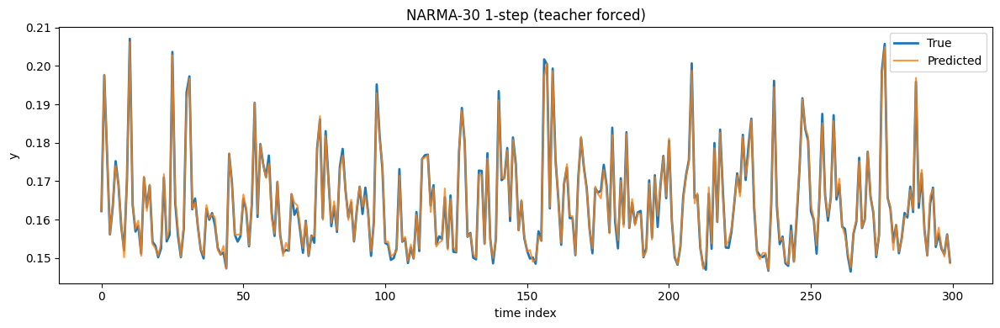

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# NARMA例：30
order = 30
y_series, u_series = narma_series(order, 6000, seed=123, burn_in=1000, u_high=0.2)

# データ作成（入力=u、教師=y(t+1)）
U, Y = make_narma_dataset(u_series, y_series, start_t=1000, T=1000)

# 学習＋予測
w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
    N=100,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=U, Y=Y,
    ridge=1e-2,
    seed=43,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    Win=None, Win_scale=1.0,
    carry_state=True
)

mse = np.mean((y_hat - Y)**2)
corr = np.corrcoef(y_hat, Y)[0,1]
print("MSE=", mse, "Corr=", corr)

# 目視
def plot_timeseries_compare(y_true, y_pred, *, start=0, length=300, title=None):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Predicted", lw=1.5, alpha=0.8)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()

plot_timeseries_compare(Y, y_hat, start=0, length=300, title=f"NARMA-{order} 1-step (teacher forced)")

MSE= 1.3935913661835704e-06 Corr= 0.996604446105817


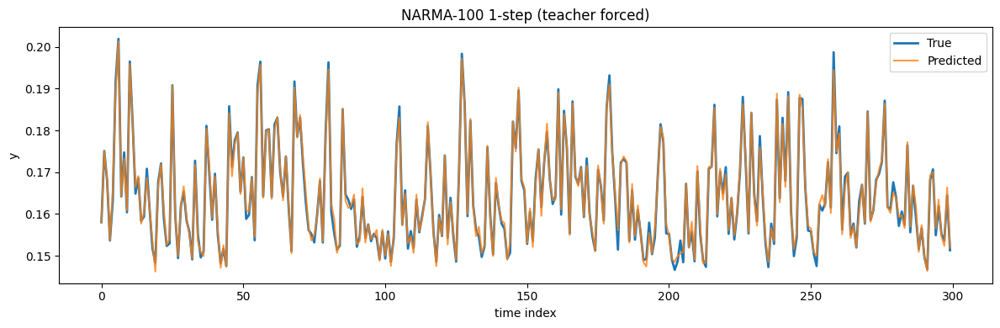

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# NARMA例：100
order = 100
y_series, u_series = narma_series(order, 6000, seed=123, burn_in=1000, u_high=0.2)

# データ作成（入力=u、教師=y(t+1)）
U, Y = make_narma_dataset(u_series, y_series, start_t=1000, T=1000)

# 学習＋予測
w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
    N=100,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=U, Y=Y,
    ridge=1e-2,
    seed=43,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    Win=None, Win_scale=1.0,
    carry_state=True
)

mse = np.mean((y_hat - Y)**2)
corr = np.corrcoef(y_hat, Y)[0,1]
print("MSE=", mse, "Corr=", corr)

# 目視
def plot_timeseries_compare(y_true, y_pred, *, start=0, length=300, title=None):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Predicted", lw=1.5, alpha=0.8)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()

plot_timeseries_compare(Y, y_hat, start=0, length=300, title=f"NARMA-{order} 1-step (teacher forced)")

MSE= 7.42466360207849e-07 Corr= 0.9983358681167133


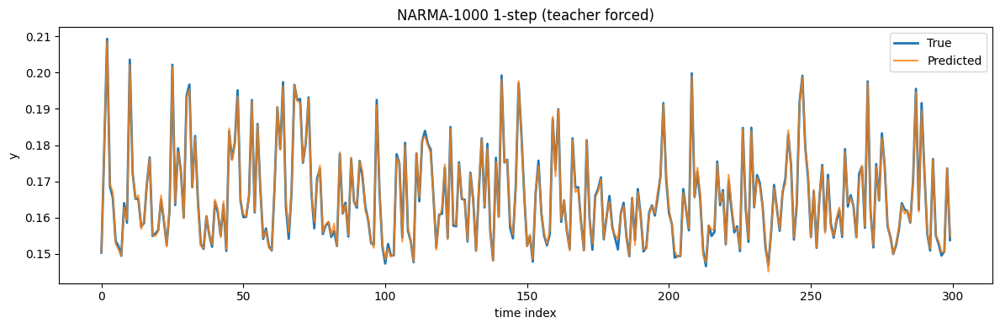

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# NARMA例：1000
order = 1000
y_series, u_series = narma_series(order, 6000, seed=123, burn_in=1000, u_high=0.2)

# データ作成（入力=u、教師=y(t+1)）
U, Y = make_narma_dataset(u_series, y_series, start_t=1000, T=1000)

# 学習＋予測
w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
    N=100,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=U, Y=Y,
    ridge=1e-2,
    seed=43,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    Win=None, Win_scale=1.0,
    carry_state=True
)

mse = np.mean((y_hat - Y)**2)
corr = np.corrcoef(y_hat, Y)[0,1]
print("MSE=", mse, "Corr=", corr)

# 目視
def plot_timeseries_compare(y_true, y_pred, *, start=0, length=300, title=None):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Predicted", lw=1.5, alpha=0.8)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()

plot_timeseries_compare(Y, y_hat, start=0, length=300, title=f"NARMA-{order} 1-step (teacher forced)")

MSE= 1.2915444635766089e-06 Corr= 0.9968931946740799


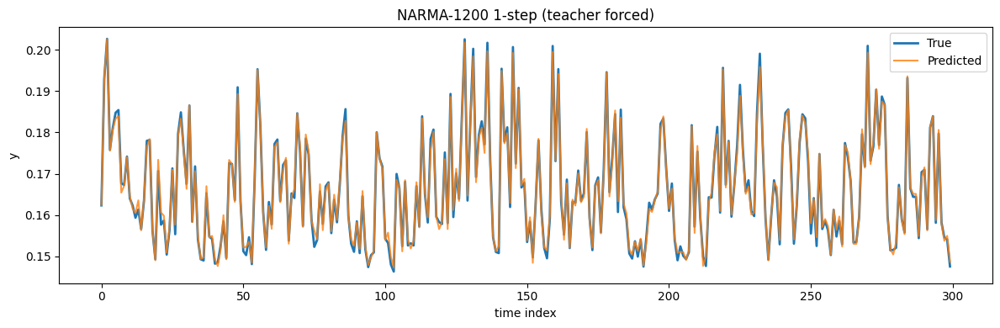

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# NARMA例：1200
order = 1200
y_series, u_series = narma_series(order, 6000, seed=123, burn_in=1000, u_high=0.2)

# データ作成（入力=u、教師=y(t+1)）
U, Y = make_narma_dataset(u_series, y_series, start_t=1000, T=1000)

# 学習＋予測
w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
    N=100,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=U, Y=Y,
    ridge=1e-2,
    seed=43,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    Win=None, Win_scale=1.0,
    carry_state=True
)

mse = np.mean((y_hat - Y)**2)
corr = np.corrcoef(y_hat, Y)[0,1]
print("MSE=", mse, "Corr=", corr)

# 目視
def plot_timeseries_compare(y_true, y_pred, *, start=0, length=300, title=None):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Predicted", lw=1.5, alpha=0.8)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()

plot_timeseries_compare(Y, y_hat, start=0, length=300, title=f"NARMA-{order} 1-step (teacher forced)")


MSE= 8.915915127023904e-12 Corr= 0.9978625232629679


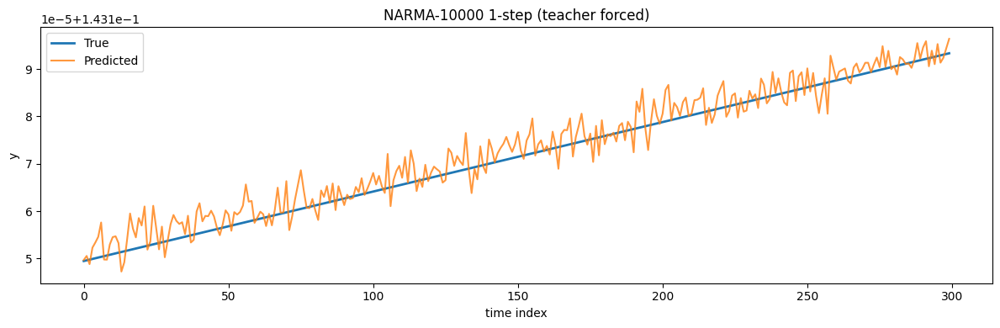

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# NARMA例：10000
order = 10000
y_series, u_series = narma_series(order, 6000, seed=123, burn_in=1000, u_high=0.2)

# データ作成（入力=u、教師=y(t+1)）
U, Y = make_narma_dataset(u_series, y_series, start_t=1000, T=1000)

# 学習＋予測
w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
    N=100,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=U, Y=Y,
    ridge=1e-2,
    seed=43,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    Win=None, Win_scale=1.0,
    carry_state=True
)

mse = np.mean((y_hat - Y)**2)
corr = np.corrcoef(y_hat, Y)[0,1]
print("MSE=", mse, "Corr=", corr)

# 目視
def plot_timeseries_compare(y_true, y_pred, *, start=0, length=6000, title=None):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Predicted", lw=1.5, alpha=0.8)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()

plot_timeseries_compare(Y, y_hat, start=0, length=300, title=f"NARMA-{order} 1-step (teacher forced)")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, List, Dict

# ============================================================
# 1) あなたの「スカラー入力版」リザバー
# ============================================================
def simulate_and_fit_one_pass_scalar_input(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,                    # shape (T,)  入力: u(t)
    Y: np.ndarray,                    # shape (T,)  教師: y(t+1) など
    *,
    ridge: float = 1e-2,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",          # "pm" or "plus"
    input_mode: str = "scale",        # "scale" or "replace"
    Win: Optional[np.ndarray] = None, # shape (M,)   入力マスク。Noneなら生成
    Win_scale: float = 1.0,
    x0: Optional[np.ndarray] = None,  # shape (M,) 初期状態（無励起確率）
    carry_state: bool = True,         # True: 時刻に沿って状態を引き継ぐ
) -> Tuple[np.ndarray, float, np.ndarray, np.ndarray, np.ndarray]:

    U = np.asarray(U, dtype=float).reshape(-1)
    Y = np.asarray(Y, dtype=float).reshape(-1)
    if U.ndim != 1:
        raise ValueError(f"U must be 1D (T,). got {U.shape}")
    T = U.size
    if Y.size != T:
        raise ValueError(f"Y must be length T={T}. got {Y.size}")

    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, dtype=float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}. got {Win.size}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, dtype=float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}. got {x_state.size}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        u_vec = U[t] * Win  # (M,)

        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)

        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        log_p0_safe = re + 1j * im

        p0_like = np.exp(log_p0_safe)
        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    xT = x_state.copy()

    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)     # (M+1,)
    w = theta[:M]
    b = float(theta[M])
    y_hat = S @ w + b

    return w, b, y_hat, S, xT


# ============================================================
# 2) NARMA 生成（高次数で発散しないよう b/order をデフォルト）
# ============================================================
def narma_series(order: int, length: int, *, seed: int = 0, burn_in: int = 1000,
                 u_low: float = 0.0, u_high: float = 0.2,
                 a: float = 0.3, b: float = 0.05, c: float = 1.5, d: float = 0.1,
                 b_divide_by_order: bool = True) -> Tuple[np.ndarray, np.ndarray]:

    if order < 1:
        raise ValueError("order must be >= 1")

    rng = np.random.default_rng(seed)
    total = length + burn_in
    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    b_eff = b / float(order) if b_divide_by_order else b
    delay = order - 1

    for t in range(total - 1):
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]
        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0
        y[t + 1] = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

    return y[burn_in:], u[burn_in:]


def make_narma_dataset(u: np.ndarray, y: np.ndarray, start_t: int, T: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    入力:  U[k] = u(t),   t = start_t + k
    教師:  Y[k] = y(t+1)
    """
    u = np.asarray(u, float).reshape(-1)
    y = np.asarray(y, float).reshape(-1)

    if start_t < 0:
        raise ValueError("start_t must be >= 0")
    if start_t + T + 1 > len(y):
        raise ValueError("range out of y (need t+1)")
    if start_t + T > len(u):
        raise ValueError("range out of u")

    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y


# ============================================================
# 3) NARMA次数スイープ（MSE / Corr）
# ============================================================
def sweep_narma_orders(
    orders: List[int],
    *,
    N: int = 100,
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    ridge: float = 1e-2,
    reservoir_seed: int = 43,
    sign_mode: str = "plus",
    input_mode: str = "scale",
    Win_scale: float = 1.0,
    carry_state: bool = True,
    norm_const: float = 1.0,
    # dataset
    series_len: int = 6000,
    burn_in: int = 1000,
    data_seed: int = 123,
    u_high: float = 0.2,
    start_t: int = 1000,
    T: int = 1000,
    b_divide_by_order: bool = True,
) -> Dict[str, np.ndarray]:

    MSEs = []
    Corrs = []

    for k in orders:
        y_series, u_series = narma_series(
            k, series_len,
            seed=data_seed,
            burn_in=burn_in,
            u_high=u_high,
            b_divide_by_order=b_divide_by_order,
        )

        U, Y = make_narma_dataset(u_series, y_series, start_t=start_t, T=T)

        # 同一orderで同じWinを使いたい場合は、ここでWinを固定生成して渡す設計も可。
        # まずは「orderごとに同じreservoir_seedでWin生成（=同分布）」にしてます。
        w, b, y_hat, S, xT = simulate_and_fit_one_pass_scalar_input(
            N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
            U=U, Y=Y,
            ridge=ridge,
            seed=reservoir_seed,
            norm_const=norm_const,
            sign_mode=sign_mode,
            input_mode=input_mode,
            Win=None, Win_scale=Win_scale,
            carry_state=carry_state,
        )

        mse = float(np.mean((y_hat - Y) ** 2))
        # Corr が NaN になるのは分散ゼロなどの時。保険でチェック。
        if np.std(y_hat) < 1e-12 or np.std(Y) < 1e-12:
            corr = np.nan
        else:
            corr = float(np.corrcoef(y_hat, Y)[0, 1])

        MSEs.append(mse)
        Corrs.append(corr)

        print(f"NARMA-{k:>3d} | MSE={mse:.6g} | Corr={corr:.6g}")

    return {
        "orders": np.array(orders, dtype=int),
        "mse": np.array(MSEs, dtype=float),
        "corr": np.array(Corrs, dtype=float),
    }


def plot_curve(x, y, *, xlabel: str, ylabel: str, title: str):
    x = np.asarray(x).reshape(-1)
    y = np.asarray(y).reshape(-1)
    plt.figure(figsize=(8, 4.5))
    plt.plot(x, y, marker="o")
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

NARMA-  5 | MSE=1.09743e-06 | Corr=0.997435
NARMA- 10 | MSE=1.12734e-06 | Corr=0.997357
NARMA- 15 | MSE=1.13556e-06 | Corr=0.997223
NARMA- 20 | MSE=9.26029e-07 | Corr=0.997741
NARMA- 30 | MSE=1.02016e-06 | Corr=0.997628
NARMA- 40 | MSE=9.0778e-07 | Corr=0.99793
NARMA- 50 | MSE=8.83781e-07 | Corr=0.998015
NARMA- 75 | MSE=1.03841e-06 | Corr=0.99761
NARMA-100 | MSE=1.39359e-06 | Corr=0.996604


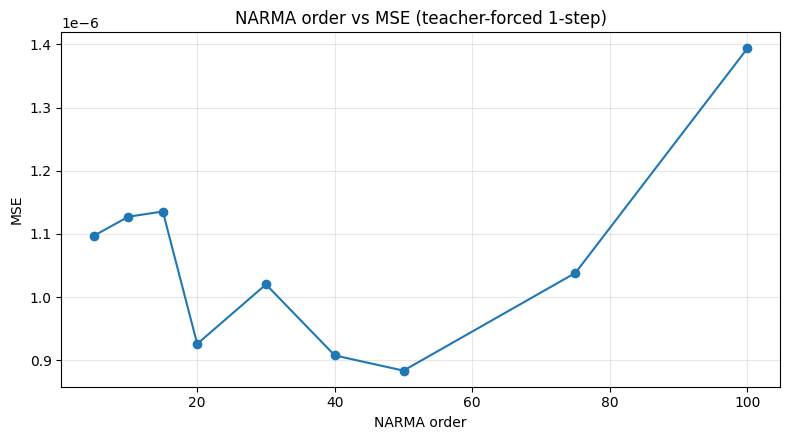

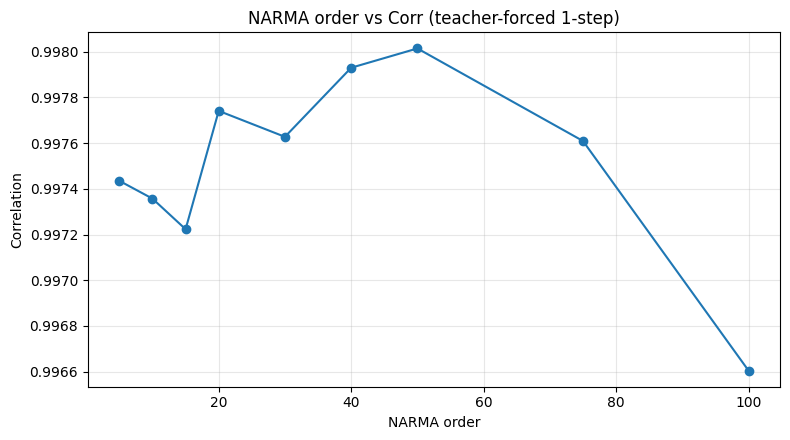

In [ ]:
orders = [5, 10, 15, 20, 30, 40, 50, 75, 100]

results = sweep_narma_orders(
    orders,
    N=100,
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    ridge=1e-2,
    reservoir_seed=43,
    sign_mode="plus",
    input_mode="scale",
    Win_scale=1.0,
    carry_state=True,
    norm_const=1.0,
    series_len=6000,
    burn_in=1000,
    data_seed=123,
    u_high=0.2,
    start_t=1000,
    T=1000,
    b_divide_by_order=True,  # 高次数での発散回避（おすすめ）
)

plot_curve(results["orders"], results["mse"],
           xlabel="NARMA order",
           ylabel="MSE",
           title="NARMA order vs MSE (teacher-forced 1-step)")

plot_curve(results["orders"], results["corr"],
           xlabel="NARMA order",
           ylabel="Correlation",
           title="NARMA order vs Corr (teacher-forced 1-step)")

NARMA-100 | MSE=1.39359e-06 | Corr=0.996604
NARMA-200 | MSE=1.06243e-06 | Corr=0.997531
NARMA-300 | MSE=8.31498e-07 | Corr=0.998055
NARMA-400 | MSE=9.23012e-07 | Corr=0.997756
NARMA-500 | MSE=9.5332e-07 | Corr=0.997516
NARMA-600 | MSE=9.52807e-07 | Corr=0.997731
NARMA-700 | MSE=9.19076e-07 | Corr=0.997764
NARMA-800 | MSE=9.17134e-07 | Corr=0.997837
NARMA-900 | MSE=1.07768e-06 | Corr=0.997316


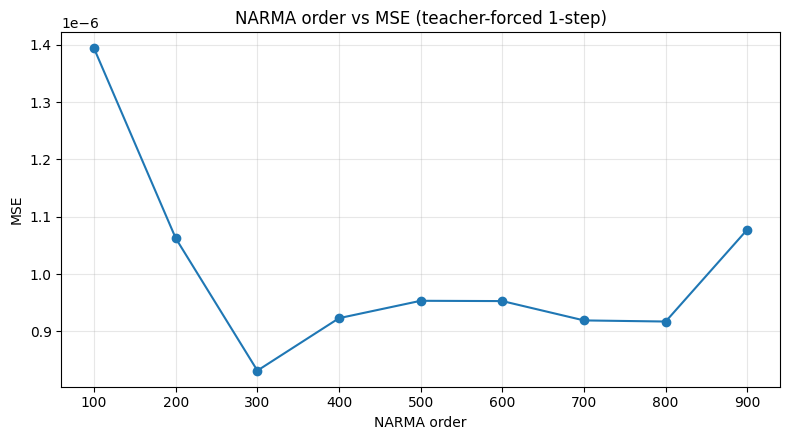

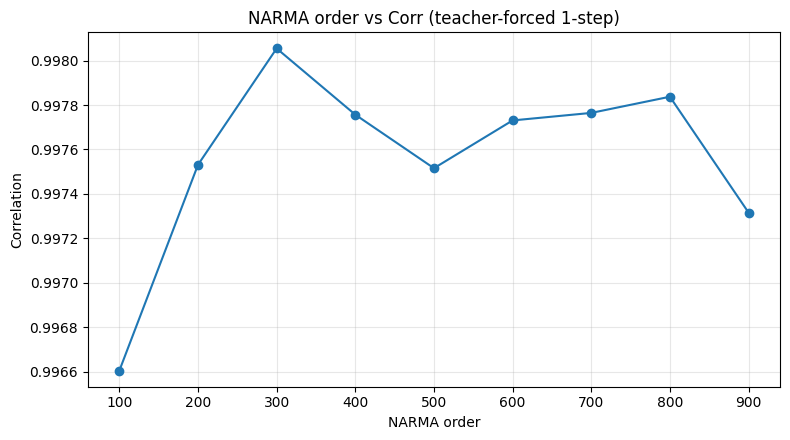

In [ ]:
orders = [100, 200, 300, 400, 500, 600, 700, 800, 900]

results = sweep_narma_orders(
    orders,
    N=100,
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    ridge=1e-2,
    reservoir_seed=43,
    sign_mode="plus",
    input_mode="scale",
    Win_scale=1.0,
    carry_state=True,
    norm_const=1.0,
    series_len=6000,
    burn_in=1000,
    data_seed=123,
    u_high=0.2,
    start_t=1000,
    T=1000,
    b_divide_by_order=True,  # 高次数での発散回避（おすすめ）
)

plot_curve(results["orders"], results["mse"],
           xlabel="NARMA order",
           ylabel="MSE",
           title="NARMA order vs MSE (teacher-forced 1-step)")

plot_curve(results["orders"], results["corr"],
           xlabel="NARMA order",
           ylabel="Correlation",
           title="NARMA order vs Corr (teacher-forced 1-step)")

ここまで作ってきたQRCと、同じサイズのESN、そしてランダム特徴から線形回帰で1ステップ予測を行う3つの機械学習モデルを比較する

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 共通: ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-2) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])  # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))   # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    w = theta[:M]
    b = float(theta[M])
    return w, b

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def mse_corr(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, float]:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    mse = float(np.mean((y_true - y_pred) ** 2))
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        corr = np.nan
    else:
        corr = float(np.corrcoef(y_true, y_pred)[0, 1])
    return mse, corr

def plot_true_vs_pred(y_true, y_pred, title=""):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    plt.figure(figsize=(12, 4))
    plt.plot(y_true, label="True", lw=2)
    plt.plot(y_pred, label="Predicted", lw=1.5, alpha=0.85)
    plt.title(title)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    plt.tight_layout()
    plt.show()


# =========================================================
# データセット: スカラー入力 U=u(t), 教師 Y=y(t+1)
# =========================================================
def make_scalar_dataset_next(u_series: np.ndarray, y_series: np.ndarray, start_t: int, T: int):
    u = np.asarray(u_series, float).reshape(-1)
    y = np.asarray(y_series, float).reshape(-1)
    if start_t < 0:
        raise ValueError("start_t must be >= 0")
    if start_t + T > len(u):
        raise ValueError("range out of u_series")
    if start_t + T + 1 > len(y):
        raise ValueError("range out of y_series (need t+1)")
    U = u[start_t : start_t + T]            # u(t)
    Y = y[start_t + 1 : start_t + T + 1]    # y(t+1)
    return U, Y


# =========================================================
# (A) QRC: out_prob 状態列（スカラー入力版）
# =========================================================
def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",    # "pm" or "plus"
    input_mode: str = "scale",  # "scale" or "replace"
    Win: Optional[np.ndarray] = None,  # (M,) 入力マスク
    Win_scale: float = 1.0,
    carry_state: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns:
      S: (T,M) out_prob（検出確率）状態列
      xT: (M,) 最終状態（無励起確率）
    """
    U = np.asarray(U, float).reshape(-1)
    T = U.size

    M = 12 * N
    rng = np.random.default_rng(seed)

    # 入力マスク (M,)
    if Win is None:
        # 10入力版の「/sqrt(10)」相当のスケール感を残すなら /sqrt(1)=1 なので不要
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    # 状態（無励起確率）
    x_state = np.zeros(M, dtype=float)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # スカラー → M次元
        u_vec = U[t] * Win  # (M,)
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # ① 確率注入
        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # ②〜⑤ ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # ⑧ 非線形（安全版）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    return S, x_state


# =========================================================
# (B) 決定論的 ESN (tanh) ：同じ M=12N、入力はスカラー
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,  # (T,)
    *,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    """
    標準的 ESN:
      x_{t+1} = (1-leak)*x_t + leak*tanh( Wres x_t + Win*u_t + b )
    Returns:
      S: (T,M) 状態列
      params: Wres, Win, b
    """
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    # Win: (M,)（スカラー入力なのでベクトルで十分）
    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)

    # Wres: (M,M) を作ってスペクトル半径調整
    Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(spectral_radius) / sr)

    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # pre = Wres@x + Win*u + b   を row-vector 形式で
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    params = {"Wres": Wres, "Win": Win, "b": b}
    return S, params


# =========================================================
# 実験: QRC vs ESN を同じ M で比較してプロット（1入力版）
# =========================================================
def compare_qrc_vs_esn_scalar(
    u_series: np.ndarray,
    y_series: np.ndarray,
    *,
    N: int = 100,
    start_t: int = 1000,
    T: int = 1000,
    seed: int = 43,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode: str = "plus",
    input_mode: str = "scale",
    Win_scale_qrc: float = 1.0,
    carry_state: bool = True,
    ridge: float = 1e-2,
    # ESN params
    spectral_radius: float = 0.9,
    input_scale_esn: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
):
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T)
    M = 12 * N

    # --- QRC
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
        U=U,
        seed=seed,
        norm_const=norm_const,
        sign_mode=sign_mode,
        input_mode=input_mode,
        Win=None,
        Win_scale=Win_scale_qrc,
        carry_state=carry_state,
    )
    wq, bq = fit_readout_ridge(S_qrc, Y, ridge=ridge)
    Yhat_qrc = predict_readout(S_qrc, wq, bq)
    mse_qrc, corr_qrc = mse_corr(Y, Yhat_qrc)

    # --- ESN
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=U,
        seed=seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate,
        bias_scale=bias_scale,
    )
    we, be = fit_readout_ridge(S_esn, Y, ridge=ridge)
    Yhat_esn = predict_readout(S_esn, we, be)
    mse_esn, corr_esn = mse_corr(Y, Yhat_esn)

    print(f"[QRC] M={M}  MSE={mse_qrc:.6f}  Corr={corr_qrc:.6f}")
    print(f"[ESN] M={M}  MSE={mse_esn:.6f}  Corr={corr_esn:.6f}")

    plot_true_vs_pred(Y, Yhat_qrc, title=f"QRC (out_prob) 1-step | NARMA-{order} | N={N}, M={M}")
    plot_true_vs_pred(Y, Yhat_esn, title=f"ESN (tanh) 1-step | NARMA-{order} | M={M}")

    return {
        "U": U,
        "Y": Y,
        "Yhat_qrc": Yhat_qrc,
        "Yhat_esn": Yhat_esn,
        "metrics": {
            "qrc": (mse_qrc, corr_qrc),
            "esn": (mse_esn, corr_esn),
        }
    }

[QRC] M=1200  MSE=0.000000  Corr=0.996917
[ESN] M=1200  MSE=0.000000  Corr=0.930068


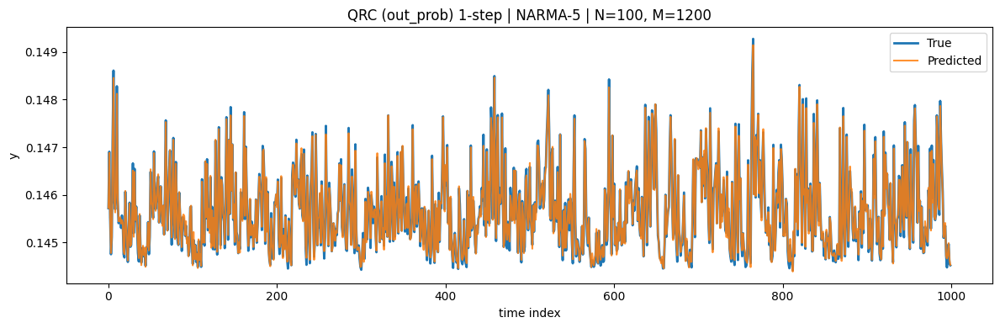

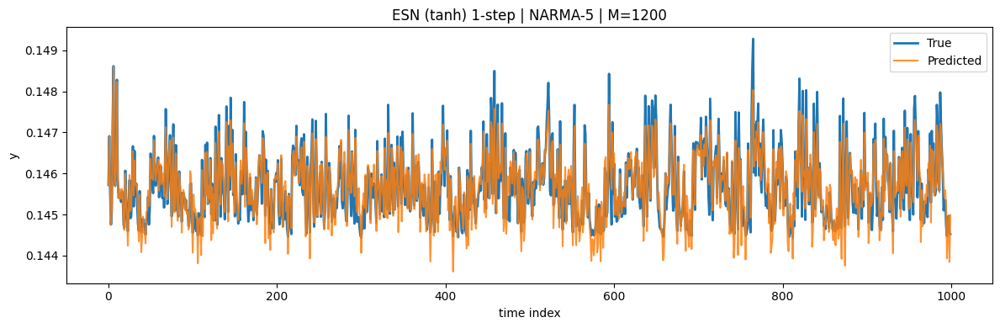

In [ ]:
order = 5
y_series, u_series = narma_series(order, length=6000, seed=123, burn_in=1000, u_high=0.05)

res = compare_qrc_vs_esn_scalar(
    u_series=u_series,
    y_series=y_series,
    N=100,
    start_t=1000,
    T=1000,
    seed=43,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    spectral_radius=0.9, input_scale_esn=0.5, leak_rate=1.0
)

[QRC] M=1200  MSE=0.000000  Corr=0.997186
[ESN] M=1200  MSE=0.000000  Corr=0.826375


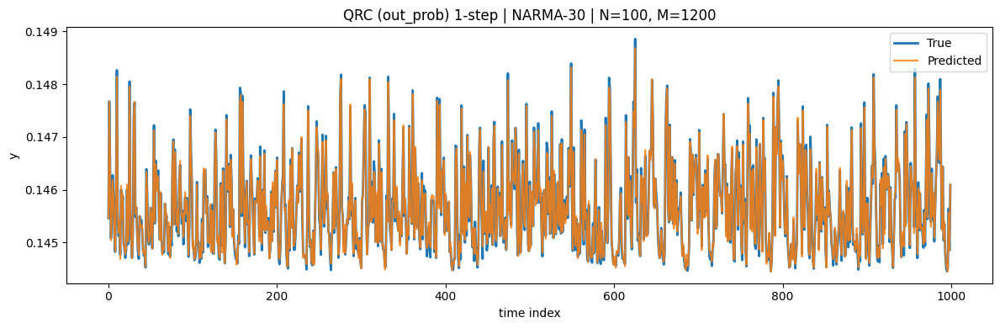

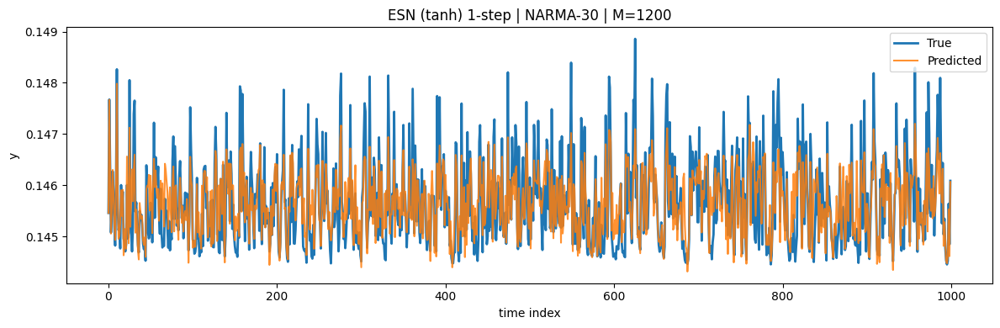

In [ ]:
# 例：
order = 30
y_series, u_series = narma_series(order, length=6000, seed=123, burn_in=1000, u_high=0.05)

res = compare_qrc_vs_esn_scalar(
    u_series=u_series,
    y_series=y_series,
    N=100,
    start_t=1000,
    T=1000,
    seed=43,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    spectral_radius=0.9, input_scale_esn=0.5, leak_rate=1.0
)

[QRC] M=1200  MSE=0.000000  Corr=0.997320
[ESN] M=1200  MSE=0.000000  Corr=0.697036


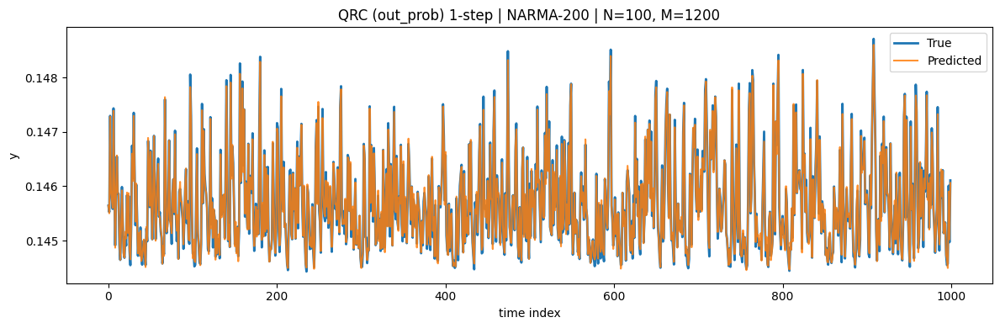

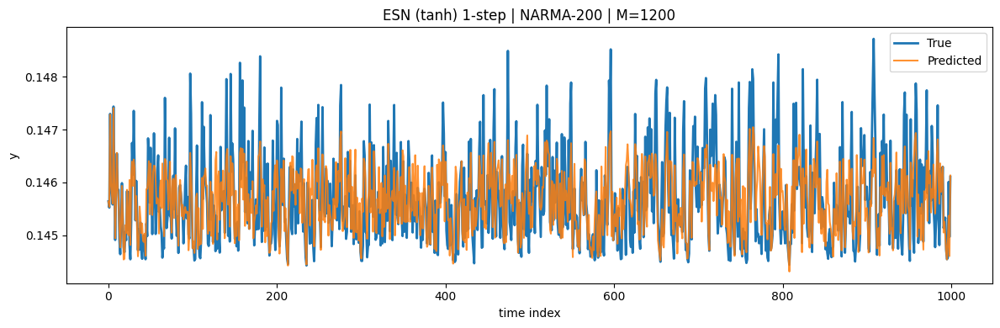

In [ ]:
order = 200
y_series, u_series = narma_series(order, length=6000, seed=123, burn_in=1000, u_high=0.05)

res = compare_qrc_vs_esn_scalar(
    u_series=u_series,
    y_series=y_series,
    N=100,
    start_t=1000,
    T=1000,
    seed=43,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    spectral_radius=0.9, input_scale_esn=0.5, leak_rate=1.0
)

[QRC] M=1200  MSE=0.000000  Corr=0.996417
[ESN] M=1200  MSE=0.000000  Corr=0.656636


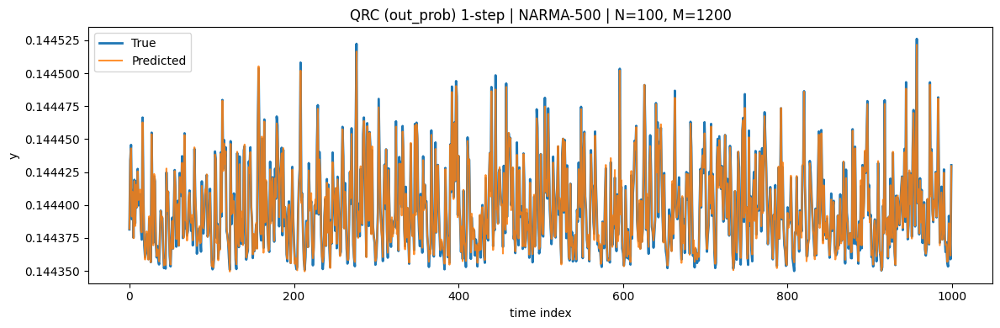

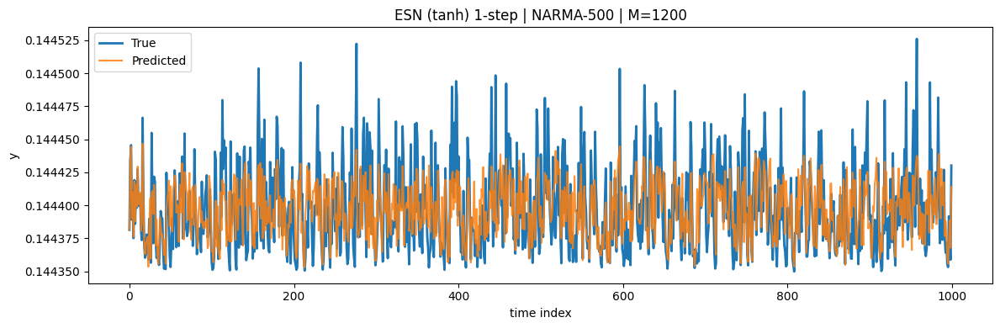

In [ ]:
# 例：
order = 500
y_series, u_series = narma_series(order, length=6000, seed=123, burn_in=1000, u_high=0.01)

res = compare_qrc_vs_esn_scalar(
    u_series=u_series,
    y_series=y_series,
    N=100,
    start_t=1000,
    T=1000,
    seed=43,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    spectral_radius=0.9, input_scale_esn=0.5, leak_rate=1.0
)

**MCテストで、どのくらいの記憶性能を持つのかを調べる**

(2-2)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    w = theta[:M]
    b = float(theta[M])
    return w, b

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) QRC: out_prob 状態列（スカラー入力版）
#     ※あなたの「安全版⑧」を維持
# =========================================================
def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",    # "pm" or "plus"
    input_mode: str = "scale",  # "scale" or "replace"
    Win: Optional[np.ndarray] = None,  # (M,) 入力マスク（固定可能）
    Win_scale: float = 1.0,
    carry_state: bool = True,
    x0: Optional[np.ndarray] = None,   # (M,) 初期状態（固定可能）
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # ① 確率注入
        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # ②〜⑤ ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # ⑧ 非線形（安全版）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    return S, x_state


# =========================================================
# 2) ESN: tanh 状態列（スカラー入力版）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,  # (T,)
    *,
    Wres: Optional[np.ndarray] = None,  # (M,M) 固定可能
    Win: Optional[np.ndarray] = None,   # (M,) 固定可能
    b: Optional[np.ndarray] = None,     # (M,) 固定可能
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if Wres is None:
        Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
        eigvals = np.linalg.eigvals(Wres)
        sr = np.max(np.abs(eigvals)) + 1e-12
        Wres = Wres * (float(spectral_radius) / sr)
    else:
        Wres = np.asarray(Wres, float)
        if Wres.shape != (M, M):
            raise ValueError(f"Wres must be shape ({M},{M})")

    if b is None:
        b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)
    else:
        b = np.asarray(b, float).reshape(-1)
        if b.size != M:
            raise ValueError(f"b must be length {M}")

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    params = {"Wres": Wres, "Win": Win, "b": b}
    return S, params


# =========================================================
# 3) 固定リザバー生成（比較を公平にするため）
# =========================================================
def build_fixed_reservoirs_for_mc(
    *,
    N: int,
    seed_qrc: int = 43,
    seed_esn: int = 43,
    Win_scale_qrc: float = 1.0,
    esn_spectral_radius: float = 0.9,
    esn_input_scale: float = 0.5,
    esn_bias_scale: float = 0.1,
) -> Dict[str, np.ndarray]:
    M = 12 * N

    rng_q = np.random.default_rng(seed_qrc)
    Win_qrc = rng_q.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale_qrc)

    rng_e = np.random.default_rng(seed_esn)
    Win_esn = rng_e.uniform(-1.0, 1.0, size=(M,)) * float(esn_input_scale)

    Wres = rng_e.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(esn_spectral_radius) / sr)

    b_esn = rng_e.uniform(-1.0, 1.0, size=M) * float(esn_bias_scale)

    return {"Win_qrc": Win_qrc, "Wres_esn": Wres, "Win_esn": Win_esn, "b_esn": b_esn}


# =========================================================
# 4) メモリ容量（MC曲線）計算
#    目的：u(t-k) を状態 S(t) から線形回帰で復元
# =========================================================
def memory_capacity_curve(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 200,
    washout: int = 200,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
) -> Tuple[np.ndarray, np.ndarray, float]:
    """
    Returns:
      ks:     (k_max,)
      r2s:    (k_max,)  R^2(k)
      mc_sum: float     sum_k R^2(k)
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    r2s = np.zeros(k_max, dtype=float)

    # 有効サンプル範囲：t は [washout, T-1]
    # 教師は u(t-k) なので t>=k が必要
    for idx, k in enumerate(ks):
        t0 = max(washout, k)          # t>=k かつ washout 後
        t1 = T                        # 末尾まで（ただし u(t-k) は t1-k <= T-k OK）
        if t1 - t0 < 50:
            r2s[idx] = np.nan
            continue

        X = S[t0:t1]                  # (n, M)
        y = u[t0 - k : t1 - k]        # (n,)

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 30 or (n - n_train) < 30:
            r2s[idx] = np.nan
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        r2s[idx] = r2_score(yte, yhat)

    mc_sum = float(np.nansum(r2s))
    return ks, r2s, mc_sum


# =========================================================
# 5) QRC/ESN 両方の MC 曲線を作って比較
# =========================================================
def run_mc_test_qrc_vs_esn(
    *,
    N: int = 100,
    T_total: int = 6000,
    input_seed: int = 0,
    input_dist: str = "uniform",   # "uniform" or "normal"
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC settings
    k_max: int = 200,
    washout: int = 500,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode: str = "plus",
    input_mode: str = "scale",
    carry_state: bool = True,
    qrc_step_seed: int = 43,
    # ESN params
    leak_rate: float = 1.0,
    # fixed reservoirs
    fixed: Optional[Dict[str, np.ndarray]] = None,
):
    M = 12 * N

    # --- 入力 u(t) を作る（MCテストは通常 i.i.d. 入力）
    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # --- 固定リザバー
    if fixed is None:
        fixed = build_fixed_reservoirs_for_mc(N=N)
    Win_qrc = fixed["Win_qrc"]
    Wres_esn = fixed["Wres_esn"]
    Win_esn = fixed["Win_esn"]
    b_esn = fixed["b_esn"]

    # --- 状態列生成
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
        U=u,
        seed=qrc_step_seed,
        norm_const=norm_const,
        sign_mode=sign_mode,
        input_mode=input_mode,
        Win=Win_qrc,
        carry_state=carry_state,
    )

    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        Wres=Wres_esn, Win=Win_esn, b=b_esn,
        seed=0,
        leak_rate=leak_rate,
    )

    # --- MC曲線
    ks, r2_q, mc_q = memory_capacity_curve(
        S_qrc, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )
    _,  r2_e, mc_e = memory_capacity_curve(
        S_esn, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )

    print(f"[QRC] M={M}  MC_sum(<= {k_max}) = {mc_q:.4f}")
    print(f"[ESN] M={M}  MC_sum(<= {k_max}) = {mc_e:.4f}")

    # --- プロット（1枚に重ねる）
    plt.figure(figsize=(9, 4.8))
    plt.plot(ks, r2_q, marker="o", markersize=3, label="QRC(out_prob)  R^2(k)")
    plt.plot(ks, r2_e, marker="o", markersize=3, label="ESN(tanh)      R^2(k)")
    plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
    plt.ylabel("R^2 on test split")
    plt.title(f"Memory Capacity Curve (M={M}) | MC_sum: QRC={mc_q:.2f}, ESN={mc_e:.2f}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        "u": u,
        "ks": ks,
        "r2_qrc": r2_q,
        "r2_esn": r2_e,
        "mc_sum_qrc": mc_q,
        "mc_sum_esn": mc_e,
        "fixed": fixed,
    }

[QRC] M=120  MC_sum(<= 300) = -7.5658
[ESN] M=120  MC_sum(<= 300) = 15.6556


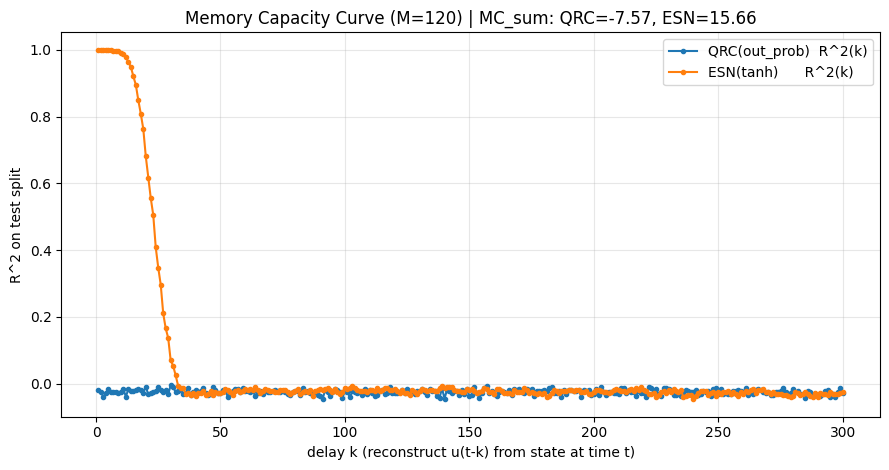

In [ ]:
fixed = build_fixed_reservoirs_for_mc(
    N=10,
    seed_qrc=43,
    seed_esn=43,
    Win_scale_qrc=1.0,
    esn_spectral_radius=0.9,
    esn_input_scale=0.5,
    esn_bias_scale=0.1,
)

res = run_mc_test_qrc_vs_esn(
    N=10,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    train_frac=0.7,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    carry_state=True,
    qrc_step_seed=43,
    # ESN
    leak_rate=1.0,
    fixed=fixed,
)

[QRC] M=600  MC_sum(<= 300) = -40.8428
[ESN] M=600  MC_sum(<= 300) = -4.3830


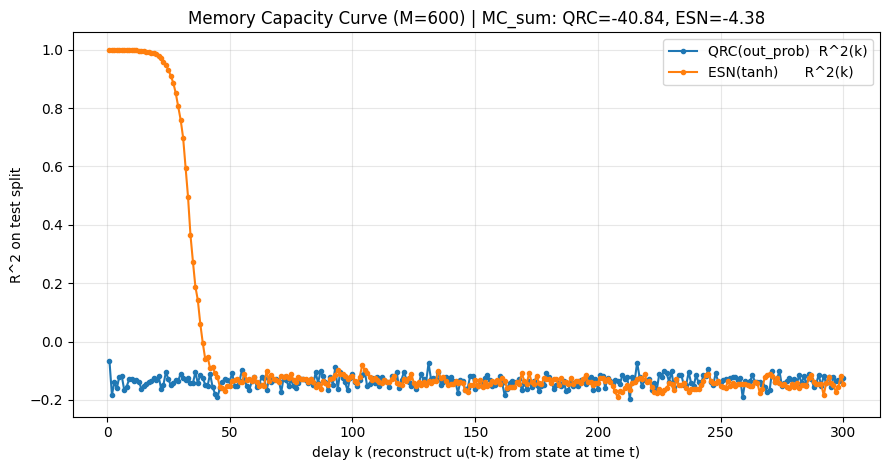

In [ ]:
fixed = build_fixed_reservoirs_for_mc(
    N=50,
    seed_qrc=43,
    seed_esn=43,
    Win_scale_qrc=1.0,
    esn_spectral_radius=0.9,
    esn_input_scale=0.5,
    esn_bias_scale=0.1,
)

res = run_mc_test_qrc_vs_esn(
    N=50,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    train_frac=0.7,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    carry_state=True,
    qrc_step_seed=43,
    # ESN
    leak_rate=1.0,
    fixed=fixed,
)

[QRC] M=1200  MC_sum(<= 300) = -94.8280
[ESN] M=1200  MC_sum(<= 300) = -48.5399


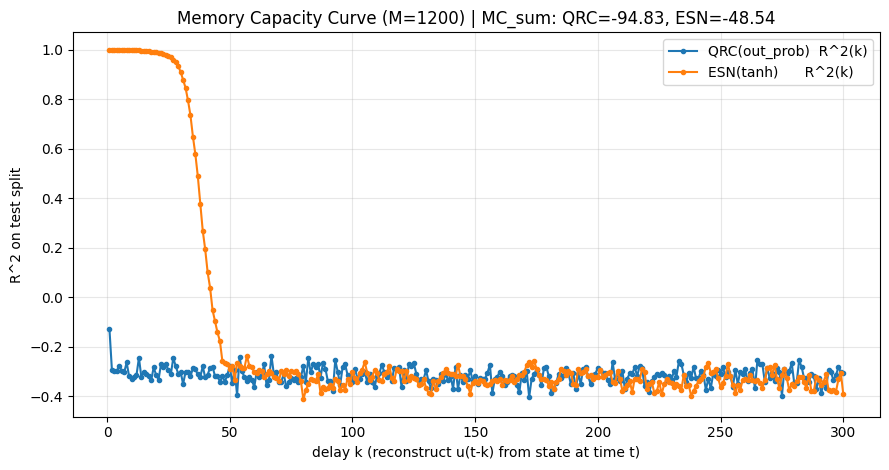

In [ ]:
fixed = build_fixed_reservoirs_for_mc(
    N=100,
    seed_qrc=43,
    seed_esn=43,
    Win_scale_qrc=1.0,
    esn_spectral_radius=0.9,
    esn_input_scale=0.5,
    esn_bias_scale=0.1,
)

res = run_mc_test_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    train_frac=0.7,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    norm_const=1.0,
    sign_mode="plus",
    input_mode="scale",
    carry_state=True,
    qrc_step_seed=43,
    # ESN
    leak_rate=1.0,
    fixed=fixed,
)

このQRCは確率的に瞬間的な検出確率を拾っているため、ある時点を線形回帰で復元する記憶はの持たないものの、ランダム相関は高次のモーメントまで拾えてNARMA予測ができる、と考えられる

corr^2でも比較してみる

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def corr2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        return np.nan
    c = np.corrcoef(y_true, y_pred)[0, 1]
    return float(c * c)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) 決定論QRC（スカラー入力版）
#    - 乱数注入なし
#    - 注入は連続値： excitation = (1 - x_state)
#    - 状態更新はリーキー： x_state <- (1-leak)*x_state + leak*(1-out_prob)
# =========================================================
import numpy as np
from typing import Tuple, Optional

def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",    # "pm" or "plus"
    input_mode: str = "scale",  # "scale" or "replace"
    Win: Optional[np.ndarray] = None,  # (M,) 入力マスク
    Win_scale: float = 1.0,
    x0: Optional[np.ndarray] = None,   # (M,) 初期状態（無励起確率）
    carry_state: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    inject_mask（確率的ON/OFF注入）版。

    Returns:
      S: (T,M) out_prob（検出確率）状態列
      xT: (M,) 最終状態（無励起確率）
    """
    U = np.asarray(U, float).reshape(-1)
    T = U.size

    M = 12 * N
    rng = np.random.default_rng(seed)

    # 入力マスク (M,)
    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    # 状態（無励起確率）
    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # スカラー → M次元
        u_vec = U[t] * Win  # (M,)
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # ① 確率注入（inject_mask）
        p = np.clip(x_state, 0.0, 1.0)     # 無励起確率
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)        # Trueなら注入

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # ②〜⑤ ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # ⑧ 非線形（安全版）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        # 状態更新（無励起確率として次へ）
        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)
        # carry_state=False: x_stateを更新しない（固定）

    return S, x_state



# =========================================================
# 2) ESN（スカラー入力版）※比較用（固定Wres/Win/bも可）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,
    *,
    Wres: Optional[np.ndarray] = None,
    Win: Optional[np.ndarray] = None,
    b: Optional[np.ndarray] = None,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)

    if Wres is None:
        Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
        eigvals = np.linalg.eigvals(Wres)
        sr = np.max(np.abs(eigvals)) + 1e-12
        Wres = Wres * (float(spectral_radius) / sr)
    else:
        Wres = np.asarray(Wres, float)

    if b is None:
        b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)
    else:
        b = np.asarray(b, float).reshape(-1)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S, {"Wres": Wres, "Win": Win, "b": b}


# =========================================================
# 3) MC曲線（corr^2 推奨）とR^2も併記
# =========================================================
def memory_capacity_curve_corr2(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
    clip_neg: bool = True,   # corr^2は本来>=0だが、数値誤差nan対策
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, float, float]:
    """
    Returns:
      ks: (k_max,)
      corr2s: (k_max,)  corr^2(k)
      r2s: (k_max,)     R^2(k)
      mc_corr2: sum corr^2(k)
      mc_r2:    sum R^2(k)（参考）
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    corr2s = np.full(k_max, np.nan, dtype=float)
    r2s = np.full(k_max, np.nan, dtype=float)

    for idx, k in enumerate(ks):
        t0 = max(washout, k)
        t1 = T
        if t1 - t0 < 200:
            continue

        X = S[t0:t1]
        y = u[t0 - k : t1 - k]

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 100 or (n - n_train) < 100:
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        c2 = corr2_score(yte, yhat)
        rr = r2_score(yte, yhat)

        if clip_neg and (rr is not np.nan):
            # R^2は負になり得るので、MC用途では 0 で打ち切る流儀も多い
            rr = max(0.0, rr) if np.isfinite(rr) else rr

        corr2s[idx] = c2
        r2s[idx] = rr

    mc_corr2 = float(np.nansum(corr2s))
    mc_r2 = float(np.nansum(r2s))
    return ks, corr2s, r2s, mc_corr2, mc_r2


# =========================================================
# 4) 実行：決定論QRC vs ESN のMC比較
# =========================================================
import numpy as np
import matplotlib.pyplot as plt
from typing import Optional, Dict, Tuple

def run_mc_qrc_vs_esn(
    *,
    N: int = 100,
    T_total: int = 8000,
    input_seed: int = 0,
    input_dist: str = "uniform",
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    # QRC params (inject_mask版)
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win_scale_qrc: float = 1.0,
    qrc_seed: int = 43,
    sign_mode_qrc: str = "plus",     # "plus" or "pm"
    carry_state_qrc: bool = True,
    x0_qrc: Optional[np.ndarray] = None,
    # ESN params
    esn_seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale_esn: float = 0.5,
    leak_rate_esn: float = 1.0,
    bias_scale_esn: float = 0.1,
):
    """
    inject_mask版QRC vs ESN の Memory Capacity (corr^2) 比較
    前提: 以下の関数が同じ環境に定義済みであること
      - simulate_qrc_states_outprob_scalar
      - simulate_esn_states_tanh_scalar
      - memory_capacity_curve_corr2
    """
    M = 12 * N

    # ---- input u(t)
    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # ---- QRC states (inject_mask)
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r, U=u,
        seed=qrc_seed,
        norm_const=norm_const,
        sign_mode=sign_mode_qrc,
        input_mode=input_mode,
        Win=None,
        Win_scale=Win_scale_qrc,
        x0=x0_qrc,
        carry_state=carry_state_qrc,
    )

    # ---- ESN states
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        seed=esn_seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate_esn,
        bias_scale=bias_scale_esn,
    )

    # ---- MC curves
    ks, c2_q, r2_q, mc_c2_q, mc_r2_q = memory_capacity_curve_corr2(
        S_qrc, u,
        k_max=k_max,
        washout=washout,
        train_frac=train_frac,
        ridge=ridge_readout,
    )
    _,  c2_e, r2_e, mc_c2_e, mc_r2_e = memory_capacity_curve_corr2(
        S_esn, u,
        k_max=k_max,
        washout=washout,
        train_frac=train_frac,
        ridge=ridge_readout,
    )

    print(f"[QRC inject_mask] M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_q:.4f}   (MC_R2_sum={mc_r2_q:.4f})")
    print(f"[ESN]           M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_e:.4f}   (MC_R2_sum={mc_r2_e:.4f})")

    # ---- plot
    plt.figure(figsize=(9, 4.8))
    plt.plot(ks, c2_q, marker="o", markersize=3, label=f"QRC corr^2(k)  MC={mc_c2_q:.2f}")
    plt.plot(ks, c2_e, marker="o", markersize=3, label=f"ESN corr^2(k)  MC={mc_c2_e:.2f}")
    plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
    plt.ylabel("corr^2 on test split")
    plt.title(f"Memory Capacity (corr^2) | M={M}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        "u": u,
        "ks": ks,
        "corr2_qrc": c2_q,
        "corr2_esn": c2_e,
        "mc_corr2_qrc": mc_c2_q,
        "mc_corr2_esn": mc_c2_e,
        "r2_qrc": r2_q,
        "r2_esn": r2_e,
        "mc_r2_qrc": mc_r2_q,
        "mc_r2_esn": mc_r2_e,
    }

[QRC inject_mask] M=1200  MC_corr2_sum(<= 300) = 0.1731   (MC_R2_sum=0.0000)
[ESN]           M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


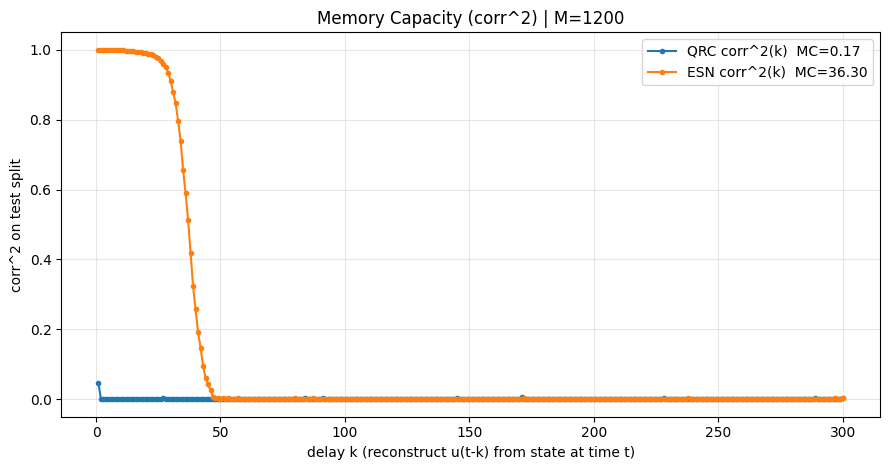

In [ ]:
res = run_mc_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC (inject_mask)
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    norm_const=1.0,
    sign_mode_qrc="plus",      # or "pm"
    carry_state_qrc=True,
    Win_scale_qrc=1.0,
    qrc_seed=43,
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

**確率注入、光子検出共にベルヌーイ試行**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def corr2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        return np.nan
    c = np.corrcoef(y_true, y_pred)[0, 1]
    return float(c * c)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) QRC: out_prob -> shots回 Bernoulli 観測し x_state にする（inject_mask維持）
#    x_state は「検出（=励起）確率の推定値」(0..1)
#    inject_mask の p は「無励起確率」なので p_noexc = 1 - x_state を使う
# =========================================================
def simulate_qrc_states_outprob_scalar_shots(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed_step: int = 43,        # ★ステップ内乱数（inject_mask, pm符号, shots観測）
    norm_const: float = 1.0,
    sign_mode: str = "plus",    # "pm" or "plus"
    input_mode: str = "scale",  # "scale" or "replace"
    Win: Optional[np.ndarray] = None,   # (M,) 入力マスク（固定推奨）
    shots: int = 100,           # ★ここが追加：ショット数
    carry_state: bool = True,
    x0: Optional[np.ndarray] = None,    # (M,) 初期状態（検出確率の推定値）
    store_true_outprob: bool = False,   # Trueなら理論 out_prob も返す
) -> Tuple[np.ndarray, np.ndarray, Optional[np.ndarray]]:
    """
    Returns:
      S: (T,M) 観測後の状態（= Binomial(shots,out_prob)/shots）
      xT: (M,) 最終状態（同上）
      out_prob_true: (T,M) 理論 out_prob（store_true_outprob=True のときのみ）
    """
    if shots <= 0:
        raise ValueError("shots must be positive")

    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed_step)

    if Win is None:
        raise ValueError("Win must be provided (fixed reservoir).")
    Win = np.asarray(Win, float).reshape(-1)
    if Win.size != M:
        raise ValueError(f"Win must be length {M}")

    # x_state は「検出（励起）確率の推定値」
    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)
    out_prob_true = np.empty((T, M), dtype=float) if store_true_outprob else None

    for t in range(T):
        # スカラー → M次元
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # ① inject_mask（確率注入）
        # x_state は「検出確率」なので、無励起確率は 1 - x_state
        p_noexc = np.clip(1.0 - x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p_noexc)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # ②〜⑤ ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # ⑧ 非線形（安全版）→ 理論 out_prob（0..1）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        if store_true_outprob:
            out_prob_true[t] = out_prob

        # ★ shots 回のベルヌーイ試行（各モード独立）→ 観測後の推定値
        # Binomial(shots, out_prob) / shots
        k_hits = rng.binomial(n=shots, p=out_prob)
        x_obs = k_hits.astype(float) / float(shots)

        S[t] = x_obs

        if carry_state:
            x_state = x_obs  # 次時刻へ観測値を保持

    return S, x_state, out_prob_true


# =========================================================
# 2) ESN: tanh 状態列（スカラー入力版）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,  # (T,)
    *,
    Wres: np.ndarray,  # (M,M)
    Win: np.ndarray,   # (M,)
    b: np.ndarray,     # (M,)
    leak_rate: float = 1.0,
) -> np.ndarray:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    Wres = np.asarray(Wres, float)
    Win = np.asarray(Win, float).reshape(-1)
    b = np.asarray(b, float).reshape(-1)
    if Wres.shape != (M, M):
        raise ValueError(f"Wres must be shape ({M},{M})")
    if Win.size != M:
        raise ValueError(f"Win must be length {M}")
    if b.size != M:
        raise ValueError(f"b must be length {M}")

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S


# =========================================================
# 3) 固定リザバー生成（比較を公平に）
# =========================================================
def build_fixed_reservoirs_for_mc(
    *,
    N: int,
    seed_qrc_win: int = 43,
    seed_esn: int = 43,
    Win_scale_qrc: float = 1.0,
    esn_spectral_radius: float = 0.9,
    esn_input_scale: float = 0.5,
    esn_bias_scale: float = 0.1,
) -> Dict[str, np.ndarray]:
    M = 12 * N

    rng_q = np.random.default_rng(seed_qrc_win)
    Win_qrc = rng_q.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale_qrc)

    rng_e = np.random.default_rng(seed_esn)
    Win_esn = rng_e.uniform(-1.0, 1.0, size=(M,)) * float(esn_input_scale)

    Wres = rng_e.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(esn_spectral_radius) / sr)

    b_esn = rng_e.uniform(-1.0, 1.0, size=M) * float(esn_bias_scale)

    return {"Win_qrc": Win_qrc, "Wres_esn": Wres, "Win_esn": Win_esn, "b_esn": b_esn}


# =========================================================
# 4) MC曲線（corr²本体 + R²併記）
# =========================================================
def memory_capacity_curve_corr2_and_r2(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
    clip_neg_r2: bool = True,
) -> Dict[str, np.ndarray]:
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    corr2s = np.full(k_max, np.nan, dtype=float)
    r2s = np.full(k_max, np.nan, dtype=float)

    for idx, k in enumerate(ks):
        t0 = max(washout, k)
        t1 = T
        if t1 - t0 < 200:
            continue

        X = S[t0:t1]
        y = u[t0 - k : t1 - k]

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 100 or (n - n_train) < 100:
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        c2 = corr2_score(yte, yhat)
        rr = r2_score(yte, yhat)
        if clip_neg_r2 and np.isfinite(rr):
            rr = max(0.0, rr)

        corr2s[idx] = c2
        r2s[idx] = rr

    return {
        "ks": ks,
        "corr2": corr2s,
        "r2": r2s,
        "mc_corr2": float(np.nansum(corr2s)),
        "mc_r2": float(np.nansum(r2s)),
    }


# =========================================================
# 5) 実行：QRC(shots観測) vs ESN の MC 比較
# =========================================================
def run_mc_benchmark_qrc_shots_vs_esn(
    *,
    N: int = 100,
    T_total: int = 8000,
    input_seed: int = 0,
    input_dist: str = "uniform",   # "uniform" or "normal"
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC settings
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    clip_neg_r2: bool = True,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode_qrc: str = "plus",    # "plus" or "pm"
    input_mode_qrc: str = "scale",
    carry_state_qrc: bool = True,
    x0_qrc: Optional[np.ndarray] = None,
    qrc_seed_step: int = 43,
    shots: int = 100,              # ★追加：ショット数
    # ESN params
    leak_rate_esn: float = 1.0,
    esn_spectral_radius: float = 0.9,
    esn_input_scale: float = 0.5,
    esn_bias_scale: float = 0.1,
    # fixed reservoir seeds
    seed_qrc_win: int = 43,
    seed_esn: int = 43,
    Win_scale_qrc: float = 1.0,
    # plotting
    show_plot: bool = True,
) -> Dict[str, object]:
    M = 12 * N

    # ---- input u(t)
    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # ---- fixed reservoirs
    fixed = build_fixed_reservoirs_for_mc(
        N=N,
        seed_qrc_win=seed_qrc_win,
        seed_esn=seed_esn,
        Win_scale_qrc=Win_scale_qrc,
        esn_spectral_radius=esn_spectral_radius,
        esn_input_scale=esn_input_scale,
        esn_bias_scale=esn_bias_scale,
    )

    # ---- simulate QRC (shots)
    S_qrc, _, _ = simulate_qrc_states_outprob_scalar_shots(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r, U=u,
        seed_step=qrc_seed_step,
        norm_const=norm_const,
        sign_mode=sign_mode_qrc,
        input_mode=input_mode_qrc,
        Win=fixed["Win_qrc"],
        shots=shots,
        carry_state=carry_state_qrc,
        x0=x0_qrc,
        store_true_outprob=False,
    )

    # ---- simulate ESN
    S_esn = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        Wres=fixed["Wres_esn"], Win=fixed["Win_esn"], b=fixed["b_esn"],
        leak_rate=leak_rate_esn,
    )

    # ---- MC curves
    mc_q = memory_capacity_curve_corr2_and_r2(
        S_qrc, u,
        k_max=k_max, washout=washout, train_frac=train_frac,
        ridge=ridge_readout, clip_neg_r2=clip_neg_r2
    )
    mc_e = memory_capacity_curve_corr2_and_r2(
        S_esn, u,
        k_max=k_max, washout=washout, train_frac=train_frac,
        ridge=ridge_readout, clip_neg_r2=clip_neg_r2
    )

    print(f"[QRC shots]     M={M} shots={shots}  MC_corr2_sum(<= {k_max}) = {mc_q['mc_corr2']:.4f}   (MC_R2_sum={mc_q['mc_r2']:.4f})")
    print(f"[ESN]          M={M}             MC_corr2_sum(<= {k_max}) = {mc_e['mc_corr2']:.4f}   (MC_R2_sum={mc_e['mc_r2']:.4f})")

    if show_plot:
        ks = mc_q["ks"]

        plt.figure(figsize=(9, 4.8))
        plt.plot(ks, mc_q["corr2"], marker="o", markersize=3,
                 label=f"QRC(shots) corr^2(k)  MC={mc_q['mc_corr2']:.2f}")
        plt.plot(ks, mc_e["corr2"], marker="o", markersize=3,
                 label=f"ESN        corr^2(k)  MC={mc_e['mc_corr2']:.2f}")
        plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
        plt.ylabel("corr^2 on test split")
        plt.title(f"Memory Capacity (corr^2) | M={M} | shots={shots}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(9, 4.8))
        plt.plot(ks, mc_q["r2"], marker="o", markersize=3,
                 label=f"QRC(shots) R^2(k)  sum={mc_q['mc_r2']:.2f}")
        plt.plot(ks, mc_e["r2"], marker="o", markersize=3,
                 label=f"ESN        R^2(k)  sum={mc_e['mc_r2']:.2f}")
        plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
        plt.ylabel("R^2 on test split")
        plt.title(f"Memory Capacity (R^2) | clip_neg_r2={clip_neg_r2} | M={M} | shots={shots}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {
        "u": u,
        "S_qrc": S_qrc,
        "S_esn": S_esn,
        "mc_qrc": mc_q,
        "mc_esn": mc_e,
        "fixed": fixed,
    }

[QRC shots]     M=1200 shots=1  MC_corr2_sum(<= 300) = 0.1507   (MC_R2_sum=0.0000)
[ESN]          M=1200             MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


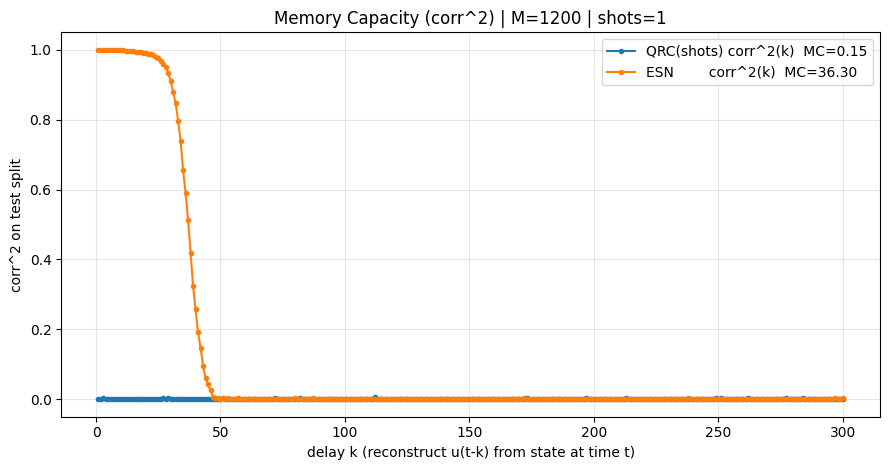

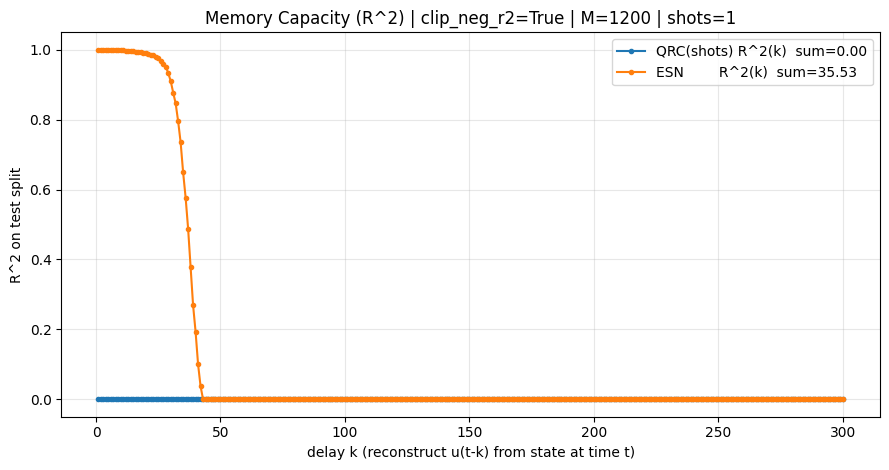

In [ ]:
if __name__ == "__main__":
    res = run_mc_benchmark_qrc_shots_vs_esn(
        N=100,
        T_total=8000,
        input_seed=0,
        input_dist="uniform",
        u_low=-0.5,
        u_high=0.5,
        k_max=300,
        washout=800,
        ridge_readout=1e-6,
        # QRC
        alpha=1.0,
        beta=0.7,
        squeeze_r=0.3,
        norm_const=1.0,
        sign_mode_qrc="plus",
        carry_state_qrc=True,
        qrc_seed_step=43,
        shots=1,           # ★ここを 1,2,5,10,20,50,... とスイープ
        # ESN
        esn_spectral_radius=0.9,
        leak_rate_esn=1.0,
    )

In [ ]:
if __name__ == "__main__":
    res = run_mc_benchmark_qrc_shots_vs_esn(
        N=100,
        T_total=8000,
        input_seed=0,
        input_dist="uniform",
        u_low=-0.5,
        u_high=0.5,
        k_max=300,
        washout=800,
        ridge_readout=1e-6,
        # QRC
        alpha=1.0,
        beta=0.7,
        squeeze_r=0.3,
        norm_const=1.0,
        sign_mode_qrc="plus",
        carry_state_qrc=True,
        qrc_seed_step=43,
        shots=10,           # ★ここを 1,2,5,10,20,50,... とスイープ
        # ESN
        esn_spectral_radius=0.9,
        leak_rate_esn=1.0,
    )

[QRC shots]     M=1200 shots=100  MC_corr2_sum(<= 300) = 0.1869   (MC_R2_sum=0.0000)
[ESN]          M=1200             MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


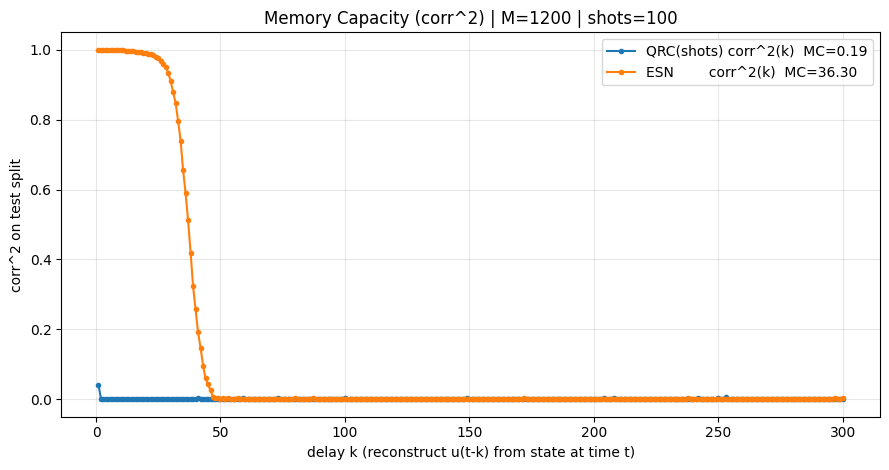

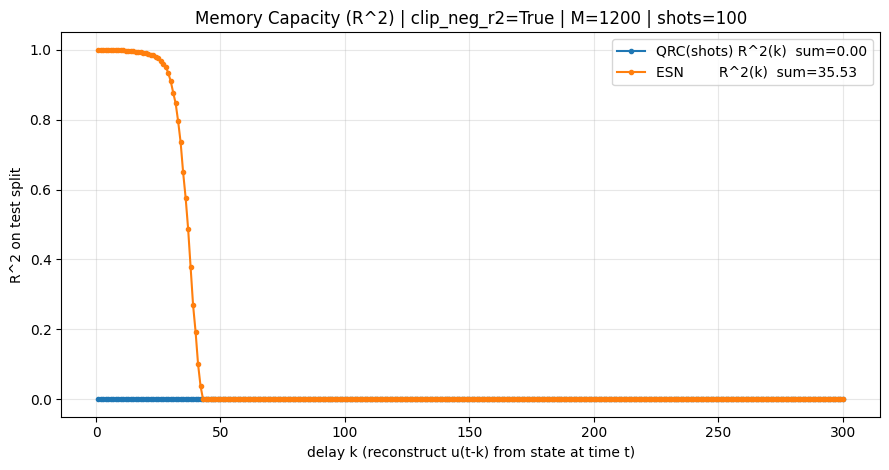

In [ ]:
if __name__ == "__main__":
    res = run_mc_benchmark_qrc_shots_vs_esn(
        N=100,
        T_total=8000,
        input_seed=0,
        input_dist="uniform",
        u_low=-0.5,
        u_high=0.5,
        k_max=300,
        washout=800,
        ridge_readout=1e-6,
        # QRC
        alpha=1.0,
        beta=0.7,
        squeeze_r=0.3,
        norm_const=1.0,
        sign_mode_qrc="plus",
        carry_state_qrc=True,
        qrc_seed_step=43,
        shots=100,           # ★ここを 1,2,5,10,20,50,... とスイープ
        # ESN
        esn_spectral_radius=0.9,
        leak_rate_esn=1.0,
    )

**光子検出を決定論的にする**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # biasは正則化しない
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    w = theta[:M]
    b = float(theta[M])
    return w, b

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def corr2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        return np.nan
    c = np.corrcoef(y_true, y_pred)[0, 1]
    return float(c * c)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) QRC: out_prob 状態列（スカラー入力版・inject_mask）
#    ※あなたの「安全版⑧」を維持
# =========================================================
def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed_step: int = 43,        # ★ステップ内乱数（inject_mask, pm符号）
    norm_const: float = 1.0,
    sign_mode: str = "plus",    # "pm" or "plus"
    input_mode: str = "scale",  # "scale" or "replace"
    Win: Optional[np.ndarray] = None,   # (M,) 入力マスク（固定可能）
    carry_state: bool = True,
    x0: Optional[np.ndarray] = None,    # (M,) 初期状態（固定可能）
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed_step)

    if Win is None:
        raise ValueError("Win must be provided (fixed reservoir).")

    Win = np.asarray(Win, float).reshape(-1)
    if Win.size != M:
        raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # スカラー → M次元
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # ① 確率注入（inject_mask）
        p = np.clip(x_state, 0.0, 1.0)      # 無励起確率
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        # ②〜⑤ ネットワーク
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # ⑧ 非線形（安全版）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    return S, x_state


# =========================================================
# 2) ESN: tanh 状態列（スカラー入力版）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,  # (T,)
    *,
    Wres: np.ndarray,  # (M,M)
    Win: np.ndarray,   # (M,)
    b: np.ndarray,     # (M,)
    leak_rate: float = 1.0,
) -> np.ndarray:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    Wres = np.asarray(Wres, float)
    Win = np.asarray(Win, float).reshape(-1)
    b = np.asarray(b, float).reshape(-1)
    if Wres.shape != (M, M):
        raise ValueError(f"Wres must be shape ({M},{M})")
    if Win.size != M:
        raise ValueError(f"Win must be length {M}")
    if b.size != M:
        raise ValueError(f"b must be length {M}")

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S


# =========================================================
# 3) 固定リザバー生成（比較を公平に）
# =========================================================
def build_fixed_reservoirs_for_mc(
    *,
    N: int,
    seed_qrc_win: int = 43,
    seed_esn: int = 43,
    Win_scale_qrc: float = 1.0,
    esn_spectral_radius: float = 0.9,
    esn_input_scale: float = 0.5,
    esn_bias_scale: float = 0.1,
) -> Dict[str, np.ndarray]:
    M = 12 * N

    # QRC Win
    rng_q = np.random.default_rng(seed_qrc_win)
    Win_qrc = rng_q.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale_qrc)

    # ESN Win/Wres/b
    rng_e = np.random.default_rng(seed_esn)
    Win_esn = rng_e.uniform(-1.0, 1.0, size=(M,)) * float(esn_input_scale)

    Wres = rng_e.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(esn_spectral_radius) / sr)

    b_esn = rng_e.uniform(-1.0, 1.0, size=M) * float(esn_bias_scale)

    return {
        "Win_qrc": Win_qrc,
        "Wres_esn": Wres,
        "Win_esn": Win_esn,
        "b_esn": b_esn,
    }


# =========================================================
# 4) MC曲線（corr²を本体に、R²も併記）
# =========================================================
def memory_capacity_curve_corr2_and_r2(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
    clip_neg_r2: bool = True,
) -> Dict[str, np.ndarray]:
    """
    u(t-k) を S(t) から線形回帰で復元して、
      corr²(k), R²(k) を返す
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    corr2s = np.full(k_max, np.nan, dtype=float)
    r2s = np.full(k_max, np.nan, dtype=float)

    for idx, k in enumerate(ks):
        t0 = max(washout, k)
        t1 = T
        if t1 - t0 < 200:
            continue

        X = S[t0:t1]
        y = u[t0 - k : t1 - k]

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 100 or (n - n_train) < 100:
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        c2 = corr2_score(yte, yhat)
        rr = r2_score(yte, yhat)
        if clip_neg_r2 and np.isfinite(rr):
            rr = max(0.0, rr)

        corr2s[idx] = c2
        r2s[idx] = rr

    mc_corr2 = float(np.nansum(corr2s))
    mc_r2 = float(np.nansum(r2s))

    return {
        "ks": ks,
        "corr2": corr2s,
        "r2": r2s,
        "mc_corr2": mc_corr2,
        "mc_r2": mc_r2,
    }


# =========================================================
# 5) 実行：固定リザバー + corr²MC（R²併記）で QRC vs ESN
# =========================================================
def run_mc_benchmark_qrc_vs_esn(
    *,
    N: int = 100,
    T_total: int = 8000,
    input_seed: int = 0,
    input_dist: str = "uniform",   # "uniform" or "normal"
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC settings
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    clip_neg_r2: bool = True,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode_qrc: str = "plus",    # "plus" or "pm"
    input_mode_qrc: str = "scale",
    carry_state_qrc: bool = True,
    x0_qrc: Optional[np.ndarray] = None,
    qrc_seed_step: int = 43,        # ★注入に使う乱数seed
    # ESN params
    leak_rate_esn: float = 1.0,
    esn_spectral_radius: float = 0.9,
    esn_input_scale: float = 0.5,
    esn_bias_scale: float = 0.1,
    # fixed reservoir seeds
    seed_qrc_win: int = 43,
    seed_esn: int = 43,
    Win_scale_qrc: float = 1.0,
    # plotting
    show_plot: bool = True,
) -> Dict[str, object]:
    M = 12 * N

    # ---- input u(t)
    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # ---- build fixed reservoirs
    fixed = build_fixed_reservoirs_for_mc(
        N=N,
        seed_qrc_win=seed_qrc_win,
        seed_esn=seed_esn,
        Win_scale_qrc=Win_scale_qrc,
        esn_spectral_radius=esn_spectral_radius,
        esn_input_scale=esn_input_scale,
        esn_bias_scale=esn_bias_scale,
    )
    Win_qrc = fixed["Win_qrc"]
    Wres_esn = fixed["Wres_esn"]
    Win_esn = fixed["Win_esn"]
    b_esn = fixed["b_esn"]

    # ---- simulate states
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r, U=u,
        seed_step=qrc_seed_step,
        norm_const=norm_const,
        sign_mode=sign_mode_qrc,
        input_mode=input_mode_qrc,
        Win=Win_qrc,
        carry_state=carry_state_qrc,
        x0=x0_qrc,
    )

    S_esn = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        Wres=Wres_esn, Win=Win_esn, b=b_esn,
        leak_rate=leak_rate_esn,
    )

    # ---- MC curves
    mc_q = memory_capacity_curve_corr2_and_r2(
        S_qrc, u,
        k_max=k_max, washout=washout, train_frac=train_frac,
        ridge=ridge_readout, clip_neg_r2=clip_neg_r2
    )
    mc_e = memory_capacity_curve_corr2_and_r2(
        S_esn, u,
        k_max=k_max, washout=washout, train_frac=train_frac,
        ridge=ridge_readout, clip_neg_r2=clip_neg_r2
    )

    print(f"[QRC inject_mask] M={M}  MC_corr2_sum(<= {k_max}) = {mc_q['mc_corr2']:.4f}   (MC_R2_sum={mc_q['mc_r2']:.4f})")
    print(f"[ESN]           M={M}  MC_corr2_sum(<= {k_max}) = {mc_e['mc_corr2']:.4f}   (MC_R2_sum={mc_e['mc_r2']:.4f})")

    if show_plot:
        ks = mc_q["ks"]

        # corr^2 plot
        plt.figure(figsize=(9, 4.8))
        plt.plot(ks, mc_q["corr2"], marker="o", markersize=3,
                 label=f"QRC corr^2(k)  MC={mc_q['mc_corr2']:.2f}")
        plt.plot(ks, mc_e["corr2"], marker="o", markersize=3,
                 label=f"ESN corr^2(k)  MC={mc_e['mc_corr2']:.2f}")
        plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
        plt.ylabel("corr^2 on test split")
        plt.title(f"Memory Capacity (corr^2) | M={M}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # R^2 plot (optional but useful)
        plt.figure(figsize=(9, 4.8))
        plt.plot(ks, mc_q["r2"], marker="o", markersize=3,
                 label=f"QRC R^2(k)  sum={mc_q['mc_r2']:.2f}")
        plt.plot(ks, mc_e["r2"], marker="o", markersize=3,
                 label=f"ESN R^2(k)  sum={mc_e['mc_r2']:.2f}")
        plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
        plt.ylabel("R^2 on test split")
        plt.title(f"Memory Capacity (R^2) | clip_neg_r2={clip_neg_r2} | M={M}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {
        "u": u,
        "S_qrc": S_qrc,
        "S_esn": S_esn,
        "mc_qrc": mc_q,
        "mc_esn": mc_e,
        "fixed": fixed,
        "settings": {
            "N": N, "M": M, "T_total": T_total, "k_max": k_max, "washout": washout,
            "train_frac": train_frac, "ridge_readout": ridge_readout, "clip_neg_r2": clip_neg_r2,
            "qrc_seed_step": qrc_seed_step, "seed_qrc_win": seed_qrc_win, "seed_esn": seed_esn,
        }
    }

[QRC inject_mask] M=1200  MC_corr2_sum(<= 300) = 0.1857   (MC_R2_sum=0.0000)
[ESN]           M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


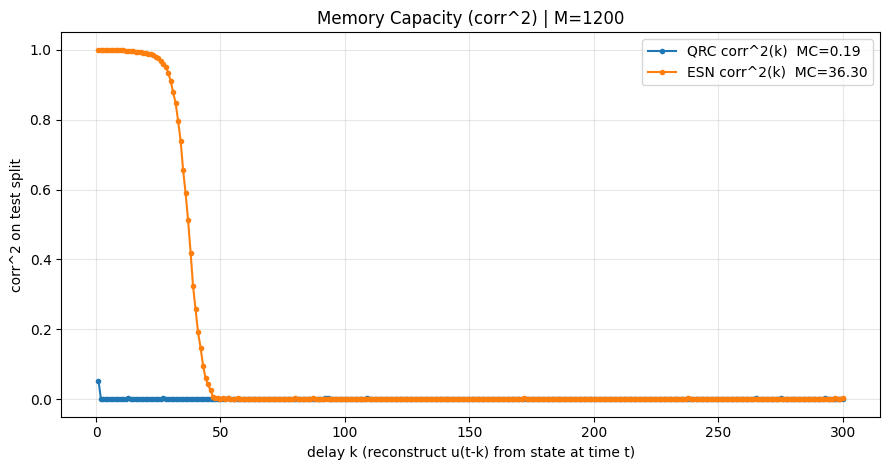

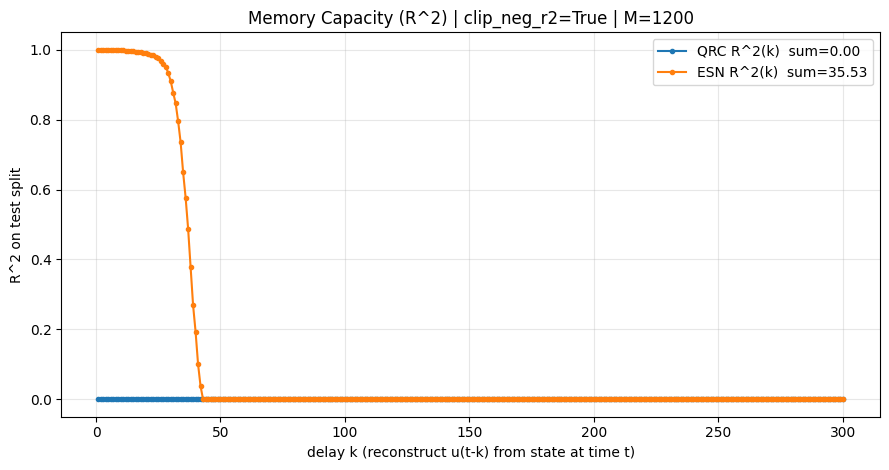

In [ ]:
if __name__ == "__main__":
    res = run_mc_benchmark_qrc_vs_esn(
        N=100,
        T_total=8000,
        input_seed=0,
        input_dist="uniform",
        u_low=-0.5,
        u_high=0.5,
        k_max=300,
        washout=800,
        ridge_readout=1e-6,
        clip_neg_r2=True,
        # QRC
        alpha=1.0,
        beta=0.7,
        squeeze_r=0.3,
        norm_const=1.0,
        sign_mode_qrc="plus",
        carry_state_qrc=True,
        qrc_seed_step=43,      # ★ここだけ変えるとQRCの“注入乱数”が変わる
        # ESN
        esn_spectral_radius=0.9,
        leak_rate_esn=1.0,
    )

**確率注入（スイッチの切り替え）をベルヌーイ試行から決定論的（光子検出確率と一致）にしてみると？**

(2-3)左図

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def corr2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        return np.nan
    c = np.corrcoef(y_true, y_pred)[0, 1]
    return float(c * c)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) 決定論QRC（スカラー入力版）
#    - 乱数注入なし
#    - 注入は連続値： excitation = (1 - x_state)
#    - 状態更新はリーキー： x_state <- (1-leak)*x_state + leak*(1-out_prob)
# =========================================================
def simulate_qrc_states_outprob_scalar_deterministic(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed: int = 43,             # Win生成だけに使用（内部乱数なし）
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,   # (M,)
    Win_scale: float = 1.0,
    x0: Optional[np.ndarray] = None,    # (M,)
    state_leak: float = 0.3,            # 0<leak<=1  推奨 0.05〜0.5
    sign_mode: str = "plus",            # "plus" or "alt"（決定論符号）
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N

    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    leak = float(state_leak)
    if not (0.0 < leak <= 1.0):
        raise ValueError("state_leak must be in (0,1]")

    # 決定論符号
    if sign_mode == "plus":
        signs = np.ones(M, dtype=float)
    elif sign_mode == "alt":
        signs = np.where((np.arange(M) % 2) == 0, 1.0, -1.0)
    else:
        raise ValueError('sign_mode must be "plus" or "alt".')

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # 入力（スカラー→M次元）
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # --- ① 注入（連続値・決定論）
        # 以前の inject_mask（確率的ON/OFF）を、excitation=(1-x_state) で連続化
        p_noexc = np.clip(x_state, 0.0, 1.0)
        excitation = 1.0 - p_noexc              # 0..1
        s = signs * float(alpha) * excitation   # (M,)

        # --- ②〜⑤ ネットワーク（同じ）
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # --- ⑧ 非線形（安全版）
        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        # --- 状態更新（連続値・リーキー）
        x_target = np.clip(1.0 - out_prob, 0.0, 1.0)
        x_state = (1.0 - leak) * x_state + leak * x_target

    return S, x_state


# =========================================================
# 2) ESN（スカラー入力版）※比較用（固定Wres/Win/bも可）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,
    *,
    Wres: Optional[np.ndarray] = None,
    Win: Optional[np.ndarray] = None,
    b: Optional[np.ndarray] = None,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)

    if Wres is None:
        Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
        eigvals = np.linalg.eigvals(Wres)
        sr = np.max(np.abs(eigvals)) + 1e-12
        Wres = Wres * (float(spectral_radius) / sr)
    else:
        Wres = np.asarray(Wres, float)

    if b is None:
        b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)
    else:
        b = np.asarray(b, float).reshape(-1)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S, {"Wres": Wres, "Win": Win, "b": b}


# =========================================================
# 3) MC曲線（corr^2 推奨）とR^2も併記
# =========================================================
def memory_capacity_curve_corr2(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
    clip_neg: bool = True,   # corr^2は本来>=0だが、数値誤差nan対策
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, float, float]:
    """
    Returns:
      ks: (k_max,)
      corr2s: (k_max,)  corr^2(k)
      r2s: (k_max,)     R^2(k)
      mc_corr2: sum corr^2(k)
      mc_r2:    sum R^2(k)（参考）
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    corr2s = np.full(k_max, np.nan, dtype=float)
    r2s = np.full(k_max, np.nan, dtype=float)

    for idx, k in enumerate(ks):
        t0 = max(washout, k)
        t1 = T
        if t1 - t0 < 200:
            continue

        X = S[t0:t1]
        y = u[t0 - k : t1 - k]

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 100 or (n - n_train) < 100:
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        c2 = corr2_score(yte, yhat)
        rr = r2_score(yte, yhat)

        if clip_neg and (rr is not np.nan):
            # R^2は負になり得るので、MC用途では 0 で打ち切る流儀も多い
            rr = max(0.0, rr) if np.isfinite(rr) else rr

        corr2s[idx] = c2
        r2s[idx] = rr

    mc_corr2 = float(np.nansum(corr2s))
    mc_r2 = float(np.nansum(r2s))
    return ks, corr2s, r2s, mc_corr2, mc_r2


# =========================================================
# 4) 実行：決定論QRC vs ESN のMC比較
# =========================================================
def run_mc_deterministic_qrc_vs_esn(
    *,
    N: int = 100,
    T_total: int = 8000,
    input_seed: int = 0,
    input_dist: str = "uniform",
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win_scale_qrc: float = 1.0,
    qrc_seed_win: int = 43,
    state_leak: float = 0.3,
    sign_mode: str = "plus",   # "plus" or "alt"
    # ESN params
    esn_seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale_esn: float = 0.5,
    leak_rate_esn: float = 1.0,
    bias_scale_esn: float = 0.1,
):
    M = 12 * N

    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # --- Deterministic QRC states
    S_qrc, _ = simulate_qrc_states_outprob_scalar_deterministic(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r, U=u,
        seed=qrc_seed_win,
        norm_const=norm_const,
        input_mode=input_mode,
        Win=None, Win_scale=Win_scale_qrc,
        state_leak=state_leak,
        sign_mode=sign_mode,
    )

    # --- ESN states
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        seed=esn_seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate_esn,
        bias_scale=bias_scale_esn,
    )

    ks, c2_q, r2_q, mc_c2_q, mc_r2_q = memory_capacity_curve_corr2(
        S_qrc, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )
    _,  c2_e, r2_e, mc_c2_e, mc_r2_e = memory_capacity_curve_corr2(
        S_esn, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )

    print(f"[Det-QRC] M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_q:.4f}   (MC_R2_sum={mc_r2_q:.4f})")
    print(f"[ESN]      M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_e:.4f}   (MC_R2_sum={mc_r2_e:.4f})")

    # --- plot corr^2 curve
    plt.figure(figsize=(9, 4.8))
    plt.plot(ks, c2_q, marker="o", markersize=3, label=f"Det-QRC corr^2(k)  MC={mc_c2_q:.2f}")
    plt.plot(ks, c2_e, marker="o", markersize=3, label=f"ESN     corr^2(k)  MC={mc_c2_e:.2f}")
    plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
    plt.ylabel("corr^2 on test split")
    plt.title(f"Memory Capacity (corr^2) | M={M}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        "u": u,
        "ks": ks,
        "corr2_det_qrc": c2_q,
        "corr2_esn": c2_e,
        "mc_corr2_det_qrc": mc_c2_q,
        "mc_corr2_esn": mc_c2_e,
        "r2_det_qrc": r2_q,
        "r2_esn": r2_e,
        "mc_r2_det_qrc": mc_r2_q,
        "mc_r2_esn": mc_r2_e,
    }

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 1.8273   (MC_R2_sum=1.6701)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


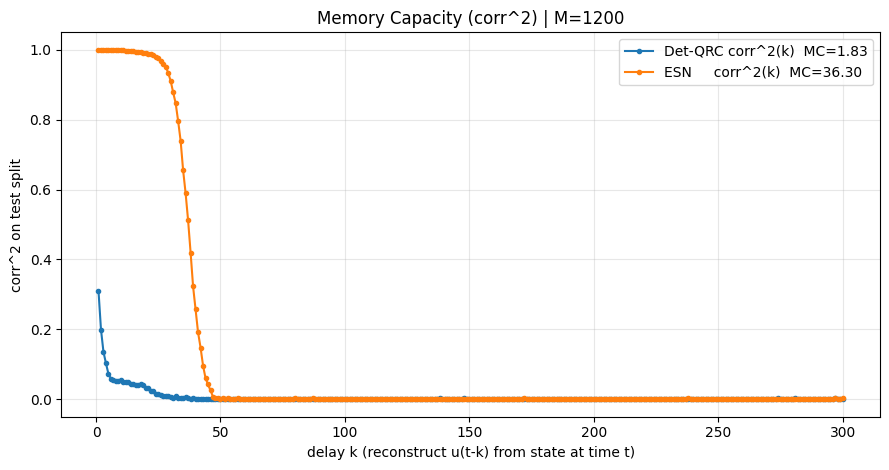

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.1,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 2.0096   (MC_R2_sum=1.9100)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


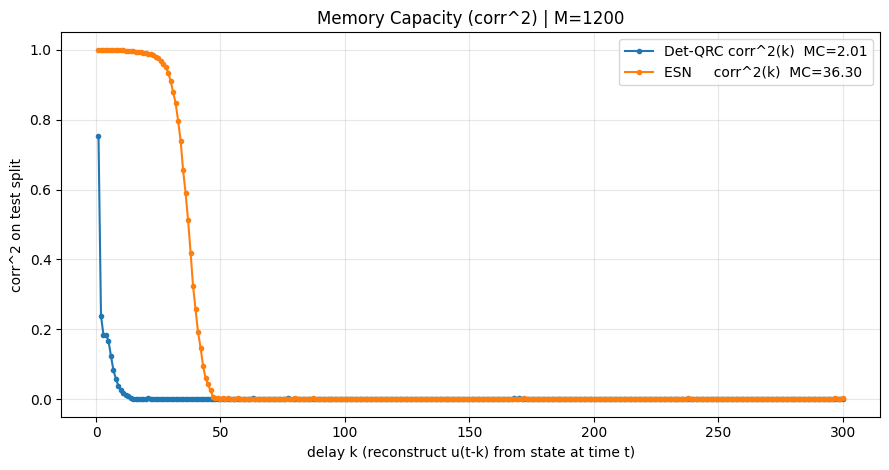

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.3,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 2.0797   (MC_R2_sum=1.9811)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


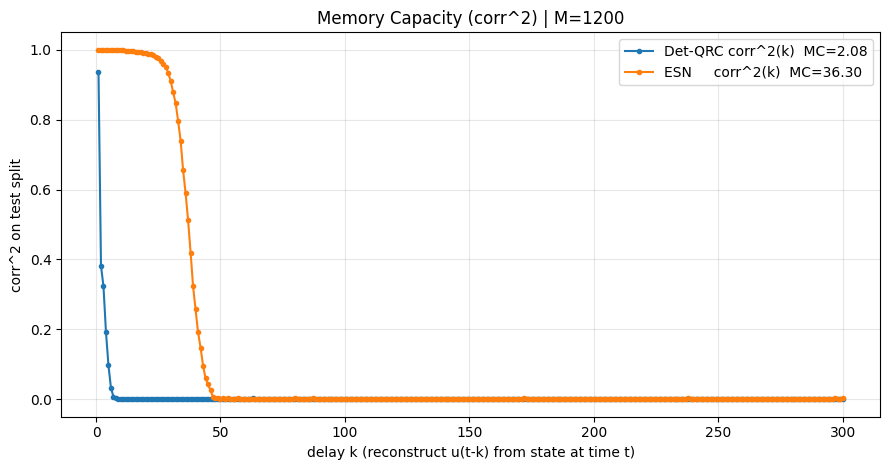

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.5,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 2.5437   (MC_R2_sum=2.1710)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


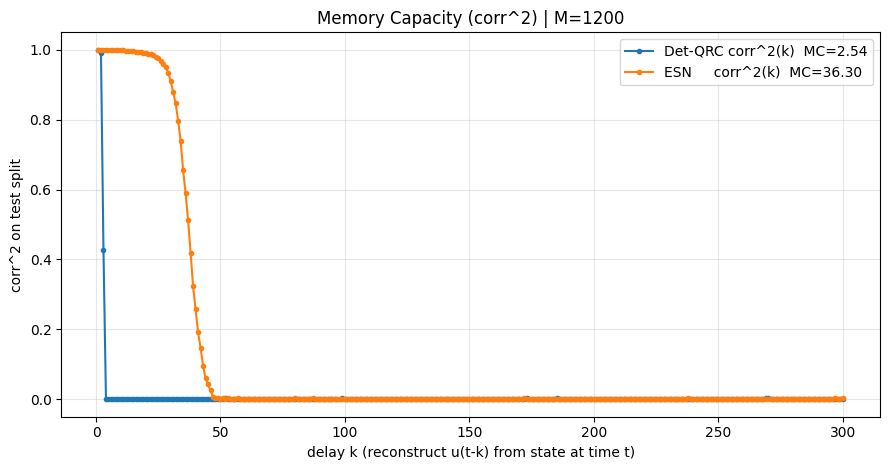

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=1.0,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

**光子検出確率の部分を線形にすると？**

(2-3)右図

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-6) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def corr2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        return np.nan
    c = np.corrcoef(y_true, y_pred)[0, 1]
    return float(c * c)

def r2_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = np.var(y_true)
    if var < 1e-12:
        return np.nan
    mse = np.mean((y_true - y_pred) ** 2)
    return float(1.0 - mse / var)


# =========================================================
# 1) 決定論QRC（スカラー入力版）
#    - 乱数注入なし
#    - 注入は連続値： excitation = (1 - x_state)
#    - 状態更新はリーキー： x_state <- (1-leak)*x_state + leak*(1-out_prob)
# =========================================================
def simulate_qrc_states_outprob_scalar_deterministic(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,              # (T,) スカラー入力
    *,
    seed: int = 43,             # Win生成だけに使用（内部乱数なし）
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,   # (M,)
    Win_scale: float = 1.0,
    x0: Optional[np.ndarray] = None,    # (M,)
    state_leak: float = 0.3,            # 0<leak<=1  推奨 0.05〜0.5
    sign_mode: str = "plus",            # "plus" or "alt"（決定論符号）
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N

    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    leak = float(state_leak)
    if not (0.0 < leak <= 1.0):
        raise ValueError("state_leak must be in (0,1]")

    # 決定論符号
    if sign_mode == "plus":
        signs = np.ones(M, dtype=float)
    elif sign_mode == "alt":
        signs = np.where((np.arange(M) % 2) == 0, 1.0, -1.0)
    else:
        raise ValueError('sign_mode must be "plus" or "alt".')

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        # 入力（スカラー→M次元）
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode == "replace":
            pass
        else:
            raise ValueError('input_mode must be "scale" or "replace".')

        # --- ① 注入（連続値・決定論）
        # 以前の inject_mask（確率的ON/OFF）を、excitation=(1-x_state) で連続化
        p_noexc = np.clip(x_state, 0.0, 1.0)
        excitation = 1.0 - p_noexc              # 0..1
        s = signs * float(alpha) * excitation   # (M,)

        # --- ②〜⑤ ネットワーク（同じ）
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # --- ⑧ 非線形（安全版）
        out_prob = 1.0 * np.real(fin) + float(0.5)
        out_prob = np.clip(out_prob.astype(float), 0.0, 1.0)

        S[t] = out_prob

        # --- 状態更新（連続値・リーキー）
        x_target = np.clip(1.0 - out_prob, 0.0, 1.0)
        x_state = (1.0 - leak) * x_state + leak * x_target

    return S, x_state


# =========================================================
# 2) ESN（スカラー入力版）※比較用（固定Wres/Win/bも可）
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,
    *,
    Wres: Optional[np.ndarray] = None,
    Win: Optional[np.ndarray] = None,
    b: Optional[np.ndarray] = None,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)

    if Wres is None:
        Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
        eigvals = np.linalg.eigvals(Wres)
        sr = np.max(np.abs(eigvals)) + 1e-12
        Wres = Wres * (float(spectral_radius) / sr)
    else:
        Wres = np.asarray(Wres, float)

    if b is None:
        b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)
    else:
        b = np.asarray(b, float).reshape(-1)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S, {"Wres": Wres, "Win": Win, "b": b}


# =========================================================
# 3) MC曲線（corr^2 推奨）とR^2も併記
# =========================================================
def memory_capacity_curve_corr2(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge: float = 1e-6,
    clip_neg: bool = True,   # corr^2は本来>=0だが、数値誤差nan対策
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, float, float]:
    """
    Returns:
      ks: (k_max,)
      corr2s: (k_max,)  corr^2(k)
      r2s: (k_max,)     R^2(k)
      mc_corr2: sum corr^2(k)
      mc_r2:    sum R^2(k)（参考）
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u length mismatch")

    ks = np.arange(1, k_max + 1, dtype=int)
    corr2s = np.full(k_max, np.nan, dtype=float)
    r2s = np.full(k_max, np.nan, dtype=float)

    for idx, k in enumerate(ks):
        t0 = max(washout, k)
        t1 = T
        if t1 - t0 < 200:
            continue

        X = S[t0:t1]
        y = u[t0 - k : t1 - k]

        n = X.shape[0]
        n_train = int(np.floor(n * train_frac))
        if n_train < 100 or (n - n_train) < 100:
            continue

        Xtr, Xte = X[:n_train], X[n_train:]
        ytr, yte = y[:n_train], y[n_train:]

        w, b = fit_readout_ridge(Xtr, ytr, ridge=ridge)
        yhat = predict_readout(Xte, w, b)

        c2 = corr2_score(yte, yhat)
        rr = r2_score(yte, yhat)

        if clip_neg and (rr is not np.nan):
            # R^2は負になり得るので、MC用途では 0 で打ち切る流儀も多い
            rr = max(0.0, rr) if np.isfinite(rr) else rr

        corr2s[idx] = c2
        r2s[idx] = rr

    mc_corr2 = float(np.nansum(corr2s))
    mc_r2 = float(np.nansum(r2s))
    return ks, corr2s, r2s, mc_corr2, mc_r2


# =========================================================
# 4) 実行：決定論QRC vs ESN のMC比較
# =========================================================
def run_mc_deterministic_qrc_vs_esn(
    *,
    N: int = 100,
    T_total: int = 8000,
    input_seed: int = 0,
    input_dist: str = "uniform",
    u_low: float = -0.5,
    u_high: float = 0.5,
    u_std: float = 0.2,
    # MC
    k_max: int = 300,
    washout: int = 800,
    train_frac: float = 0.7,
    ridge_readout: float = 1e-6,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win_scale_qrc: float = 1.0,
    qrc_seed_win: int = 43,
    state_leak: float = 0.3,
    sign_mode: str = "plus",   # "plus" or "alt"
    # ESN params
    esn_seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale_esn: float = 0.5,
    leak_rate_esn: float = 1.0,
    bias_scale_esn: float = 0.1,
):
    M = 12 * N

    rng = np.random.default_rng(input_seed)
    if input_dist == "uniform":
        u = rng.uniform(u_low, u_high, size=T_total).astype(float)
    elif input_dist == "normal":
        u = rng.normal(0.0, u_std, size=T_total).astype(float)
    else:
        raise ValueError('input_dist must be "uniform" or "normal"')

    # --- Deterministic QRC states
    S_qrc, _ = simulate_qrc_states_outprob_scalar_deterministic(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r, U=u,
        seed=qrc_seed_win,
        norm_const=norm_const,
        input_mode=input_mode,
        Win=None, Win_scale=Win_scale_qrc,
        state_leak=state_leak,
        sign_mode=sign_mode,
    )

    # --- ESN states
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=u,
        seed=esn_seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate_esn,
        bias_scale=bias_scale_esn,
    )

    ks, c2_q, r2_q, mc_c2_q, mc_r2_q = memory_capacity_curve_corr2(
        S_qrc, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )
    _,  c2_e, r2_e, mc_c2_e, mc_r2_e = memory_capacity_curve_corr2(
        S_esn, u, k_max=k_max, washout=washout, train_frac=train_frac, ridge=ridge_readout
    )

    print(f"[Det-QRC] M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_q:.4f}   (MC_R2_sum={mc_r2_q:.4f})")
    print(f"[ESN]      M={M}  MC_corr2_sum(<= {k_max}) = {mc_c2_e:.4f}   (MC_R2_sum={mc_r2_e:.4f})")

    # --- plot corr^2 curve
    plt.figure(figsize=(9, 4.8))
    plt.plot(ks, c2_q, marker="o", markersize=3, label=f"Det-QRC corr^2(k)  MC={mc_c2_q:.2f}")
    plt.plot(ks, c2_e, marker="o", markersize=3, label=f"ESN     corr^2(k)  MC={mc_c2_e:.2f}")
    plt.xlabel("delay k (reconstruct u(t-k) from state at time t)")
    plt.ylabel("corr^2 on test split")
    plt.title(f"Memory Capacity (corr^2) | M={M}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        "u": u,
        "ks": ks,
        "corr2_det_qrc": c2_q,
        "corr2_esn": c2_e,
        "mc_corr2_det_qrc": mc_c2_q,
        "mc_corr2_esn": mc_c2_e,
        "r2_det_qrc": r2_q,
        "r2_esn": r2_e,
        "mc_r2_det_qrc": mc_r2_q,
        "mc_r2_esn": mc_r2_e,
    }

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 3.1433   (MC_R2_sum=1.2181)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


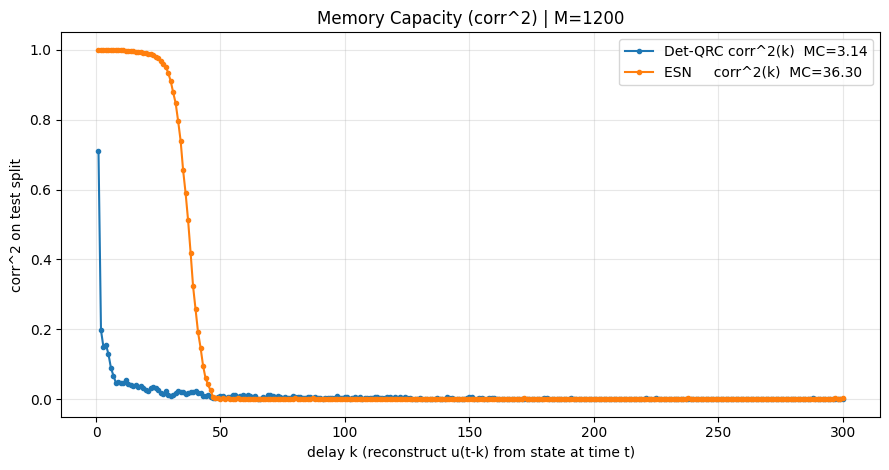

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.1,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 5.5105   (MC_R2_sum=3.0843)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


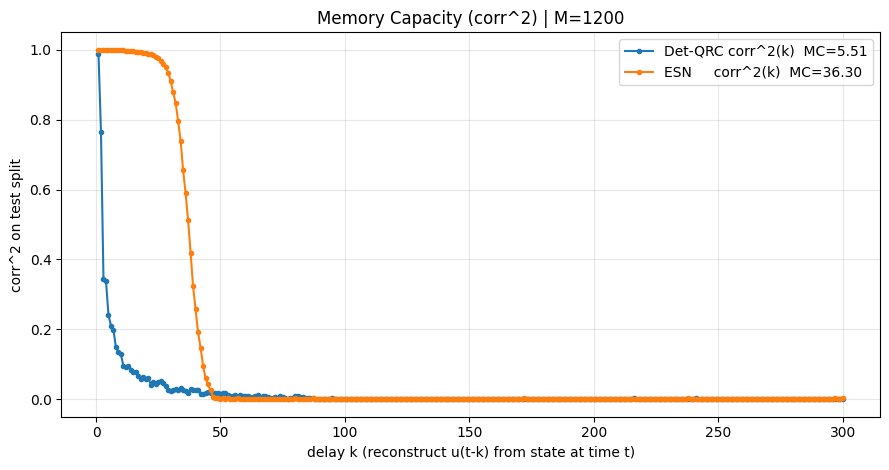

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.3,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 7.2145   (MC_R2_sum=5.0227)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


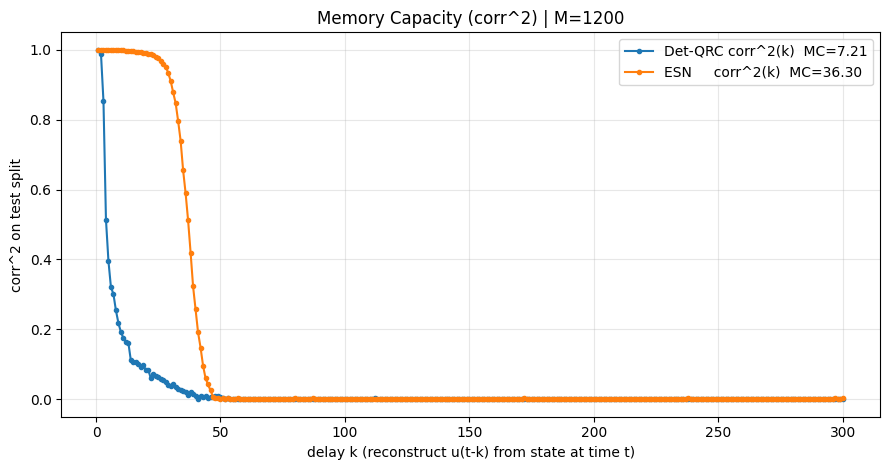

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.5,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 11.3116   (MC_R2_sum=10.4218)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


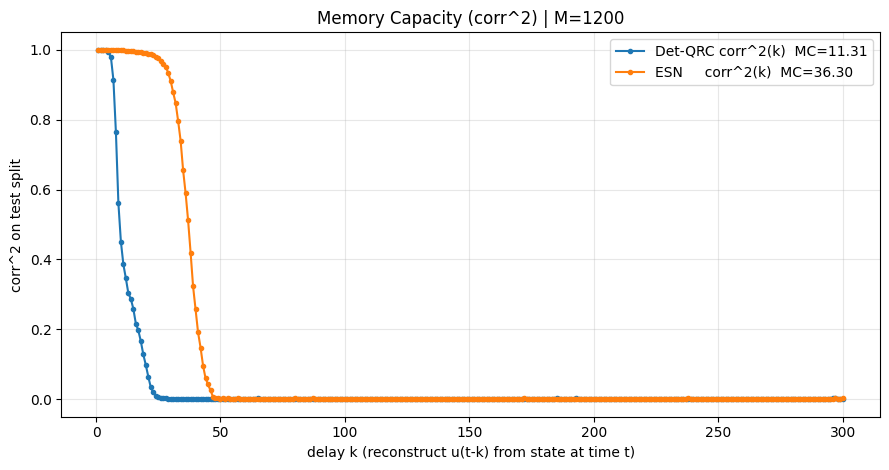

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.9,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 12.8167   (MC_R2_sum=12.1676)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


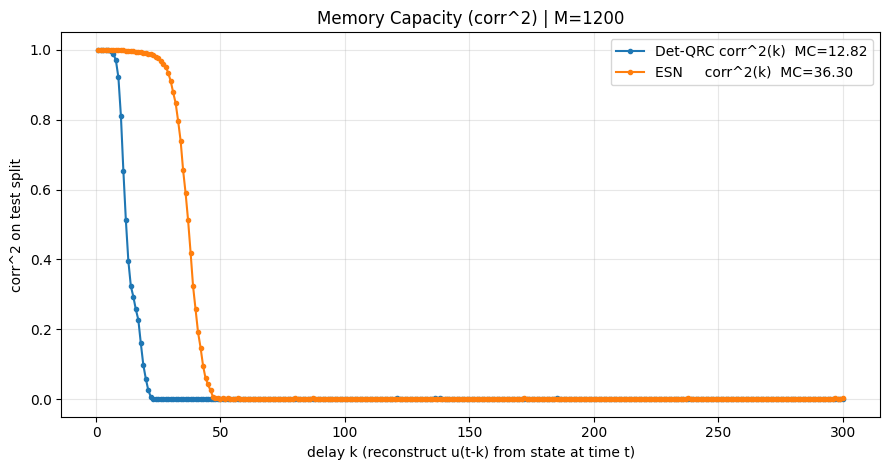

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=0.999,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_radius=0.9,
    leak_rate_esn=1.0,
)

[Det-QRC] M=1200  MC_corr2_sum(<= 300) = 12.8338   (MC_R2_sum=12.1873)
[ESN]      M=1200  MC_corr2_sum(<= 300) = 36.3001   (MC_R2_sum=35.5327)


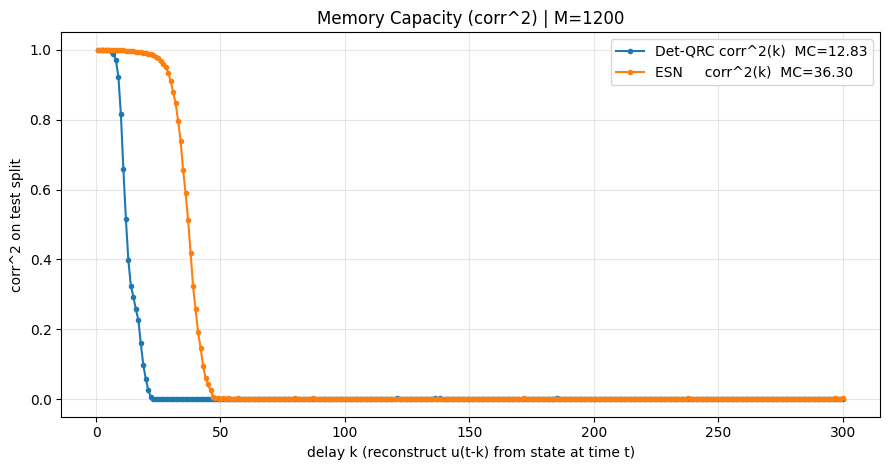

In [ ]:
res = run_mc_deterministic_qrc_vs_esn(
    N=100,
    T_total=8000,
    input_seed=0,
    input_dist="uniform",
    u_low=-0.5,
    u_high=0.5,
    k_max=300,
    washout=800,
    ridge_readout=1e-6,
    # QRC
    alpha=1.0,
    beta=0.7,
    squeeze_r=0.3,
    state_leak=1.0,      # ← 0.1, 0.3, 0.5 を試すのが定番
    sign_mode="plus",    # ← "alt" も試す価値あり
    # ESN
    spectral_rad
    ius=0.9,
    leak_rate_esn=1.0,
)

ESNの記憶を消して、ランダム非線形特徴だけでNARMAを解けるかどうかを試行

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict, List

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-2) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # bias not regularized
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def mse_corr(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, float]:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    mse = float(np.mean((y_true - y_pred) ** 2))
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        corr = np.nan
    else:
        corr = float(np.corrcoef(y_true, y_pred)[0, 1])
    return mse, corr

def plot_true_vs_pred(y_true, y_pred, *, title="", start=0, length=300):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    plt.figure(figsize=(12, 4))
    plt.plot(np.arange(start, end), y_true[start:end], label="True", lw=2)
    plt.plot(np.arange(start, end), y_pred[start:end], label="Pred", lw=1.5, alpha=0.85)
    plt.title(title)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    plt.tight_layout()
    plt.show()


# =========================================================
# 1) NARMA 生成（安定化：高orderでも発散しにくい）
#   ★重要：b_divide_by_order を切り替え可能
# =========================================================
def narma_series(
    order: int,
    length: int,
    *,
    seed: int = 0,
    burn_in: int = 1000,
    u_low: float = 0.0,
    u_high: float = 0.2,
    a: float = 0.3,
    b: float = 0.05,
    c: float = 1.5,
    d: float = 0.1,
    b_divide_by_order: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    y(t+1) = a y(t) + b y(t) sum_{i=0..order-1} y(t-i) + c u(t-order+1)u(t) + d
    Returns: (y, u) each shape (length,)
    """
    if order < 1:
        raise ValueError("order must be >= 1")

    rng = np.random.default_rng(seed)
    total = length + burn_in
    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    b_eff = b / float(order) if b_divide_by_order else b
    delay = order - 1

    for t in range(total - 1):
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]
        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0
        y[t + 1] = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

    return y[burn_in:], u[burn_in:]


def make_scalar_dataset_next(u_series: np.ndarray, y_series: np.ndarray, start_t: int, T: int):
    """
    入力:  U[k] = u(t),   t = start_t + k
    教師:  Y[k] = y(t+1)
    """
    u = np.asarray(u_series, float).reshape(-1)
    y = np.asarray(y_series, float).reshape(-1)
    if start_t + T + 1 > len(y):
        raise ValueError("need y(t+1) range")
    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y


# =========================================================
# 2) あなたの QRC（スカラー入力 out_prob）※安全版
# =========================================================
def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",       # "pm" or "plus"
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,  # (M,)
    Win_scale: float = 1.0,
    carry_state: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    x_state = np.zeros(M, dtype=float)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode != "replace":
            raise ValueError('input_mode must be "scale" or "replace".')

        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    return S, x_state


# =========================================================
# 3) ESN（再帰あり）スカラー入力
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,
    *,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(spectral_radius) / sr)
    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)
    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S, {"Wres": Wres, "Win": Win, "b": b}


# =========================================================
# 4) RF-ESN（再帰なし）＝ Random Features / ELM
#    S(t) = phi( Win*u(t) + b )  だけ（xもWresも無し）
# =========================================================
def simulate_random_features_scalar(
    M: int,
    U: np.ndarray,
    *,
    seed: int = 43,
    input_scale: float = 0.5,
    bias_scale: float = 0.1,
    nonlinearity: str = "tanh",   # "tanh" or "relu"
) -> Dict[str, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    pre = U[:, None] * Win[None, :] + b[None, :]
    if nonlinearity == "tanh":
        S = np.tanh(pre)
    elif nonlinearity == "relu":
        S = np.maximum(pre, 0.0)
    else:
        raise ValueError('nonlinearity must be "tanh" or "relu".')

    return {"S": S, "Win": Win, "b": b}


# =========================================================
# 5) 3本を同条件で比較（orderを変えてもOK）
# =========================================================
def compare_three_models_on_narma(
    order: int,
    *,
    N: int = 100,              # QRC: M=12N
    T_series: int = 6000,
    burn_in: int = 1000,
    data_seed: int = 0,
    u_high: float = 0.2,
    start_t: int = 1000,
    T_train: int = 1000,
    b_divide_by_order: bool = True,   # まずはあなたの現状と同じにして比較、その後Falseも試す
    ridge: float = 1e-2,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode: str = "plus",
    input_mode: str = "scale",
    carry_state: bool = True,
    qrc_seed: int = 43,
    qrc_win_scale: float = 1.0,
    # ESN params
    esn_seed: int = 43,
    spectral_radius: float = 0.9,
    leak_rate: float = 1.0,
    input_scale_esn: float = 0.5,
    bias_scale_esn: float = 0.1,
    # RF params
    rf_seed: int = 43,
    input_scale_rf: float = 0.5,
    bias_scale_rf: float = 0.1,
    rf_nonlinearity: str = "tanh",
):
    # --- data
    y_series, u_series = narma_series(
        order, T_series,
        seed=data_seed, burn_in=burn_in,
        u_high=u_high,
        b_divide_by_order=b_divide_by_order,
    )
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    M = 12 * N

    # --- QRC
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
        U=U,
        seed=qrc_seed,
        norm_const=norm_const,
        sign_mode=sign_mode,
        input_mode=input_mode,
        Win=None, Win_scale=qrc_win_scale,
        carry_state=carry_state,
    )
    wq, bq = fit_readout_ridge(S_qrc, Y, ridge=ridge)
    Yhat_q = predict_readout(S_qrc, wq, bq)
    mse_q, corr_q = mse_corr(Y, Yhat_q)

    # --- ESN (recurrent)
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=U,
        seed=esn_seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate,
        bias_scale=bias_scale_esn,
    )
    we, be = fit_readout_ridge(S_esn, Y, ridge=ridge)
    Yhat_e = predict_readout(S_esn, we, be)
    mse_e, corr_e = mse_corr(Y, Yhat_e)

    # --- Random Features (no recurrence)
    rf = simulate_random_features_scalar(
        M=M, U=U,
        seed=rf_seed,
        input_scale=input_scale_rf,
        bias_scale=bias_scale_rf,
        nonlinearity=rf_nonlinearity,
    )
    S_rf = rf["S"]
    wr, br = fit_readout_ridge(S_rf, Y, ridge=ridge)
    Yhat_r = predict_readout(S_rf, wr, br)
    mse_r, corr_r = mse_corr(Y, Yhat_r)

    print(f"=== NARMA-{order} | M={M} | b_divide_by_order={b_divide_by_order} ===")
    print(f"[QRC]     MSE={mse_q:.6g}  Corr={corr_q:.6g}")
    print(f"[ESN]     MSE={mse_e:.6g}  Corr={corr_e:.6g}")
    print(f"[RF-ESN]  MSE={mse_r:.6g}  Corr={corr_r:.6g}")

    plot_true_vs_pred(Y, Yhat_q, title=f"QRC (teacher-forced 1-step) | NARMA-{order}")
    plot_true_vs_pred(Y, Yhat_e, title=f"ESN recurrent (teacher-forced 1-step) | NARMA-{order}")
    plot_true_vs_pred(Y, Yhat_r, title=f"Random Features (no recurrence) | NARMA-{order}")

    return {
        "Y": Y,
        "Yhat_qrc": Yhat_q,
        "Yhat_esn": Yhat_e,
        "Yhat_rf": Yhat_r,
        "metrics": {
            "qrc": (mse_q, corr_q),
            "esn": (mse_e, corr_e),
            "rf":  (mse_r, corr_r),
        }
    }

=== NARMA-30 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=1.02016e-06  Corr=0.997628
[ESN]     MSE=2.78427e-05  Corr=0.924872
[RF-ESN]  MSE=0.000115131  Corr=0.621985


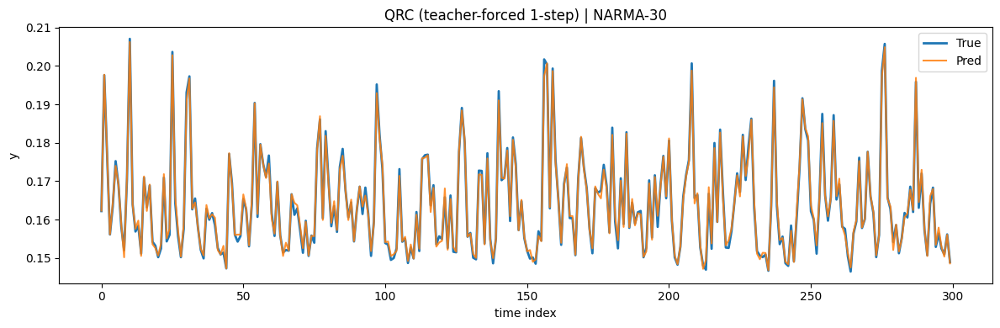

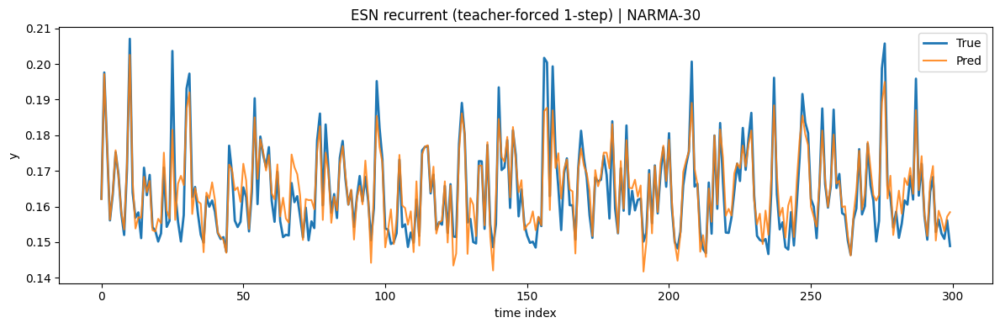

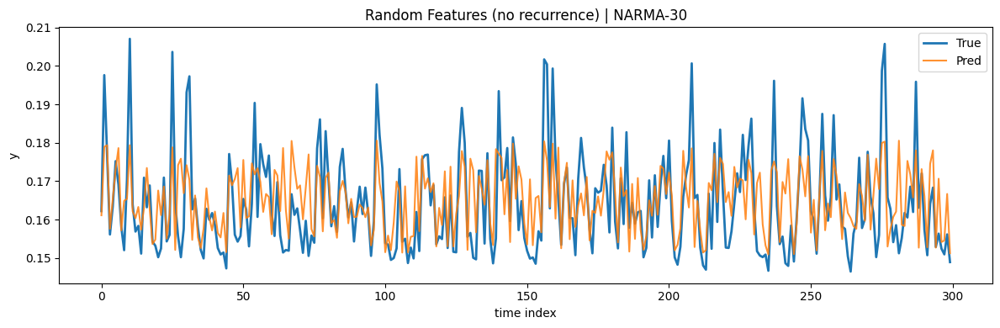

=== NARMA-200 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=1.06243e-06  Corr=0.997531
[ESN]     MSE=9.29475e-05  Corr=0.712966
[RF-ESN]  MSE=0.000110288  Corr=0.645276


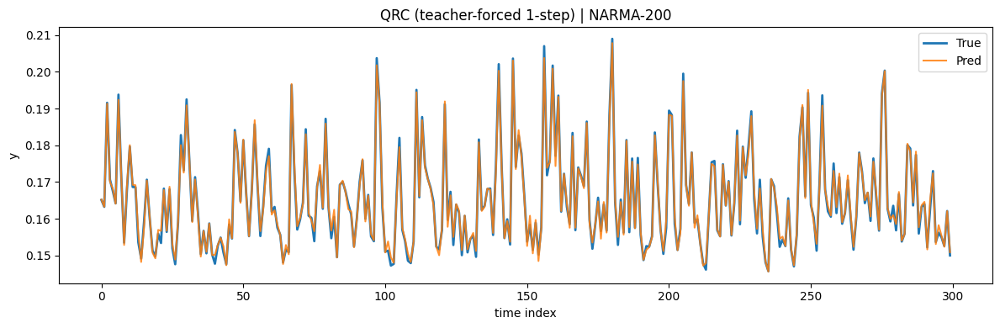

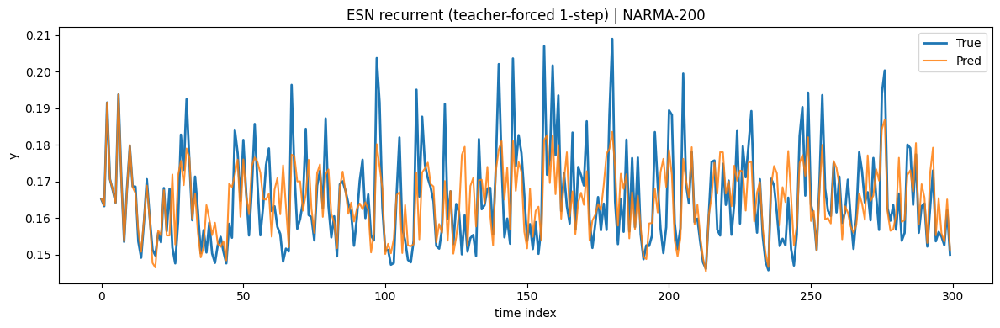

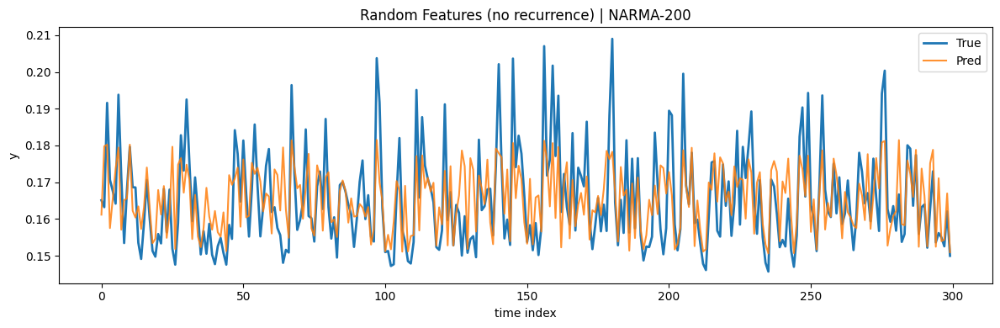

=== NARMA-500 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=9.5332e-07  Corr=0.997516
[ESN]     MSE=9.46136e-05  Corr=0.672111
[RF-ESN]  MSE=0.000107334  Corr=0.614726


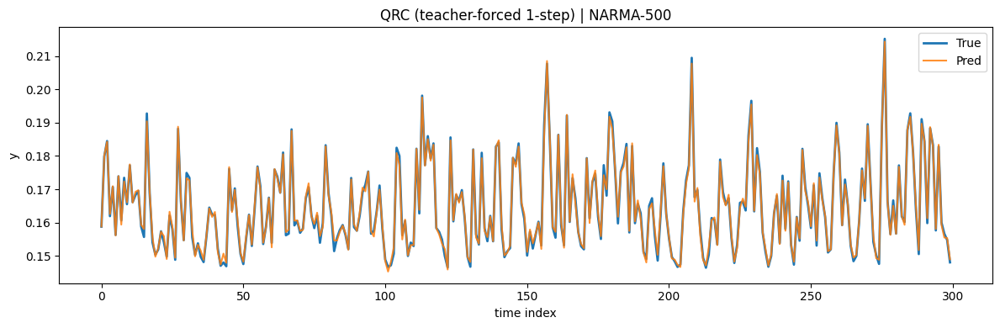

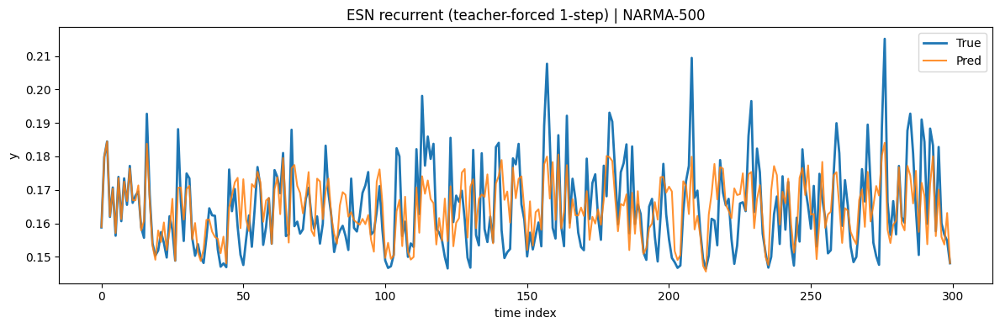

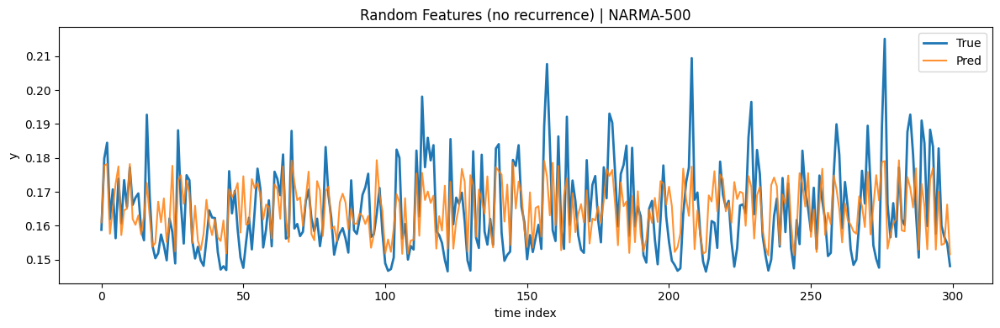

In [ ]:
# =========================================================
# 6) 実行例：まず order=30/200/500 を回す
#    ①まずはあなたの現状に合わせて b_divide_by_order=True
#    ②次に b_divide_by_order=False にして難化（u_highを下げるの推奨）
# =========================================================
for order in [30, 200, 500]:
    _ = compare_three_models_on_narma(
        order,
        N=100,
        T_series=6000,
        burn_in=1000,
        data_seed=123,
        u_high=0.2,
        start_t=1000,
        T_train=1000,
        b_divide_by_order=True,  # ←まずはTrue（現状追認）
        ridge=1e-2,
        # QRC
        alpha=1.0, beta=0.7, squeeze_r=0.3,
        sign_mode="plus", carry_state=True,
        # ESN
        spectral_radius=0.9, leak_rate=1.0,
        # RF
        rf_nonlinearity="tanh",
    )

=== NARMA-30 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=1.02016e-06  Corr=0.997628
[ESN]     MSE=2.78427e-05  Corr=0.924872
[RF-ESN]  MSE=0.000115131  Corr=0.621985


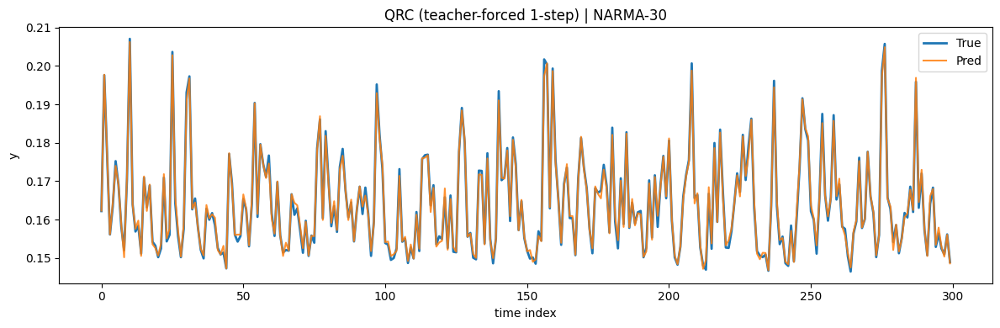

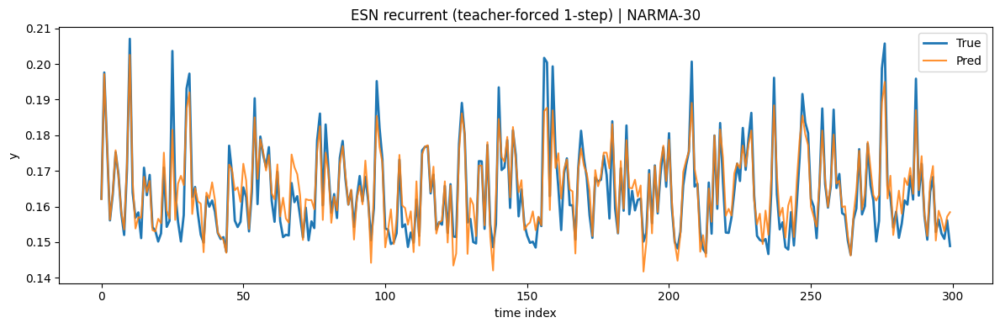

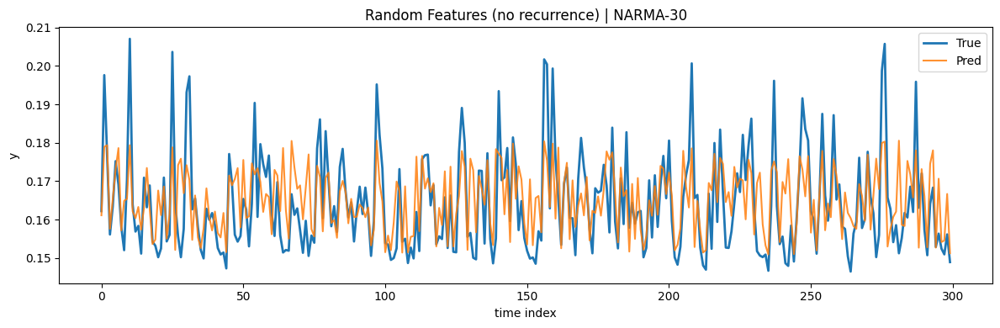

=== NARMA-200 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=1.06243e-06  Corr=0.997531
[ESN]     MSE=9.29475e-05  Corr=0.712966
[RF-ESN]  MSE=0.000110288  Corr=0.645276


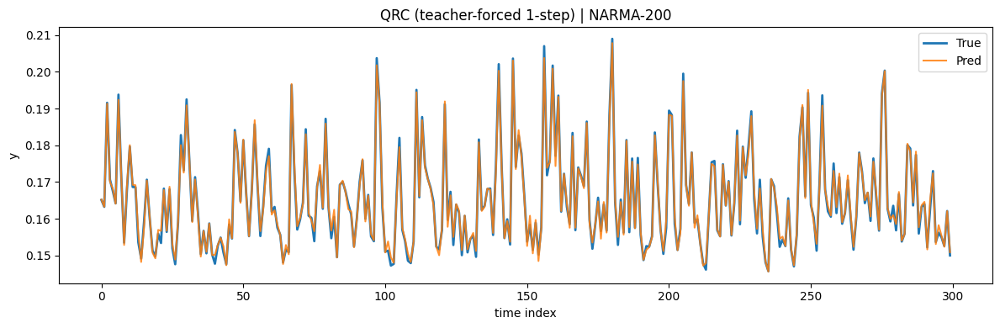

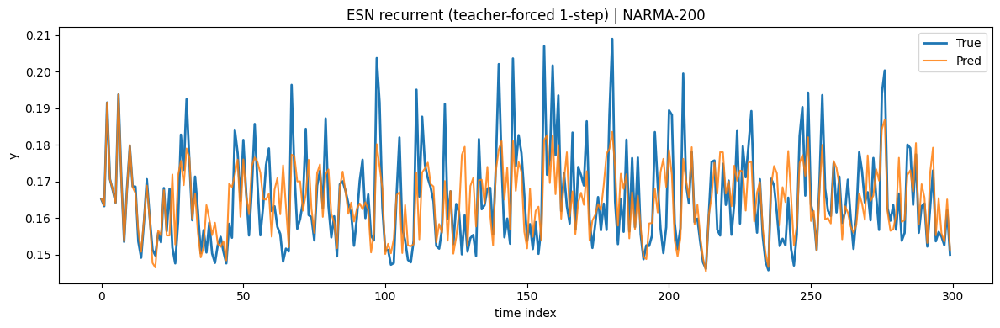

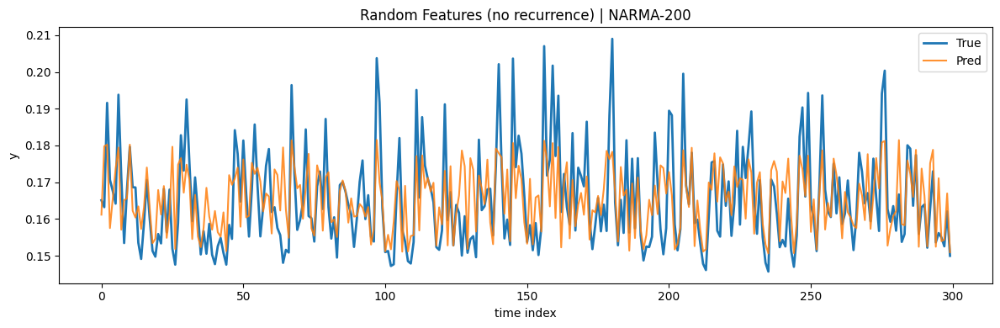

=== NARMA-500 | M=1200 | b_divide_by_order=True ===
[QRC]     MSE=9.5332e-07  Corr=0.997516
[ESN]     MSE=9.46136e-05  Corr=0.672111
[RF-ESN]  MSE=0.000107334  Corr=0.614726


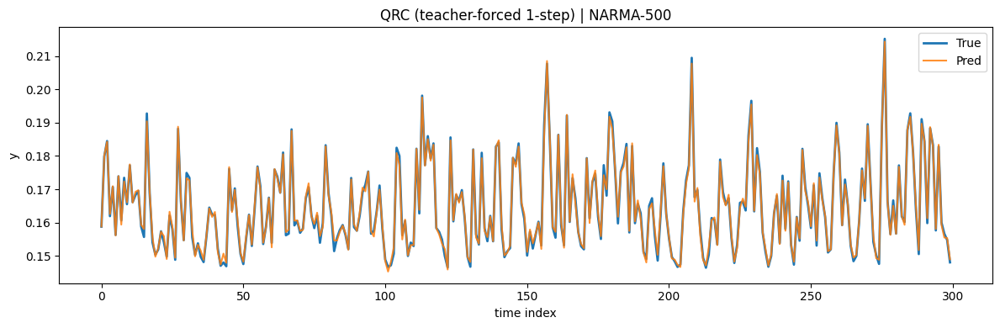

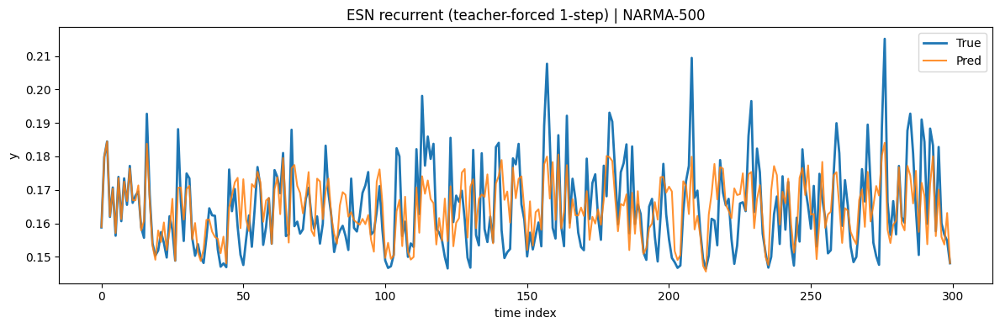

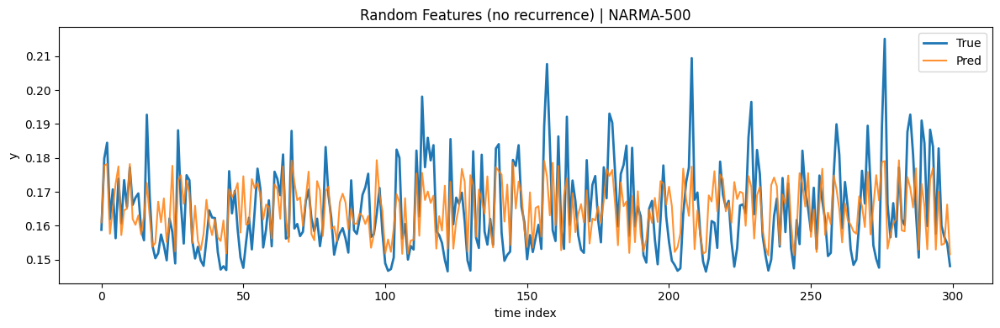

In [ ]:
# =========================================================
# 6) 実行例：まず order=30/200/500 を回す
#    ①まずはあなたの現状に合わせて b_divide_by_order=True
#    ②次に b_divide_by_order=False にして難化（u_highを下げるの推奨）
# =========================================================
for order in [30, 200, 500]:
    _ = compare_three_models_on_narma(
        order,
        N=100,
        T_series=6000,
        burn_in=1000,
        data_seed=123,
        u_high=0.2,
        start_t=1000,
        T_train=1000,
        b_divide_by_order=True,  # ←まずはTrue（現状追認）
        ridge=1e-2,
        # QRC
        alpha=1.0, beta=0.7, squeeze_r=0.3,
        sign_mode="plus", carry_state=True,
        # ESN
        spectral_radius=0.9, leak_rate=1.0,
        # RF
        rf_nonlinearity="tanh",
    )

=== NARMA-10 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=9.54086e-12  Corr=0.996904
[ESN]     MSE=2.02912e-10  Corr=0.921701
[RF-ESN]  MSE=8.51008e-10  Corr=0.586852


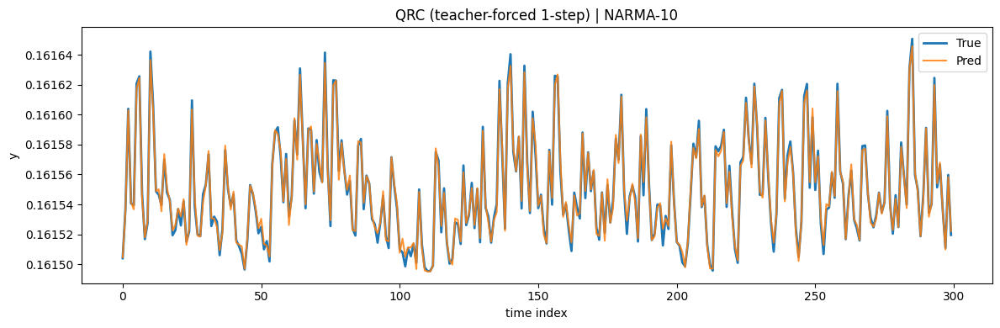

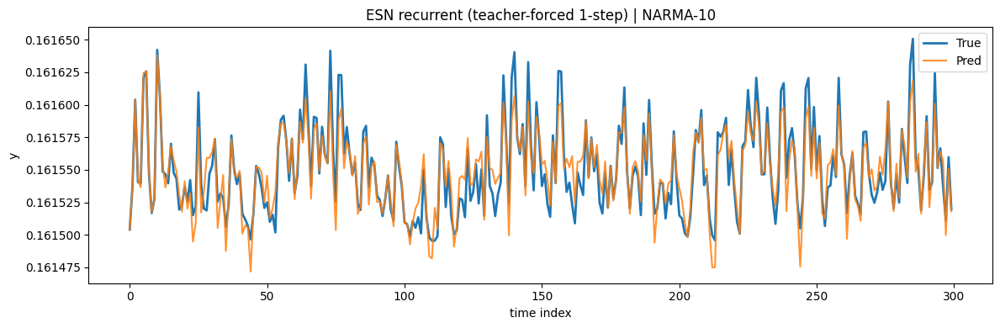

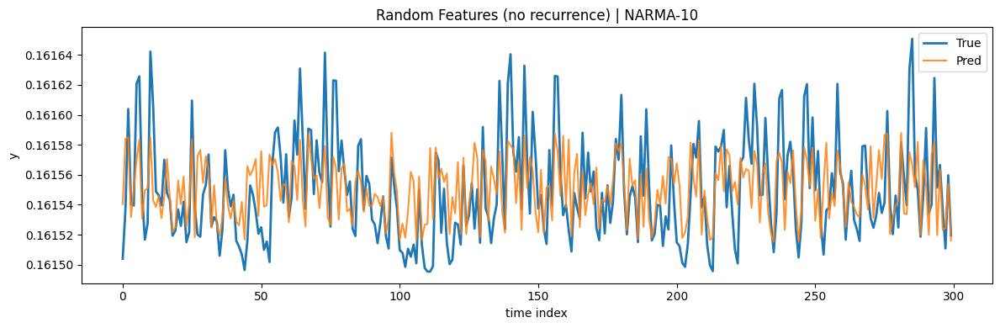

=== NARMA-20 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=1.0309e-11  Corr=0.997055
[ESN]     MSE=6.45225e-10  Corr=0.76478
[RF-ESN]  MSE=1.06491e-09  Corr=0.5441


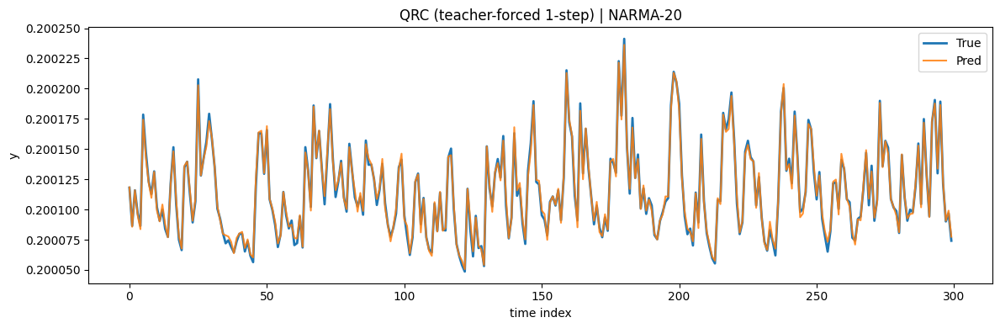

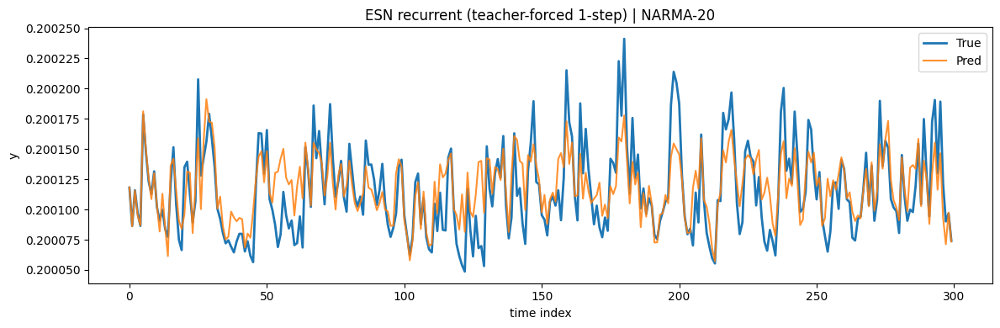

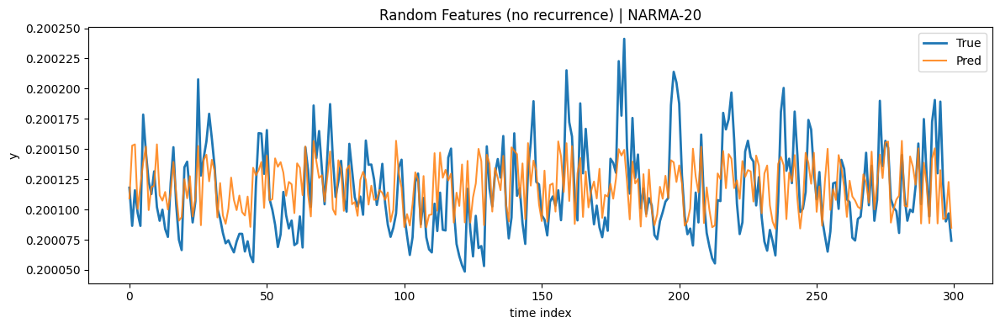

In [ ]:
for order in [10, 20]:
    _ = compare_three_models_on_narma(
        order,
        N=100,
        T_series=6000,
        burn_in=1000,
        data_seed=123,
        u_high=0.01,
        start_t=1000,
        T_train=1000,
        b_divide_by_order=False,  # ←まずはTrue（現状追認）
        ridge=1e-2,
        # QRC
        alpha=1.0, beta=0.7, squeeze_r=0.3,
        sign_mode="plus", carry_state=True,
        # ESN
        spectral_radius=0.9, leak_rate=1.0,
        # RF
        rf_nonlinearity="tanh",
    )

記憶は弱いものの、NARMAの本質である「非線形な積と和」が正しく生成されていることで、非線形特徴生成能力が異様に強いリザバーになっている


この QRC では、次が同時に起きている

➀ 確率注入

状態が毎ステップ ランダムに再構成

低次元の入力から 非常に多様なスパースパターンが生成される

② 干渉ネットワーク

各ステップで 深い線形合成

実質的に「多層ランダム線形変換」

③ out_prob 非線形

|x|^2, x^2, tanh, exp が混在

→二次〜高次の項が大量に含まれる

④ x_state = 1 − out_prob


以上は

MC 的には「不安定・非線形すぎて記憶とみなせない」

NARMA 的には「積・和の構造と相性が良すぎる」

→
結果として、

「過去を覚えていないのに、
NARMAの更新式と強く相関した特徴が毎時刻“即席で”作られる」

という、かなり特殊な状況になっている

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict, List

# =========================================================
# Ridge readout
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-2) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    X = np.hstack([S, np.ones((T, 1))])
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))  # bias not regularized
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def mse_corr(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, float]:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    mse = float(np.mean((y_true - y_pred) ** 2))
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        corr = np.nan
    else:
        corr = float(np.corrcoef(y_true, y_pred)[0, 1])
    return mse, corr

def plot_true_vs_pred(y_true, y_pred, *, title="", start=0, length=300):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    t = np.arange(start, end)
    plt.figure(figsize=(12, 4))
    plt.plot(t, y_true[start:end], label="True", lw=2)
    plt.plot(t, y_pred[start:end], label="Pred", lw=1.5, alpha=0.85)
    plt.title(title)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    plt.tight_layout()
    plt.show()

# =========================================================
# NARMA generator (b_divide_by_order configurable)
# =========================================================
def narma_series(
    order: int,
    length: int,
    *,
    seed: int = 0,
    burn_in: int = 1000,
    u_low: float = 0.0,
    u_high: float = 0.2,
    a: float = 0.3,
    b: float = 0.05,
    c: float = 1.5,
    d: float = 0.1,
    b_divide_by_order: bool = False,
) -> Tuple[np.ndarray, np.ndarray]:
    if order < 1:
        raise ValueError("order must be >= 1")
    rng = np.random.default_rng(seed)
    total = length + burn_in
    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    b_eff = b / float(order) if b_divide_by_order else b
    delay = order - 1

    for t in range(total - 1):
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]
        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0
        y[t + 1] = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

    return y[burn_in:], u[burn_in:]

def make_scalar_dataset_next(u_series: np.ndarray, y_series: np.ndarray, start_t: int, T: int):
    u = np.asarray(u_series, float).reshape(-1)
    y = np.asarray(y_series, float).reshape(-1)
    if start_t + T + 1 > len(y):
        raise ValueError("need y(t+1) range")
    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y

# =========================================================
# QRC states with ABLATIONS
#   inject_mode: "stochastic"(orig), "off", "always", "continuous", "threshold"
#   nonlin_mode: "original"(orig), "energy", "linear"
# =========================================================
def simulate_qrc_states_outprob_scalar_ablation(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,
    Win_scale: float = 1.0,
    carry_state: bool = True,
    x0: Optional[np.ndarray] = None,
    sign_mode: str = "plus",            # "plus" or "pm" (pm uses randomness if stochastic)
    inject_mode: str = "stochastic",
    nonlin_mode: str = "original",
    linear_gain: float = 1.0,
    linear_bias: float = 0.5,
    state_leak: float = 1.0,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns:
      S: (T,M) state (=out_feature)
      xT: (M,)
      debug: (T,) mean(state) ざっくりの安定性確認用
    """
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    leak = float(state_leak)
    if not (0.0 < leak <= 1.0):
        raise ValueError("state_leak must be in (0,1]")

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    # signs
    if sign_mode == "plus":
        signs_base = np.ones(M, dtype=float)
    elif sign_mode == "pm":
        # pm の場合：stochastic 以外でも決定論にしたいなら交互符号にする
        signs_base = np.where((np.arange(M) % 2) == 0, 1.0, -1.0)
    else:
        raise ValueError('sign_mode must be "plus" or "pm".')

    S = np.empty((T, M), dtype=float)
    debug_mean = np.empty(T, dtype=float)

    for t in range(T):
        # scalar->M input
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode != "replace":
            raise ValueError('input_mode must be "scale" or "replace".')

        # --- injection block (ABLATION)
        p = np.clip(x_state, 0.0, 1.0)

        if inject_mode == "off":
            s = np.zeros(M, dtype=float)

        elif inject_mode == "always":
            s = signs_base * float(alpha)

        elif inject_mode == "continuous":
            excitation = 1.0 - p  # 0..1
            s = signs_base * float(alpha) * excitation

        elif inject_mode == "threshold":
            # deterministic ON/OFF: p<0.5 => excite
            inject_mask = (p < 0.5)
            s = np.where(inject_mask, signs_base * float(alpha), 0.0)

        elif inject_mode == "stochastic":
            # original stochastic inject_mask
            r_uni = rng.random(M)
            inject_mask = (r_uni >= p)

            if sign_mode == "pm":
                # stochastic ±
                signs = rng.integers(0, 2, size=M) * 2 - 1
            else:
                signs = signs_base

            s = np.where(inject_mask, signs * float(alpha), 0.0)

        elif inject_mode == "state_only":
            # 乱数なし。状態pを必ずダイナミクスに注入する（実質のメモリを保証）
            excitation = 1.0 - p                      # 0..1
            s = signs_base * float(alpha) * excitation

        elif inject_mode == "state_plus_input":
            # 状態 + 入力で必ず揺さぶる（乱数なし）
            excitation = 1.0 - p
            gamma = 1.0  # ←必要なら引数にして調整
            s = signs_base * float(alpha) * excitation + gamma * u_vec


            # The following lines are problematic and likely a copy-paste error
            # as inject_mask is not defined for this mode and randomness is not intended.
            # if sign_mode == "pm":
            #     # stochastic ±
            #     signs = rng.integers(0, 2, size=M) * 2 - 1
            # else:
            #     signs = signs_base

            # s = np.where(inject_mask, signs * float(alpha), 0.0)

        else:
            raise ValueError('inject_mode must be one of: "stochastic","off","always","continuous","threshold","state_only","state_plus_input".')

        # --- network (same as yours)
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # --- output nonlinearity (ABLATION)
        if nonlin_mode == "original":
            coef = 1.0 / np.cosh(squeeze_r)
            tanh_r = np.tanh(squeeze_r)
            log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

            re = np.real(log_p0)
            im = np.imag(log_p0)
            re = np.clip(re, -700.0, 50.0)
            p0_like = np.exp(re + 1j * im)

            out = 1.0 - (p0_like / float(norm_const))
            out = np.clip(np.real(out).astype(float), 0.0, 1.0)

        elif nonlin_mode == "energy":
            # "linearize" in the sense of removing fin^2 and phase; keep exp(-|fin|^2) only
            # p0 ≈ exp(-|fin|^2) (scaled); out = 1 - p0
            e = np.clip((np.abs(fin) ** 2), 0.0, 700.0)
            p0 = np.exp(-e)
            out = 1.0 - (p0 / float(norm_const))
            out = np.clip(np.real(out).astype(float), 0.0, 1.0)

        elif nonlin_mode == "linear":
            # purely linear feature from fin (then clip into [0,1])
            # out = clip(gain*Re(fin) + bias)
            out = linear_gain * np.real(fin) + float(linear_bias)
            out = np.clip(out.astype(float), 0.0, 1.0)

        else:
            raise ValueError('nonlin_mode must be one of: "original","energy","linear".')

        S[t] = out
        debug_mean[t] = float(np.mean(out))

        # --- state update
        if carry_state:
            x_target = np.clip(1.0 - out, 0.0, 1.0)
            # leak=1 => original overwrite, leak<1 => leaky integration
            x_state = (1.0 - leak) * x_state + leak * x_target

    return S, x_state, debug_mean


# =========================================================
# Run ablation suite on NARMA
# =========================================================
def run_qrc_ablation_suite(
    order: int,
    *,
    N: int = 100,
    M: Optional[int] = None,
    T_series: int = 6000,
    burn_in: int = 1000,
    data_seed: int = 123,
    u_high: float = 0.2,
    b_divide_by_order: bool = False,
    start_t: int = 1000,
    T_train: int = 1000,
    ridge: float = 1e-2,
    # QRC base params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    carry_state: bool = True,
    qrc_seed: int = 43,
    Win_scale: float = 1.0,
    sign_mode: str = "plus",
    state_leak: float = 1.0,
    # ablation grid
    inject_modes: List[str] = None,
    nonlin_modes: List[str] = None,
    plot_one: bool = False,
):
    y_series, u_series = narma_series(
        order=order, length=T_series,
        seed=data_seed, burn_in=burn_in,
        u_high=u_high, b_divide_by_order=b_divide_by_order
    )
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    if inject_modes is None:
        inject_modes = ["stochastic", "state_only", "state_plus_input", "continuous", "threshold", "always", "off"]
    if nonlin_modes is None:
        nonlin_modes = ["original", "energy", "linear"]

    results = []

    # Fix Win for fairness across ablations
    M_dim = 12 * N
    rng = np.random.default_rng(qrc_seed)
    Win_fixed = rng.uniform(-1.0, 1.0, size=(M_dim,)) * float(Win_scale)

    for inj in inject_modes:
        for nl in nonlin_modes:
            S, _, dbg = simulate_qrc_states_outprob_scalar_ablation(
                N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
                U=U,
                seed=qrc_seed, norm_const=norm_const,
                input_mode=input_mode,
                Win=Win_fixed, Win_scale=1.0,
                carry_state=carry_state,
                sign_mode=sign_mode,
                inject_mode=inj,
                nonlin_mode=nl,
                linear_gain=1.0,
                linear_bias=0.5,
                state_leak=state_leak,
            )
            w, b = fit_readout_ridge(S, Y, ridge=ridge)
            Yhat = predict_readout(S, w, b)
            mse, corr = mse_corr(Y, Yhat)

            results.append({
                "inject": inj,
                "nonlin": nl,
                "mse": mse,
                "corr": corr,
                "mean_state": float(np.mean(dbg)),
                "std_state": float(np.std(dbg)),
            })

            if plot_one and inj == "stochastic" and nl == "original":
                plot_true_vs_pred(Y, Yhat, title=f"QRC baseline | NARMA-{order}")

    # sort by corr desc
    results_sorted = sorted(results, key=lambda d: (-np.nan_to_num(d["corr"], nan=-1e9), d["mse"]))

    print(f"\n=== QRC Ablation Suite | NARMA-{order} | M={12*N} | b_divide_by_order={b_divide_by_order} ===")
    for r in results_sorted:
        print(f"[inj={r['inject']:<10} nl={r['nonlin']:<8}]  Corr={r['corr']:.6f}  MSE={r['mse']:.6g}  "
              f"state_mean={r['mean_state']:.3f}  state_std={r['std_state']:.3f}")

    return results_sorted


In [ ]:
# =========================================================
# NARMA-10（b_divide_by_order=False）
# =========================================================
res10 = run_qrc_ablation_suite(
    order=10,
    N=100,
    b_divide_by_order=False,
    u_high=0.2,         # 発散しない範囲で
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    sign_mode="plus",
    state_leak=1.0,     # 元の挙動に近い
)


=== QRC Ablation Suite | NARMA-10 | M=1200 | b_divide_by_order=False ===
[inj=stochastic nl=linear  ]  Corr=0.999984  MSE=7.09606e-09  state_mean=0.523  state_std=0.007
[inj=stochastic nl=original]  Corr=0.997452  MSE=1.2103e-06  state_mean=0.065  state_std=0.007
[inj=state_plus_input nl=linear  ]  Corr=0.902538  MSE=3.99634e-05  state_mean=0.525  state_std=0.004
[inj=state_only nl=linear  ]  Corr=0.882666  MSE=4.78306e-05  state_mean=0.527  state_std=0.003
[inj=continuous nl=linear  ]  Corr=0.882666  MSE=4.78306e-05  state_mean=0.527  state_std=0.003
[inj=stochastic nl=energy  ]  Corr=0.865416  MSE=5.45154e-05  state_mean=0.003  state_std=0.011
[inj=state_plus_input nl=original]  Corr=0.618786  MSE=0.000131773  state_mean=0.046  state_std=0.008
[inj=state_only nl=original]  Corr=0.602512  MSE=0.000136088  state_mean=0.045  state_std=0.007
[inj=continuous nl=original]  Corr=0.602512  MSE=0.000136088  state_mean=0.045  state_std=0.007
[inj=state_plus_input nl=energy  ]  Corr=0.596421  

In [ ]:
# =========================================================
# NARMA-20（b_divide_by_order=False）
# =========================================================
res20 = run_qrc_ablation_suite(
    order=20,
    N=100,
    b_divide_by_order=False,
    u_high=0.2,         # 発散しない範囲で
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    sign_mode="plus",
    state_leak=1.0,     # 元の挙動に近い
)


=== QRC Ablation Suite | NARMA-20 | M=1200 | b_divide_by_order=False ===
[inj=stochastic nl=linear  ]  Corr=0.999983  MSE=1.09668e-08  state_mean=0.523  state_std=0.007
[inj=stochastic nl=original]  Corr=0.995811  MSE=2.75528e-06  state_mean=0.065  state_std=0.007
[inj=stochastic nl=energy  ]  Corr=0.857082  MSE=7.9761e-05  state_mean=0.003  state_std=0.011
[inj=state_plus_input nl=linear  ]  Corr=0.680400  MSE=0.00015967  state_mean=0.525  state_std=0.004
[inj=state_only nl=linear  ]  Corr=0.630118  MSE=0.000178295  state_mean=0.527  state_std=0.003
[inj=continuous nl=linear  ]  Corr=0.630118  MSE=0.000178295  state_mean=0.527  state_std=0.003
[inj=state_plus_input nl=original]  Corr=0.548237  MSE=0.00020672  state_mean=0.046  state_std=0.008
[inj=state_plus_input nl=energy  ]  Corr=0.534618  MSE=0.000210974  state_mean=0.003  state_std=0.010
[inj=state_only nl=original]  Corr=0.517491  MSE=0.000216507  state_mean=0.045  state_std=0.007
[inj=continuous nl=original]  Corr=0.517491  MS

In [ ]:
# =========================================================
# まずはあなたが強かった設定で：NARMA-10 / 20（b_divide_by_order=False）
# =========================================================
res100 = run_qrc_ablation_suite(
    order=100,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,         # 発散しない範囲で
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    sign_mode="plus",
    state_leak=1.0,     # 元の挙動に近い
)


=== QRC Ablation Suite | NARMA-100 | M=1200 | b_divide_by_order=True ===
[inj=stochastic nl=linear  ]  Corr=0.999988  MSE=4.93491e-09  state_mean=0.523  state_std=0.007
[inj=stochastic nl=original]  Corr=0.997718  MSE=9.51686e-07  state_mean=0.065  state_std=0.007
[inj=stochastic nl=energy  ]  Corr=0.865421  MSE=4.69272e-05  state_mean=0.003  state_std=0.011
[inj=state_plus_input nl=linear  ]  Corr=0.711744  MSE=9.08647e-05  state_mean=0.525  state_std=0.004
[inj=state_only nl=linear  ]  Corr=0.675411  MSE=9.99285e-05  state_mean=0.527  state_std=0.003
[inj=continuous nl=linear  ]  Corr=0.675411  MSE=9.99285e-05  state_mean=0.527  state_std=0.003
[inj=state_plus_input nl=original]  Corr=0.636197  MSE=0.000109324  state_mean=0.046  state_std=0.008
[inj=state_only nl=original]  Corr=0.625167  MSE=0.000111916  state_mean=0.045  state_std=0.007
[inj=continuous nl=original]  Corr=0.625167  MSE=0.000111916  state_mean=0.045  state_std=0.007
[inj=state_plus_input nl=energy  ]  Corr=0.620298 

In [ ]:
import numpy as np
from typing import Tuple, Optional

def simulate_qrc_states_outprob_scalar_ablation(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,   # (M,)
    Win_scale: float = 1.0,
    carry_state: bool = True,
    x0: Optional[np.ndarray] = None,    # (M,)
    sign_mode: str = "plus",            # "plus" or "pm"
    inject_mode: str = "stochastic",
    nonlin_mode: str = "original",
    linear_gain: float = 1.0,
    linear_bias: float = 0.5,
    state_leak: float = 1.0,
    # --------- NEW: resampling control ---------
    resample_every: int = 1,            # K: update mask every K steps (K=1 => iid each step)
    resample_mode: str = "hold",        # currently only "hold"
    fixed_signs_in_hold: bool = True,   # for sign_mode="pm": hold signs within the K-window
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns:
      S: (T,M) state (=out_feature)
      xT: (M,)
      debug_mean: (T,) mean(state)
    """
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    if x0 is None:
        x_state = np.zeros(M, dtype=float)
    else:
        x_state = np.asarray(x0, float).reshape(-1).copy()
        if x_state.size != M:
            raise ValueError(f"x0 must be length {M}")
        x_state = np.clip(x_state, 0.0, 1.0)

    leak = float(state_leak)
    if not (0.0 < leak <= 1.0):
        raise ValueError("state_leak must be in (0,1]")

    if resample_every < 1:
        raise ValueError("resample_every must be >= 1")
    if resample_mode != "hold":
        raise ValueError('resample_mode currently supports only "hold".')

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    # base signs for "plus" or deterministic pm fallback
    if sign_mode == "plus":
        signs_base = np.ones(M, dtype=float)
    elif sign_mode == "pm":
        signs_base = np.where((np.arange(M) % 2) == 0, 1.0, -1.0)
    else:
        raise ValueError('sign_mode must be "plus" or "pm".')

    S = np.empty((T, M), dtype=float)
    debug_mean = np.empty(T, dtype=float)

    # ---------- NEW: held random buffers (updated every K steps) ----------
    held_r_uni = None
    held_signs = None

    for t in range(T):
        # scalar->M input
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode != "replace":
            raise ValueError('input_mode must be "scale" or "replace".')

        p = np.clip(x_state, 0.0, 1.0)

        # --- injection block
        if inject_mode == "off":
            s = np.zeros(M, dtype=float)

        elif inject_mode == "always":
            s = signs_base * float(alpha)

        elif inject_mode == "continuous":
            excitation = 1.0 - p
            s = signs_base * float(alpha) * excitation

        elif inject_mode == "threshold":
            inject_mask = (p < 0.5)
            s = np.where(inject_mask, signs_base * float(alpha), 0.0)

        elif inject_mode == "state_only":
            excitation = 1.0 - p
            s = signs_base * float(alpha) * excitation

        elif inject_mode == "state_plus_input":
            excitation = 1.0 - p
            gamma = 1.0
            s = signs_base * float(alpha) * excitation + gamma * u_vec

        elif inject_mode == "stochastic":
            # ---------- NEW: resample every K steps ----------
            if (t % resample_every) == 0 or held_r_uni is None:
                held_r_uni = rng.random(M)
                if sign_mode == "pm":
                    if fixed_signs_in_hold:
                        held_signs = rng.integers(0, 2, size=M) * 2 - 1
                    else:
                        held_signs = None  # will resample each step below
                else:
                    held_signs = signs_base

            r_uni = held_r_uni
            inject_mask = (r_uni >= p)

            if sign_mode == "pm":
                if fixed_signs_in_hold:
                    signs = held_signs
                else:
                    # resample signs every step, even if mask is held
                    signs = rng.integers(0, 2, size=M) * 2 - 1
            else:
                signs = signs_base

            s = np.where(inject_mask, signs * float(alpha), 0.0)

        else:
            raise ValueError('inject_mode must be one of: '
                             '"stochastic","off","always","continuous","threshold","state_only","state_plus_input".')

        # --- network
        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        # --- output nonlinearity
        if nonlin_mode == "original":
            coef = 1.0 / np.cosh(squeeze_r)
            tanh_r = np.tanh(squeeze_r)
            log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

            re = np.real(log_p0)
            im = np.imag(log_p0)
            re = np.clip(re, -700.0, 50.0)
            p0_like = np.exp(re + 1j * im)

            out = 1.0 - (p0_like / float(norm_const))
            out = np.clip(np.real(out).astype(float), 0.0, 1.0)

        elif nonlin_mode == "energy":
            e = np.clip((np.abs(fin) ** 2), 0.0, 700.0)
            p0 = np.exp(-e)
            out = 1.0 - (p0 / float(norm_const))
            out = np.clip(np.real(out).astype(float), 0.0, 1.0)

        elif nonlin_mode == "linear":
            out = linear_gain * np.real(fin) + float(linear_bias)
            out = np.clip(out.astype(float), 0.0, 1.0)

        else:
            raise ValueError('nonlin_mode must be one of: "original","energy","linear".')

        S[t] = out
        debug_mean[t] = float(np.mean(out))

        # --- state update
        if carry_state:
            x_target = np.clip(1.0 - out, 0.0, 1.0)
            x_state = (1.0 - leak) * x_state + leak * x_target

    return S, x_state, debug_mean

def sweep_resample_every_on_stochastic_linear(
    order: int,
    *,
    N: int = 100,
    T_series: int = 6000,
    burn_in: int = 1000,
    data_seed: int = 123,
    u_high: float = 0.2,
    b_divide_by_order: bool = False,
    start_t: int = 1000,
    T_train: int = 1000,
    ridge: float = 1e-2,
    # QRC base params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    qrc_seed: int = 43,
    Win_scale: float = 1.0,
    carry_state: bool = True,
    state_leak: float = 1.0,
    # sweep list
    K_list = (1, 2, 5, 10, 20, 50, 100),
):
    # --- data
    y_series, u_series = narma_series(
        order=order, length=T_series,
        seed=data_seed, burn_in=burn_in,
        u_high=u_high, b_divide_by_order=b_divide_by_order
    )
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    M = 12 * N
    rng = np.random.default_rng(qrc_seed)
    Win_fixed = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)

    rows = []
    for K in K_list:
        S, _, _ = simulate_qrc_states_outprob_scalar_ablation(
            N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
            U=U,
            seed=qrc_seed,
            norm_const=norm_const,
            input_mode="scale",
            Win=Win_fixed,
            carry_state=carry_state,
            sign_mode="plus",
            inject_mode="stochastic",
            nonlin_mode="linear",
            linear_gain=1.0, linear_bias=0.5,
            state_leak=state_leak,
            resample_every=int(K),          # ★ここだけ変える
            resample_mode="hold",
            fixed_signs_in_hold=True,
        )
        w, b = fit_readout_ridge(S, Y, ridge=ridge)
        Yhat = predict_readout(S, w, b)
        mse, corr = mse_corr(Y, Yhat)
        rows.append((K, mse, corr))

    print(f"\n=== Sweep resample_every K | NARMA-{order} | M={12*N} | stochastic+linear ===")
    for K, mse, corr in rows:
        print(f"K={K:<4}  Corr={corr:.6f}  MSE={mse:.6g}")

    # plot
    Ks = np.array([r[0] for r in rows], dtype=float)
    Corrs = np.array([r[2] for r in rows], dtype=float)
    plt.figure(figsize=(6,4))
    plt.plot(Ks, Corrs, marker="o")
    plt.xscale("log")
    plt.xlabel("resample_every K (log scale)")
    plt.ylabel("Corr")
    plt.title(f"NARMA-{order}: effect of resampling frequency (stochastic+linear)")
    plt.tight_layout()
    plt.show()

    return rows


=== Sweep resample_every K | NARMA-10 | M=1200 | stochastic+linear ===
K=1     Corr=0.999984  MSE=7.09606e-09
K=2     Corr=0.999981  MSE=8.52565e-09
K=5     Corr=0.999839  MSE=7.16553e-08
K=10    Corr=0.997986  MSE=8.82315e-07
K=20    Corr=0.991455  MSE=3.70068e-06
K=50    Corr=0.946395  MSE=2.23897e-05
K=100   Corr=0.856804  MSE=5.68597e-05
K=200   Corr=0.796537  MSE=7.80945e-05


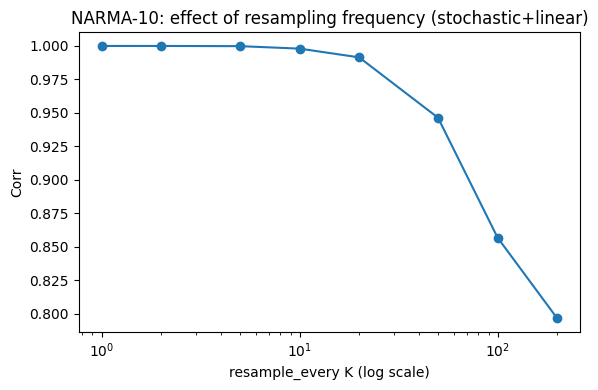

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=10,
    N=100,
    b_divide_by_order=False,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-20 | M=1200 | stochastic+linear ===
K=1     Corr=0.999983  MSE=1.09668e-08
K=2     Corr=0.999985  MSE=9.14136e-09
K=5     Corr=0.999898  MSE=6.24564e-08
K=10    Corr=0.998812  MSE=7.1647e-07
K=20    Corr=0.993921  MSE=3.64065e-06
K=50    Corr=0.961666  MSE=2.23302e-05
K=100   Corr=0.878706  MSE=6.74022e-05
K=200   Corr=0.801514  MSE=0.000105671


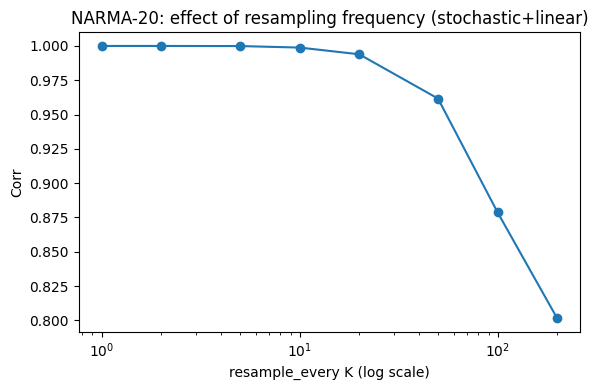

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=20,
    N=100,
    b_divide_by_order=False,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-30 | M=1200 | stochastic+linear ===
K=1     Corr=0.999982  MSE=7.43631e-09
K=2     Corr=0.999981  MSE=7.47529e-09
K=5     Corr=0.999811  MSE=7.48082e-08
K=10    Corr=0.998075  MSE=7.53949e-07
K=20    Corr=0.986188  MSE=5.24678e-06
K=50    Corr=0.937102  MSE=2.30566e-05
K=100   Corr=0.859312  MSE=4.92192e-05
K=200   Corr=0.814786  MSE=6.31572e-05


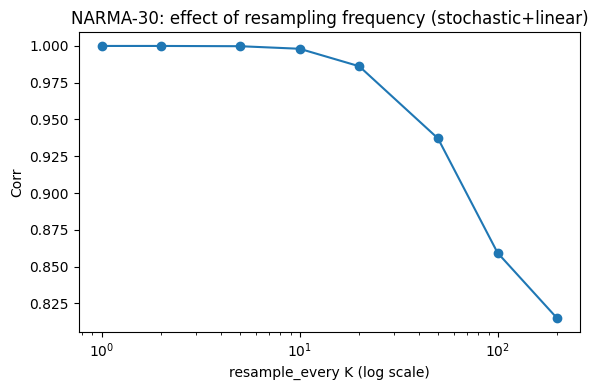

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=30,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-100 | M=1200 | stochastic+linear ===
K=1     Corr=0.999988  MSE=4.93491e-09
K=2     Corr=0.999973  MSE=1.07767e-08
K=5     Corr=0.999795  MSE=7.94034e-08
K=10    Corr=0.998089  MSE=7.26827e-07
K=20    Corr=0.991001  MSE=3.36246e-06
K=50    Corr=0.939479  MSE=2.17472e-05
K=100   Corr=0.860596  MSE=4.77077e-05
K=200   Corr=0.798523  MSE=6.66063e-05


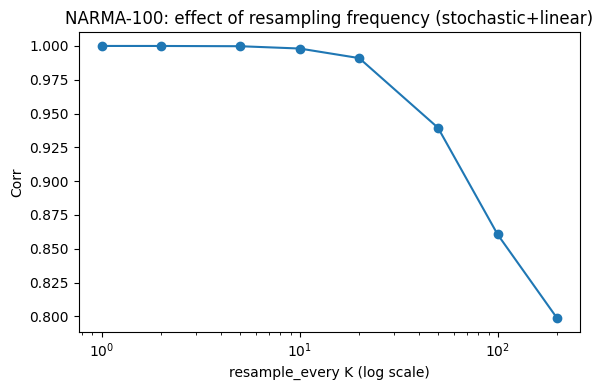

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=100,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-1000 | M=1200 | stochastic+linear ===
K=1     Corr=0.999976  MSE=9.63786e-09
K=2     Corr=0.999973  MSE=1.08923e-08
K=5     Corr=0.999855  MSE=5.82166e-08
K=10    Corr=0.998542  MSE=5.74555e-07
K=20    Corr=0.987617  MSE=4.77467e-06
K=50    Corr=0.944388  MSE=2.06897e-05
K=100   Corr=0.861311  MSE=4.91939e-05
K=200   Corr=0.801376  MSE=6.81057e-05


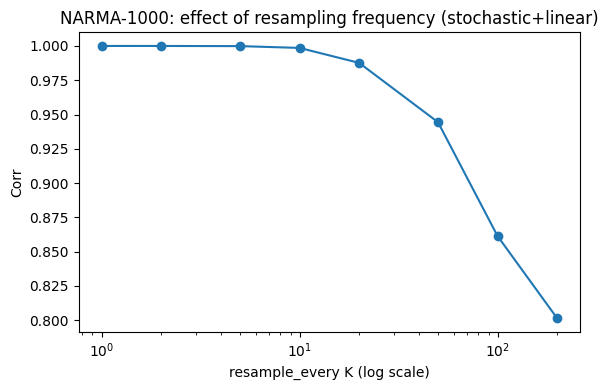

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=1000,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-10000 | M=1200 | stochastic+linear ===
K=1     Corr=0.999984  MSE=6.41313e-14
K=2     Corr=0.999991  MSE=3.52374e-14
K=5     Corr=0.999990  MSE=3.46351e-14
K=10    Corr=0.999988  MSE=4.24562e-14
K=20    Corr=0.999994  MSE=2.20463e-14
K=50    Corr=0.999946  MSE=1.95847e-13
K=100   Corr=0.999296  MSE=2.53147e-12
K=200   Corr=0.995313  MSE=1.68166e-11


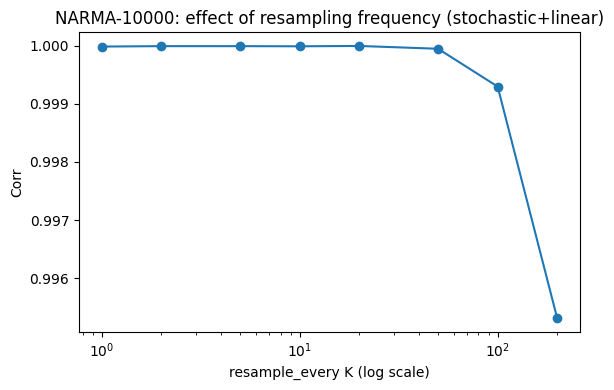

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=10000,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,
    T_series=6000,
    burn_in=1000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | NARMA-10000 | M=1200 | stochastic+linear ===
K=1     Corr=0.999981  MSE=7.74141e-09
K=2     Corr=0.999978  MSE=8.55186e-09
K=5     Corr=0.999816  MSE=7.25513e-08
K=10    Corr=0.998110  MSE=7.32287e-07
K=20    Corr=0.991706  MSE=3.17329e-06
K=50    Corr=0.924377  MSE=2.73386e-05
K=100   Corr=0.850123  MSE=5.20179e-05
K=200   Corr=0.813918  MSE=6.32434e-05


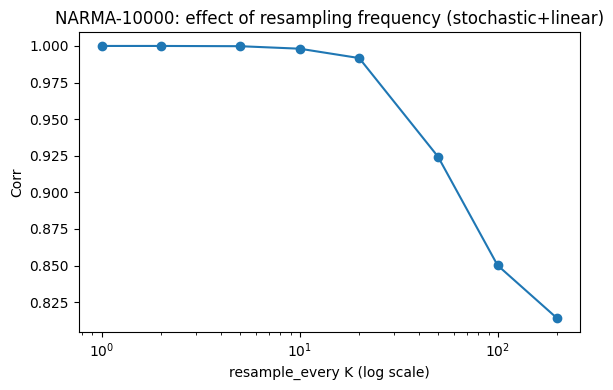

In [ ]:
rows = sweep_resample_every_on_stochastic_linear(
    order=10000,
    N=100,
    b_divide_by_order=True,
    u_high=0.2,
    T_series=60000,
    burn_in=15000,
    start_t=1000,
    T_train=1000,
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)

In [ ]:
y_series, u_series = narma_series(
        10000, length=60000,
        seed=123, burn_in=15000,
        u_high=0.2, b_divide_by_order=True
    )
np.std(y_series)

np.float64(0.013912586134575095)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Dict

def narma_sanity_check(
    order: int,
    *,
    length: int = 60000,
    burn_in: int = 15000,
    seed: int = 123,
    u_high: float = 0.2,
    b_divide_by_order: bool = True,
    # NARMA parameters (canonical-ish)
    a: float = 0.3,
    b: float = 0.05,
    c: float = 1.5,
    d: float = 0.1,
    plot: bool = True,
) -> Dict[str, float]:
    """
    Sanity check for NARMA difficulty.

    Returns:
      dict with statistics and baseline scores
    """

    rng = np.random.default_rng(seed)

    # ---------- generate input ----------
    u = rng.uniform(0.0, u_high, size=length)

    # ---------- effective parameters ----------
    b_eff = b / order if b_divide_by_order else b
    delay = order - 1

    # ---------- generate NARMA ----------
    y = np.zeros(length, dtype=float)

    for t in range(max(order, 1), length - 1):
        sum_y = np.sum(y[t - order + 1 : t + 1])
        u_delay = u[t - delay] if t - delay >= 0 else 0.0
        y[t + 1] = (
            a * y[t]
            + b_eff * y[t] * sum_y
            + c * u[t] * u_delay
            + d
        )

    # discard burn-in
    y = y[burn_in:]
    u = u[burn_in:]

    # ---------- basic stats ----------
    y_mean = float(np.mean(y))
    y_std = float(np.std(y))
    y_min = float(np.min(y))
    y_max = float(np.max(y))

    # ---------- naive baselines ----------
    # constant predictor
    y_const = np.full_like(y, y_mean)
    mse_const = float(np.mean((y - y_const) ** 2))
    corr_const = float(np.corrcoef(y, y_const)[0, 1])

    # previous-value predictor
    y_prev = np.roll(y, 1)
    y_prev[0] = y_prev[1]
    mse_prev = float(np.mean((y - y_prev) ** 2))
    corr_prev = float(np.corrcoef(y, y_prev)[0, 1])

    # ---------- term contribution scales ----------
    # estimate typical magnitudes
    ay = np.abs(a * y[:-1])
    by = np.abs(b_eff * y[:-1] * np.array(
        [np.sum(y[max(0, i-order+1):i+1]) for i in range(len(y)-1)]
    ))
    cu = np.abs(c * u[:-1] * np.roll(u, delay)[:-1])
    dterm = np.full_like(ay, abs(d))

    contrib = {
        "a*y": float(np.mean(ay)),
        "b*y*sum(y)": float(np.mean(by)),
        "c*u*u_delay": float(np.mean(cu)),
        "d": float(np.mean(dterm)),
    }

    # ---------- plotting ----------
    if plot:
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))

        # y time series
        axes[0, 0].plot(y[:1000])
        axes[0, 0].set_title("NARMA output y(t) (first 1000)")

        # histogram
        axes[0, 1].hist(y, bins=50)
        axes[0, 1].set_title("y distribution")

        # naive comparison
        axes[1, 0].bar(
            ["Const", "Prev"],
            [corr_const, corr_prev],
        )
        axes[1, 0].set_ylim(0, 1)
        axes[1, 0].set_title("Naive predictor Corr")

        # term contributions
        axes[1, 1].bar(contrib.keys(), contrib.values())
        axes[1, 1].set_title("Mean magnitude of NARMA terms")

        plt.tight_layout()
        plt.show()

    # ---------- print summary ----------
    print(f"\n=== NARMA-{order} Sanity Check ===")
    print(f"y: mean={y_mean:.6e}, std={y_std:.6e}, min={y_min:.6e}, max={y_max:.6e}")
    print(f"[Naive const] Corr={corr_const:.6f}, MSE={mse_const:.6e}")
    print(f"[Naive prev ] Corr={corr_prev:.6f}, MSE={mse_prev:.6e}")
    print("Term contributions (mean abs):")
    for k, v in contrib.items():
        print(f"  {k:>14s} : {v:.6e}")

    return {
        "y_mean": y_mean,
        "y_std": y_std,
        "naive_const_corr": corr_const,
        "naive_prev_corr": corr_prev,
        "term_contrib": contrib,
    }

/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


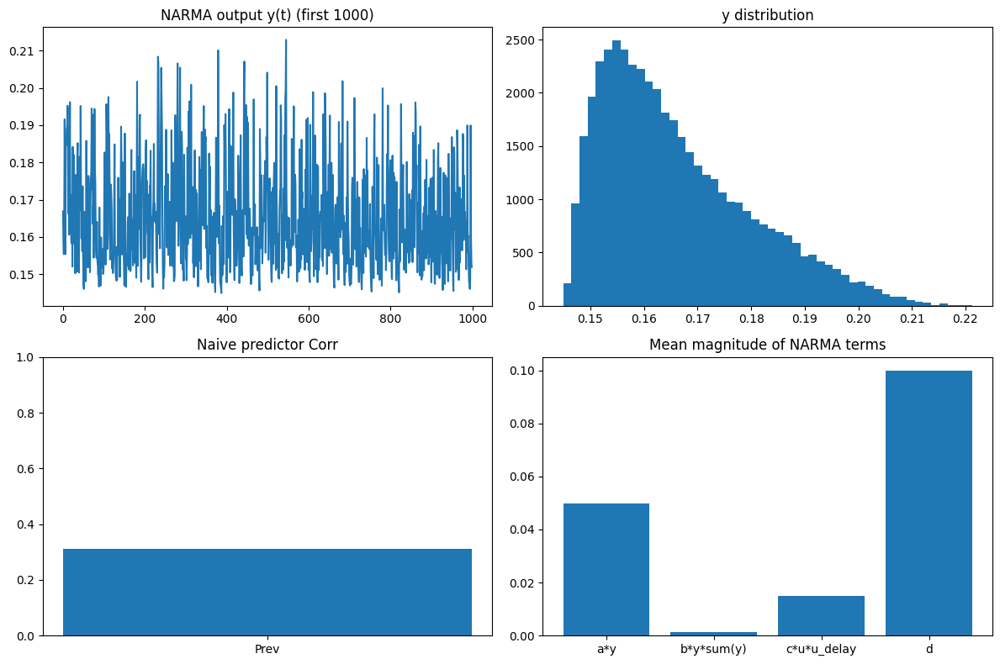


=== NARMA-10000 Sanity Check ===
y: mean=1.661545e-01, std=1.392346e-02, min=1.449108e-01, max=2.212178e-01
[Naive const] Corr=nan, MSE=1.938628e-04
[Naive prev ] Corr=0.312104, MSE=2.667131e-04
Term contributions (mean abs):
             a*y : 4.984644e-02
      b*y*sum(y) : 1.227540e-03
     c*u*u_delay : 1.495959e-02
               d : 1.000000e-01


In [ ]:
stats = narma_sanity_check(
    order=10000,
    length=60000,
    burn_in=15000,
    b_divide_by_order=True,
    u_high=0.2,
)

In [ ]:
import numpy as np
from typing import Tuple, Optional

def generate_correlated_u(
    length: int,
    *,
    seed: int = 123,
    u_high: float = 0.2,
    kind: str = "ar1",          # "ar1" or "ma"
    rho: float = 0.999,         # AR(1) correlation (close to 1 => long correlation)
    ma_window: int = 500,       # moving-average window if kind="ma"
    burn_in: int = 2000,
) -> np.ndarray:
    """
    Generate correlated input u(t) in [0, u_high].

    - kind="ar1": x_t = rho*x_{t-1} + sqrt(1-rho^2)*eps
    - kind="ma" : iid uniform then moving-average smooth

    Output is min-max scaled to [0, u_high].
    """
    rng = np.random.default_rng(seed)

    if kind == "ar1":
        # Gaussian AR(1) -> rescale
        eps = rng.normal(0.0, 1.0, size=length + burn_in)
        x = np.zeros(length + burn_in, dtype=float)
        s = np.sqrt(max(1e-12, 1.0 - rho * rho))
        for t in range(1, length + burn_in):
            x[t] = rho * x[t - 1] + s * eps[t]
        x = x[burn_in:]

    elif kind == "ma":
        # Uniform iid then moving average smooth
        x = rng.uniform(0.0, 1.0, size=length + burn_in)
        # simple moving average via convolution
        w = int(ma_window)
        if w < 1:
            raise ValueError("ma_window must be >= 1")
        kernel = np.ones(w, dtype=float) / w
        x = np.convolve(x, kernel, mode="same")
        x = x[burn_in:]

    else:
        raise ValueError('kind must be "ar1" or "ma"')

    # robust scaling to [0, u_high]
    # clip extremes then min-max
    lo, hi = np.percentile(x, [0.5, 99.5])
    x = np.clip(x, lo, hi)
    x = (x - x.min()) / (x.max() - x.min() + 1e-12)
    u = x * float(u_high)
    return u


def narma_series_stable(
    order: int,
    length: int,
    *,
    seed: int = 123,
    burn_in: int = 15000,
    # input
    u_high: float = 0.2,
    u_kind: str = "ar1",
    rho: float = 0.999,       # long correlation
    ma_window: int = 500,
    # NARMA parameters
    a: float = 0.3,
    b: float = 0.05,
    c: float = 1.5,
    d: float = 0.1,
    b_divide_by_order: bool = False,
    # stability / difficulty controls
    y_clip: float = 5.0,          # clip y to [-y_clip, y_clip]
    sum_norm: str = "mean",       # "mean" or "sum"
    u_delay_mode: str = "mul",    # "mul" (u*u_delay) or "mul_centered"
    center_u: bool = True,        # center u before multiplication for stronger structure
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Stable NARMA-like series with correlated input.

    Returns:
      y: (length - burn_in,)
      u: (length - burn_in,)
    """
    if order < 1:
        raise ValueError("order must be >= 1")

    # Need enough length to realize delay effects
    delay = order - 1
    if length <= burn_in + delay + 5:
        raise ValueError(
            f"length too short. Need length > burn_in+delay. "
            f"Got length={length}, burn_in={burn_in}, delay={delay}"
        )

    # correlated input
    u = generate_correlated_u(
        length=length,
        seed=seed,
        u_high=u_high,
        kind=u_kind,
        rho=rho,
        ma_window=ma_window,
        burn_in=2000,
    )

    # optionally center u (important for making u*u_delay informative)
    if center_u:
        u0 = u - np.mean(u)
    else:
        u0 = u

    b_eff = b / order if b_divide_by_order else b

    y = np.zeros(length, dtype=float)

    # warm start y with small noise (optional)
    rng = np.random.default_rng(seed + 1)
    y[:order] = 0.01 * rng.normal(size=order)

    for t in range(order, length - 1):
        # history window y[t-order+1 : t+1]
        y_hist = y[t - order + 1 : t + 1]

        if sum_norm == "mean":
            s = float(np.mean(y_hist))
        elif sum_norm == "sum":
            s = float(np.sum(y_hist))
        else:
            raise ValueError('sum_norm must be "mean" or "sum"')

        # delayed input
        u_t = u0[t]
        u_delay = u0[t - delay]

        if u_delay_mode == "mul":
            uu = u_t * u_delay
        elif u_delay_mode == "mul_centered":
            # emphasize covariance structure
            uu = u_t * u_delay
        else:
            raise ValueError('u_delay_mode must be "mul" or "mul_centered"')

        y_next = (
            a * y[t]
            + b_eff * y[t] * s
            + c * uu
            + d
        )

        # clip to avoid runaway / overflow
        y[t + 1] = np.clip(y_next, -y_clip, y_clip)

    # discard burn-in
    return y[burn_in:], u[burn_in:]


def make_scalar_dataset_next(u: np.ndarray, y: np.ndarray, start_t: int, T: int):
    """
    Input:  U[k] = u(t),  t = start_t + k
    Teacher: Y[k] = y(t+1)
    """
    u = np.asarray(u, float).reshape(-1)
    y = np.asarray(y, float).reshape(-1)
    if start_t < 0:
        raise ValueError("start_t must be >= 0")
    if start_t + T + 1 > len(y) or start_t + T > len(u):
        raise ValueError("range out of series")
    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y

In [ ]:
def sweep_resample_every_on_stochastic_linear_correlated_narma(
    order: int,
    *,
    N: int = 100,
    T_series: int = 60000,
    burn_in: int = 15000,
    data_seed: int = 123,
    u_high: float = 0.2,
    b_divide_by_order: bool = False,
    # correlated input settings
    u_kind: str = "ar1",
    rho: float = 0.999,
    ma_window: int = 500,
    # stability/difficulty
    y_clip: float = 5.0,
    sum_norm: str = "mean",
    center_u: bool = True,
    # training window
    start_t: int = 1000,
    T_train: int = 1000,
    ridge: float = 1e-2,
    # QRC base params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    qrc_seed: int = 43,
    Win_scale: float = 1.0,
    carry_state: bool = True,
    state_leak: float = 1.0,
    # sweep
    K_list = (1, 2, 5, 10, 20, 50, 100, 200),
):
    # --- data (correlated + stable)
    y_series, u_series = narma_series_stable(
        order=order,
        length=T_series,
        seed=data_seed,
        burn_in=burn_in,
        u_high=u_high,
        u_kind=u_kind,
        rho=rho,
        ma_window=ma_window,
        b_divide_by_order=b_divide_by_order,
        y_clip=y_clip,
        sum_norm=sum_norm,
        center_u=center_u,
    )

    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    M = 12 * N
    rng = np.random.default_rng(qrc_seed)
    Win_fixed = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)

    rows = []
    for K in K_list:
        S, _, _ = simulate_qrc_states_outprob_scalar_ablation(
            N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
            U=U,
            seed=qrc_seed,
            norm_const=norm_const,
            input_mode="scale",
            Win=Win_fixed,
            carry_state=carry_state,
            sign_mode="plus",
            inject_mode="stochastic",
            nonlin_mode="linear",
            linear_gain=1.0, linear_bias=0.5,
            state_leak=state_leak,
            resample_every=int(K),
            resample_mode="hold",
            fixed_signs_in_hold=True,
        )
        w, b = fit_readout_ridge(S, Y, ridge=ridge)
        Yhat = predict_readout(S, w, b)
        mse, corr = mse_corr(Y, Yhat)
        rows.append((K, mse, corr))

    print(f"\n=== Sweep resample_every K | Correlated NARMA-{order} | M={12*N} | stochastic+linear ===")
    print(f"u_kind={u_kind}, rho={rho}, b_divide_by_order={b_divide_by_order}, sum_norm={sum_norm}, center_u={center_u}")
    for K, mse, corr in rows:
        print(f"K={K:<4}  Corr={corr:.6f}  MSE={mse:.6g}")

    # quick plot
    Ks = np.array([r[0] for r in rows], dtype=float)
    Corrs = np.array([r[2] for r in rows], dtype=float)
    plt.figure(figsize=(6,4))
    plt.plot(Ks, Corrs, marker="o")
    plt.xscale("log")
    plt.xlabel("resample_every K (log scale)")
    plt.ylabel("Corr")
    plt.title(f"Correlated NARMA-{order}: effect of resampling frequency")
    plt.tight_layout()
    plt.show()

    return rows

In [ ]:
y_series, u_series = narma_series_stable(
        order=100,
        length=60000,
        seed=123,
        burn_in=15000,
        u_high=0.2,
        u_kind="ar1",
        rho=0.9999,
        ma_window=500,
        b_divide_by_order=True,
        y_clip=5.0,
        sum_norm="mean",
        center_u=True,
    )
np.std(y_series)

np.float64(0.004872603840798605)


=== Sweep resample_every K | Correlated NARMA-5 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.902487  MSE=2.13835e-06
K=2     Corr=0.942970  MSE=1.27721e-06
K=5     Corr=0.988219  MSE=2.69982e-07
K=10    Corr=0.998896  MSE=2.54408e-08
K=20    Corr=0.999500  MSE=1.15311e-08
K=50    Corr=0.999174  MSE=1.90375e-08
K=100   Corr=0.998833  MSE=2.68841e-08
K=200   Corr=0.998996  MSE=2.31315e-08


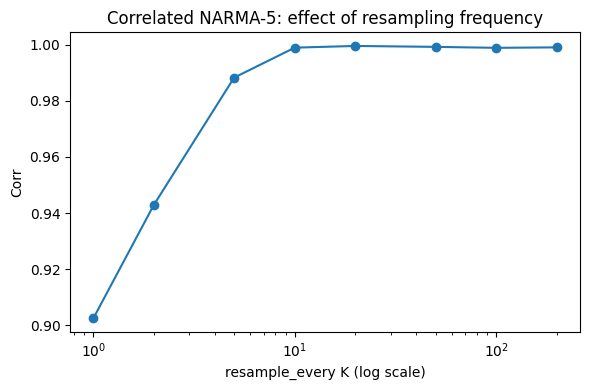

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=5,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-20 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.902328  MSE=2.13286e-06
K=2     Corr=0.941323  MSE=1.30759e-06
K=5     Corr=0.988129  MSE=2.70912e-07
K=10    Corr=0.998831  MSE=2.68305e-08
K=20    Corr=0.999642  MSE=8.22917e-09
K=50    Corr=0.999130  MSE=1.99579e-08
K=100   Corr=0.998431  MSE=3.59832e-08
K=200   Corr=0.998058  MSE=4.45359e-08


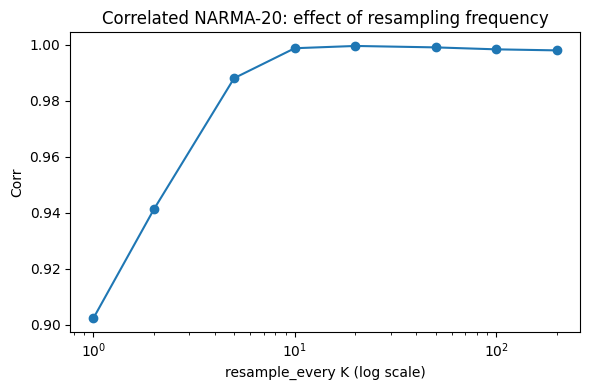

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=20,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-30 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.901548  MSE=2.13774e-06
K=2     Corr=0.941271  MSE=1.30184e-06
K=5     Corr=0.988084  MSE=2.70515e-07
K=10    Corr=0.998903  MSE=2.5037e-08
K=20    Corr=0.999602  MSE=9.0981e-09
K=50    Corr=0.998671  MSE=3.03386e-08
K=100   Corr=0.998246  MSE=4.00294e-08
K=200   Corr=0.997687  MSE=5.27528e-08


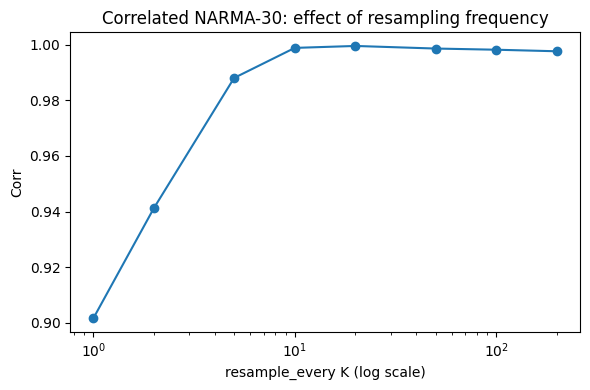

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=30,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-100 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.898934  MSE=2.09189e-06
K=2     Corr=0.940656  MSE=1.25531e-06
K=5     Corr=0.988370  MSE=2.52058e-07
K=10    Corr=0.998793  MSE=2.62988e-08
K=20    Corr=0.999589  MSE=8.96473e-09
K=50    Corr=0.998627  MSE=2.99177e-08
K=100   Corr=0.997175  MSE=6.14982e-08
K=200   Corr=0.996461  MSE=7.70156e-08


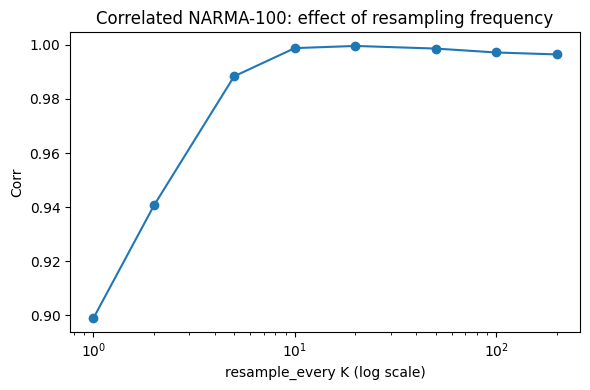

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=100,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-200 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.899577  MSE=1.87157e-06
K=2     Corr=0.939767  MSE=1.1463e-06
K=5     Corr=0.988496  MSE=2.24433e-07
K=10    Corr=0.998811  MSE=2.33074e-08
K=20    Corr=0.999569  MSE=8.45525e-09
K=50    Corr=0.998239  MSE=3.45338e-08
K=100   Corr=0.996049  MSE=7.73893e-08
K=200   Corr=0.995364  MSE=9.07635e-08


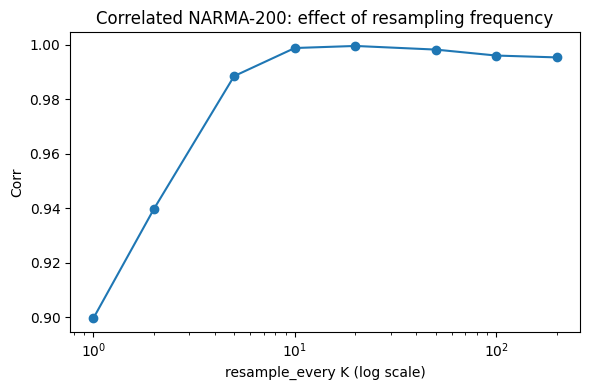

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=200,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-500 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.894756  MSE=1.80248e-06
K=2     Corr=0.939474  MSE=1.06107e-06
K=5     Corr=0.988686  MSE=2.03387e-07
K=10    Corr=0.998705  MSE=2.33973e-08
K=20    Corr=0.999570  MSE=7.78099e-09
K=50    Corr=0.998142  MSE=3.35596e-08
K=100   Corr=0.996635  MSE=6.07322e-08
K=200   Corr=0.995355  MSE=8.37848e-08


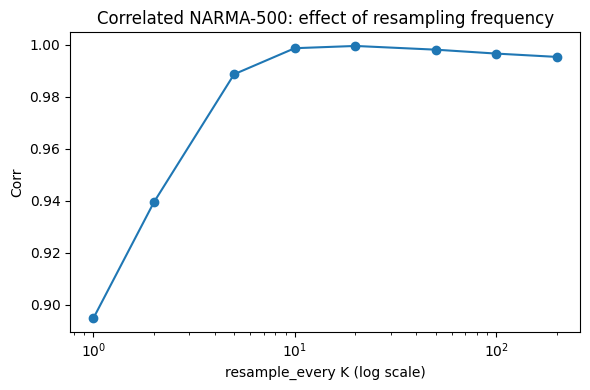

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=500,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-1000 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.900862  MSE=1.9945e-06
K=2     Corr=0.945912  MSE=1.11395e-06
K=5     Corr=0.988026  MSE=2.51944e-07
K=10    Corr=0.998717  MSE=2.71455e-08
K=20    Corr=0.999568  MSE=9.13398e-09
K=50    Corr=0.998891  MSE=2.34572e-08
K=100   Corr=0.997870  MSE=4.50371e-08
K=200   Corr=0.997482  MSE=5.32278e-08


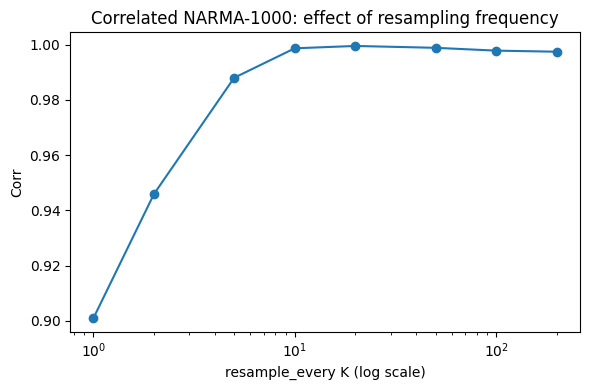

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=1000,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,5,10,20,50,100,200),
)


=== Sweep resample_every K | Correlated NARMA-10000 | M=1200 | stochastic+linear ===
u_kind=ar1, rho=0.9999, b_divide_by_order=False, sum_norm=mean, center_u=True
K=1     Corr=0.837381  MSE=2.54199e-07
K=2     Corr=0.905284  MSE=1.53527e-07
K=3     Corr=0.950888  MSE=8.15118e-08
K=4     Corr=0.970769  MSE=4.90093e-08
K=5     Corr=0.986772  MSE=2.23586e-08
K=7     Corr=0.995424  MSE=7.76856e-09
K=9     Corr=0.997592  MSE=4.09166e-09
K=10    Corr=0.998268  MSE=2.9438e-09
K=20    Corr=0.996609  MSE=5.7601e-09
K=30    Corr=0.992459  MSE=1.27832e-08
K=40    Corr=0.991833  MSE=1.38404e-08
K=50    Corr=0.983818  MSE=2.73133e-08
K=60    Corr=0.985030  MSE=2.52835e-08
K=70    Corr=0.980868  MSE=3.22458e-08
K=80    Corr=0.984758  MSE=2.57386e-08
K=90    Corr=0.970307  MSE=4.97878e-08
K=100   Corr=0.970381  MSE=4.96662e-08
K=200   Corr=0.961248  MSE=6.46608e-08


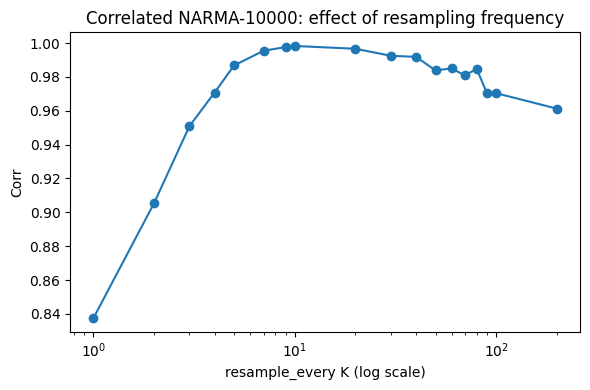

In [ ]:
rows = sweep_resample_every_on_stochastic_linear_correlated_narma(
    order=10000,
    N=100,
    T_series=60000,
    burn_in=15000,
    data_seed=123,
    u_high=0.2,
    b_divide_by_order=False,   # ←まずは False 推奨（難しさを殺さない）
    u_kind="ar1",
    rho=0.9999,                # ★ここ重要
    sum_norm="mean",
    center_u=True,
    y_clip=5.0,
    start_t=1000,
    T_train=2000,              # 少し長め推奨
    ridge=1e-2,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    K_list=(1,2,3,4,5,7,9,10,20,30,40,50,60,70,80,90,100,200),
)

NARMAの定義を変え、長さを長くしても大丈夫なようにする

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict, List

# =========================================================
# 0) Ridge readout（bias付き、biasは正則化しない）
# =========================================================
def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-2) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    X = np.hstack([S, np.ones((T, 1))])                 # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))    # bias not regularized
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    return theta[:M], float(theta[M])

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

def mse_corr(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, float]:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    mse = float(np.mean((y_true - y_pred) ** 2))
    if np.std(y_true) < 1e-12 or np.std(y_pred) < 1e-12:
        corr = np.nan
    else:
        corr = float(np.corrcoef(y_true, y_pred)[0, 1])
    return mse, corr

def plot_true_vs_pred(y_true, y_pred, *, title="", start=0, length=300):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    end = min(start + length, y_true.size)
    plt.figure(figsize=(12, 4))
    plt.plot(np.arange(start, end), y_true[start:end], label="True", lw=2)
    plt.plot(np.arange(start, end), y_pred[start:end], label="Pred", lw=1.5, alpha=0.85)
    plt.title(title)
    plt.xlabel("time index")
    plt.ylabel("y")
    plt.legend()
    plt.tight_layout()
    plt.show()


# =========================================================
# 1) NARMA 生成（安定化：高orderでも発散しにくい）
#   ★重要：b_divide_by_order を切り替え可能
# =========================================================
def narma_series(
    order: int,
    length: int,
    *,
    seed: int = 0,
    burn_in: int = 1000,
    u_low: float = 0.0,
    u_high: float = 0.2,
    a: float = 0.3,
    b: float = 0.05,
    c: float = 1.5,
    d: float = 0.1,
    b_divide_by_order: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    y(t+1) = a y(t) + b y(t) sum_{i=0..order-1} y(t-i) + c u(t-order+1)u(t) + d
    Returns: (y, u) each shape (length,)
    """
    if order < 1:
        raise ValueError("order must be >= 1")

    rng = np.random.default_rng(seed)
    total = length + burn_in
    u = rng.uniform(u_low, u_high, size=total).astype(float)
    y = np.zeros(total, dtype=float)

    b_eff = b / float(order) if b_divide_by_order else b
    delay = order - 1

    for t in range(total - 1):
        s = 0.0
        for i in range(order):
            idx = t - i
            if idx >= 0:
                s += y[idx]
        u_t = u[t]
        u_delay = u[t - delay] if (t - delay) >= 0 else 0.0
        y[t + 1] = a * y[t] + b_eff * y[t] * s + c * u_delay * u_t + d

    return y[burn_in:], u[burn_in:]


def make_scalar_dataset_next(u_series: np.ndarray, y_series: np.ndarray, start_t: int, T: int):
    """
    入力:  U[k] = u(t),   t = start_t + k
    教師:  Y[k] = y(t+1)
    """
    u = np.asarray(u_series, float).reshape(-1)
    y = np.asarray(y_series, float).reshape(-1)
    if start_t + T + 1 > len(y):
        raise ValueError("need y(t+1) range")
    U = u[start_t : start_t + T]
    Y = y[start_t + 1 : start_t + T + 1]
    return U, Y


# =========================================================
# 2) あなたの QRC（スカラー入力 out_prob）※安全版
# =========================================================
def simulate_qrc_states_outprob_scalar(
    N: int,
    alpha: float,
    beta: float,
    squeeze_r: float,
    U: np.ndarray,
    *,
    seed: int = 43,
    norm_const: float = 1.0,
    sign_mode: str = "plus",       # "pm" or "plus"
    input_mode: str = "scale",
    Win: Optional[np.ndarray] = None,  # (M,)
    Win_scale: float = 1.0,
    carry_state: bool = True,
) -> Tuple[np.ndarray, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    M = 12 * N
    rng = np.random.default_rng(seed)

    if Win is None:
        Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)
    else:
        Win = np.asarray(Win, float).reshape(-1)
        if Win.size != M:
            raise ValueError(f"Win must be length {M}")

    x_state = np.zeros(M, dtype=float)

    sqrt2 = np.sqrt(2.0)
    sqrt3 = np.sqrt(3.0)

    def bs50(a, b):
        return ((a + b) / sqrt2, (-a + b) / sqrt2)

    def apply_pairs_blockwise(vec: np.ndarray, pairs, mix_fn):
        outv = vec.copy()
        for blk in range(N):
            off = 12 * blk
            for (i, j) in pairs:
                a, b = vec[off + i], vec[off + j]
                ai, bj = mix_fn(a, b)
                outv[off + i] = ai
                outv[off + j] = bj
        return outv

    def tri_mix(a, b):
        return ((a + np.sqrt(2.0) * b) / sqrt3, ((-np.sqrt(2.0)) * a + b) / sqrt3)

    S = np.empty((T, M), dtype=float)

    for t in range(T):
        u_vec = U[t] * Win
        if input_mode == "scale":
            u_vec = float(beta) * u_vec
        elif input_mode != "replace":
            raise ValueError('input_mode must be "scale" or "replace".')

        p = np.clip(x_state, 0.0, 1.0)
        r_uni = rng.random(M)
        inject_mask = (r_uni >= p)

        if sign_mode == "pm":
            signs = rng.integers(0, 2, size=M) * 2 - 1
        elif sign_mode == "plus":
            signs = np.ones(M, dtype=float)
        else:
            raise ValueError('sign_mode must be "pm" or "plus".')

        s = np.where(inject_mask, signs * float(alpha), 0.0)

        pairs_adj = [(k, k + 1) for k in range(0, 12, 2)]
        t2 = apply_pairs_blockwise(s, pairs_adj, bs50)

        rvec = t2.copy()
        for blk in range(N - 1, 0, -1):
            rvec[12 * blk + 3] = t2[12 * (blk - 1) + 3]
            rvec[12 * blk + 8] = t2[12 * (blk - 1) + 8]
        rvec[3] = 0.0
        rvec[8] = 0.0

        pairs_step4 = [(0, 2), (1, 3), (6, 5), (8, 10), (11, 9)]
        v = apply_pairs_blockwise(rvec, pairs_step4, bs50)

        pairs_step5 = [(4, 3), (7, 8)]
        wnet = apply_pairs_blockwise(v, pairs_step5, tri_mix)

        fin = (wnet + u_vec) / sqrt2

        coef = 1.0 / np.cosh(squeeze_r)
        tanh_r = np.tanh(squeeze_r)
        log_p0 = np.log(coef) - (np.abs(fin) ** 2) + tanh_r * (fin ** 2)

        re = np.real(log_p0)
        im = np.imag(log_p0)
        re = np.clip(re, -700.0, 50.0)
        p0_like = np.exp(re + 1j * im)

        out_prob = 1.0 - (p0_like / float(norm_const))
        out_prob = np.clip(np.real(out_prob).astype(float), 0.0, 1.0)

        S[t] = out_prob

        if carry_state:
            x_state = np.clip(1.0 - out_prob, 0.0, 1.0)

    return S, x_state


# =========================================================
# 3) ESN（再帰あり）スカラー入力
# =========================================================
def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,
    *,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)
    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(spectral_radius) / sr)
    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)
    for t in range(T):
        pre = x @ Wres + (Win * U[t]) + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S, {"Wres": Wres, "Win": Win, "b": b}


# =========================================================
# 4) RF-ESN（再帰なし）＝ Random Features / ELM
#    S(t) = phi( Win*u(t) + b )  だけ（xもWresも無し）
# =========================================================
def simulate_random_features_scalar(
    M: int,
    U: np.ndarray,
    *,
    seed: int = 43,
    input_scale: float = 0.5,
    bias_scale: float = 0.1,
    nonlinearity: str = "tanh",   # "tanh" or "relu"
) -> Dict[str, np.ndarray]:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    pre = U[:, None] * Win[None, :] + b[None, :]
    if nonlinearity == "tanh":
        S = np.tanh(pre)
    elif nonlinearity == "relu":
        S = np.maximum(pre, 0.0)
    else:
        raise ValueError('nonlinearity must be "tanh" or "relu".')

    return {"S": S, "Win": Win, "b": b}


# =========================================================
# 5) 3本を同条件で比較（orderを変えてもOK）
# =========================================================
def compare_three_models_on_narma(
    order: int,
    *,
    N: int = 100,              # QRC: M=12N
    T_series: int = 6000,
    burn_in: int = 1000,
    data_seed: int = 0,
    u_high: float = 0.2,
    start_t: int = 1000,
    T_train: int = 1000,
    b_divide_by_order: bool = True,   # まずはあなたの現状と同じにして比較、その後Falseも試す
    ridge: float = 1e-2,
    # QRC params
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    sign_mode: str = "plus",
    input_mode: str = "scale",
    carry_state: bool = True,
    qrc_seed: int = 43,
    qrc_win_scale: float = 1.0,
    # ESN params
    esn_seed: int = 43,
    spectral_radius: float = 0.9,
    leak_rate: float = 1.0,
    input_scale_esn: float = 0.5,
    bias_scale_esn: float = 0.1,
    # RF params
    rf_seed: int = 43,
    input_scale_rf: float = 0.5,
    bias_scale_rf: float = 0.1,
    rf_nonlinearity: str = "tanh",
):
    # --- data
    y_series, u_series = narma_series_stable(
        order=order,
        length=60000,
        seed=123,
        burn_in=15000,
        u_high=0.2,
        u_kind="ar1",
        rho=0.9999,
        ma_window=500,
        b_divide_by_order=b_divide_by_order,
        y_clip=5.0,
        sum_norm="mean",
        center_u=True,
    )
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    M = 12 * N

    # --- QRC
    S_qrc, _ = simulate_qrc_states_outprob_scalar(
        N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
        U=U,
        seed=qrc_seed,
        norm_const=norm_const,
        sign_mode=sign_mode,
        input_mode=input_mode,
        Win=None, Win_scale=qrc_win_scale,
        carry_state=carry_state,
    )
    wq, bq = fit_readout_ridge(S_qrc, Y, ridge=ridge)
    Yhat_q = predict_readout(S_qrc, wq, bq)
    mse_q, corr_q = mse_corr(Y, Yhat_q)

    # --- ESN (recurrent)
    S_esn, _ = simulate_esn_states_tanh_scalar(
        M=M, U=U,
        seed=esn_seed,
        spectral_radius=spectral_radius,
        input_scale=input_scale_esn,
        leak_rate=leak_rate,
        bias_scale=bias_scale_esn,
    )
    we, be = fit_readout_ridge(S_esn, Y, ridge=ridge)
    Yhat_e = predict_readout(S_esn, we, be)
    mse_e, corr_e = mse_corr(Y, Yhat_e)

    # --- Random Features (no recurrence)
    rf = simulate_random_features_scalar(
        M=M, U=U,
        seed=rf_seed,
        input_scale=input_scale_rf,
        bias_scale=bias_scale_rf,
        nonlinearity=rf_nonlinearity,
    )
    S_rf = rf["S"]
    wr, br = fit_readout_ridge(S_rf, Y, ridge=ridge)
    Yhat_r = predict_readout(S_rf, wr, br)
    mse_r, corr_r = mse_corr(Y, Yhat_r)

    print(f"=== NARMA-{order} | M={M} | b_divide_by_order={b_divide_by_order} ===")
    print(f"[QRC]     MSE={mse_q:.6g}  Corr={corr_q:.6g}")
    print(f"[ESN]     MSE={mse_e:.6g}  Corr={corr_e:.6g}")
    print(f"[RF-ESN]  MSE={mse_r:.6g}  Corr={corr_r:.6g}")

    plot_true_vs_pred(Y, Yhat_q, title=f"QRC (teacher-forced 1-step) | NARMA-{order}")
    plot_true_vs_pred(Y, Yhat_e, title=f"ESN recurrent (teacher-forced 1-step) | NARMA-{order}")
    plot_true_vs_pred(Y, Yhat_r, title=f"Random Features (no recurrence) | NARMA-{order}")

    return {
        "Y": Y,
        "Yhat_qrc": Yhat_q,
        "Yhat_esn": Yhat_e,
        "Yhat_rf": Yhat_r,
        "metrics": {
            "qrc": (mse_q, corr_q),
            "esn": (mse_e, corr_e),
            "rf":  (mse_r, corr_r),
        }
    }

=== NARMA-30 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=4.94892e-08  Corr=0.9979
[ESN]     MSE=1.68477e-07  Corr=0.991759
[RF-ESN]  MSE=2.57571e-07  Corr=0.987372


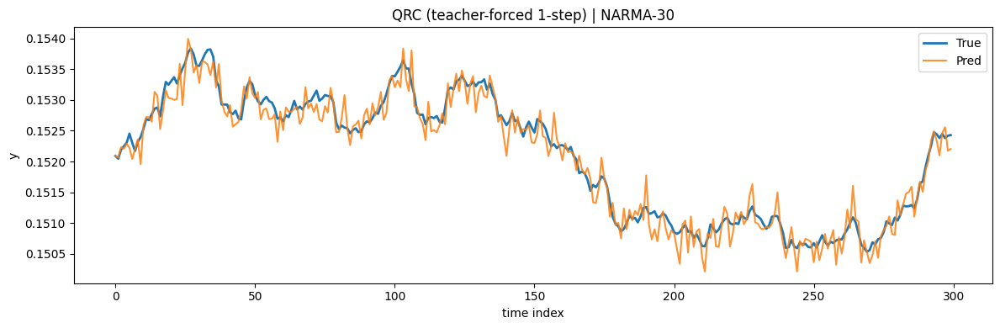

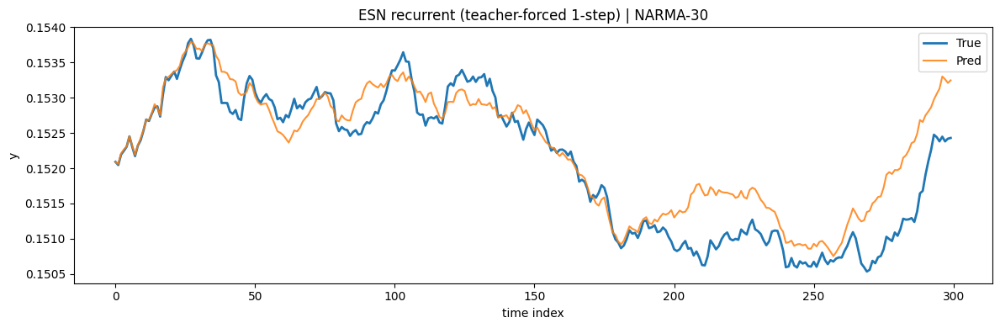

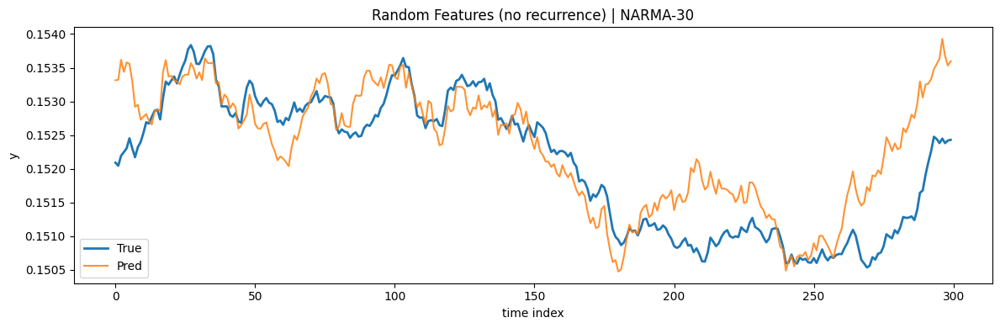

=== NARMA-200 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=3.02043e-08  Corr=0.997812
[ESN]     MSE=5.1189e-07  Corr=0.956968
[RF-ESN]  MSE=6.27194e-07  Corr=0.947


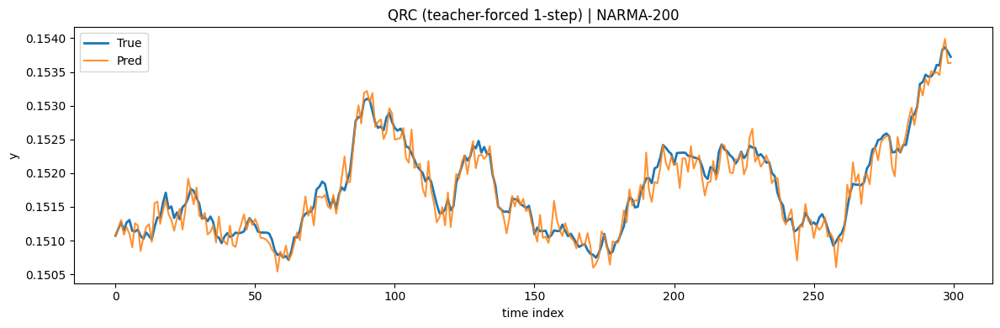

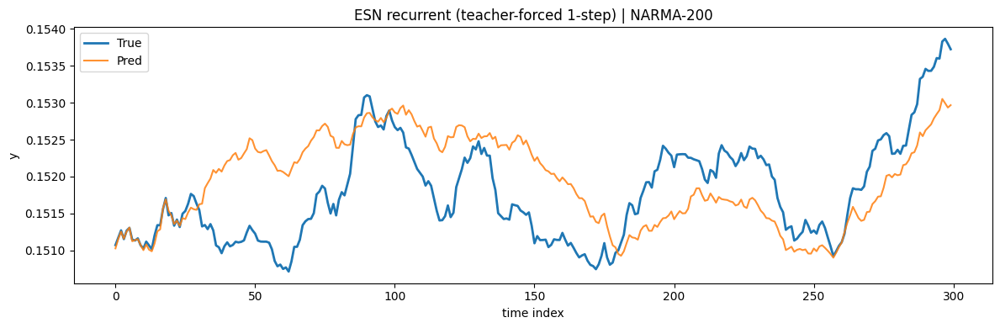

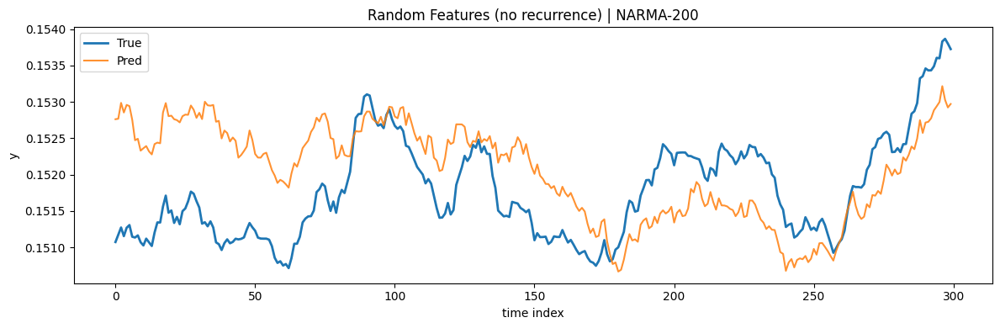

=== NARMA-500 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=2.43002e-08  Corr=0.997535
[ESN]     MSE=3.55876e-07  Corr=0.957952
[RF-ESN]  MSE=4.16048e-07  Corr=0.950656


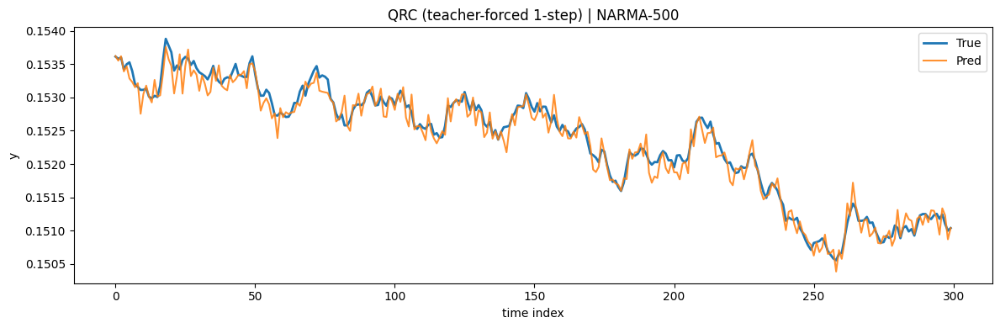

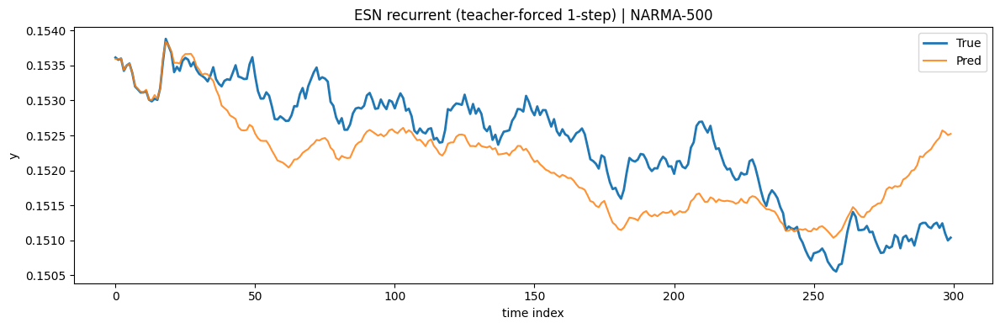

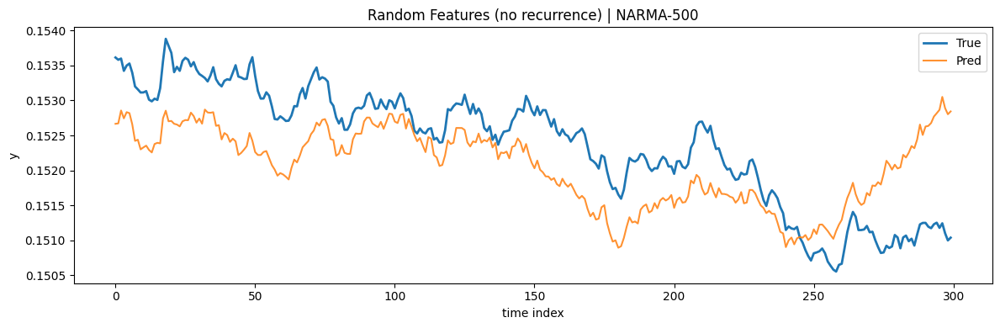

=== NARMA-1000 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=4.21056e-08  Corr=0.997829
[ESN]     MSE=4.72193e-07  Corr=0.971512
[RF-ESN]  MSE=6.7167e-07  Corr=0.959221


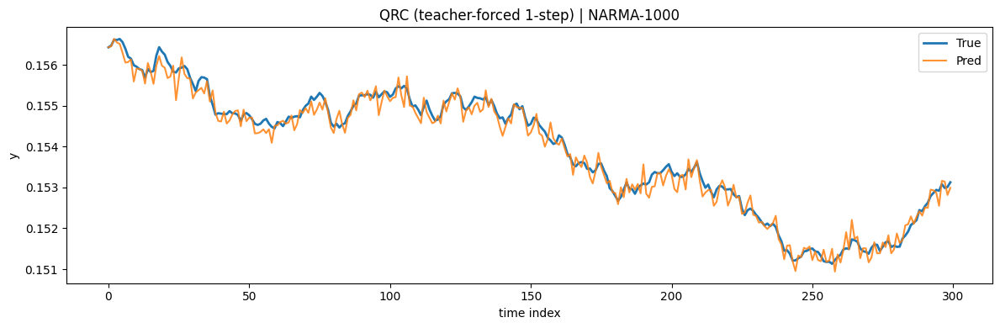

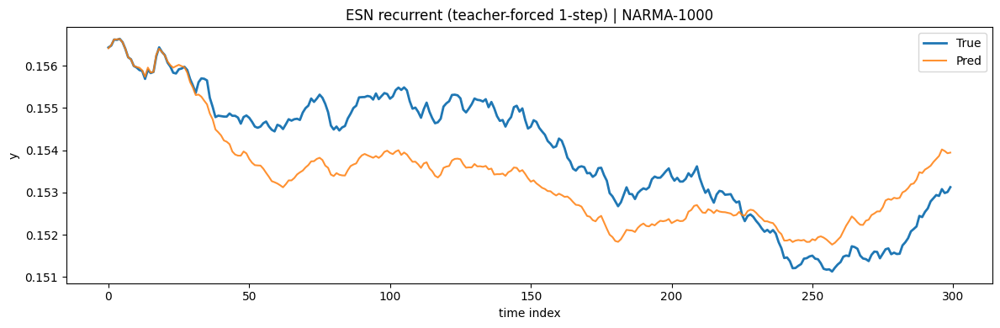

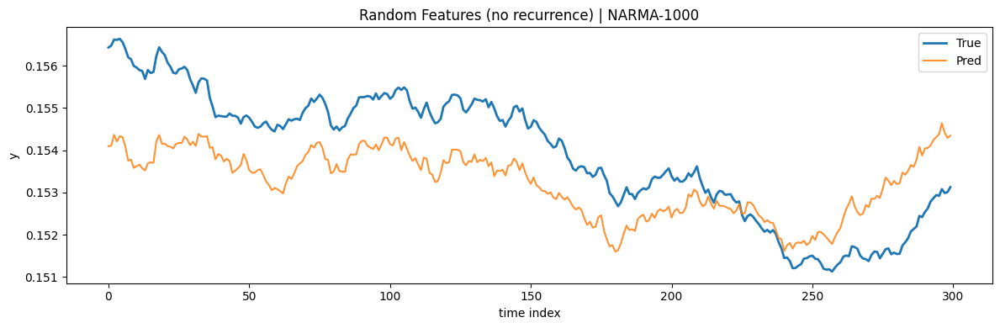

=== NARMA-10000 | M=1200 | b_divide_by_order=False ===
[QRC]     MSE=2.16265e-09  Corr=0.997868
[ESN]     MSE=2.21563e-07  Corr=0.70093
[RF-ESN]  MSE=2.56546e-07  Corr=0.640955


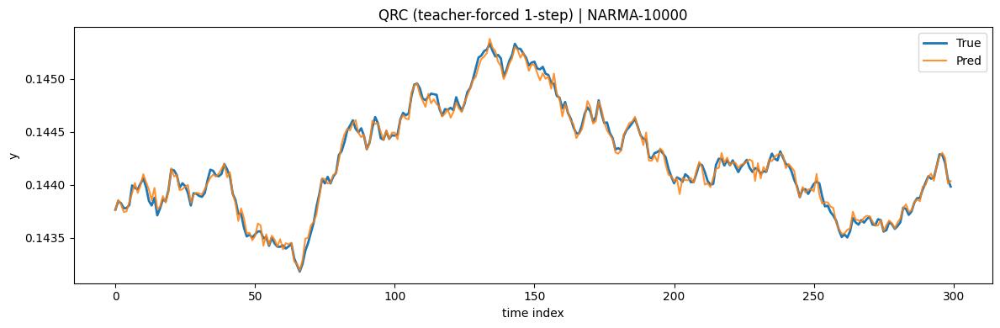

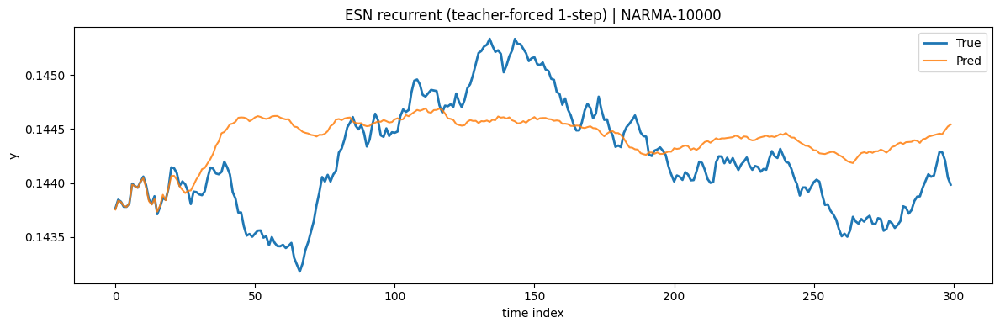

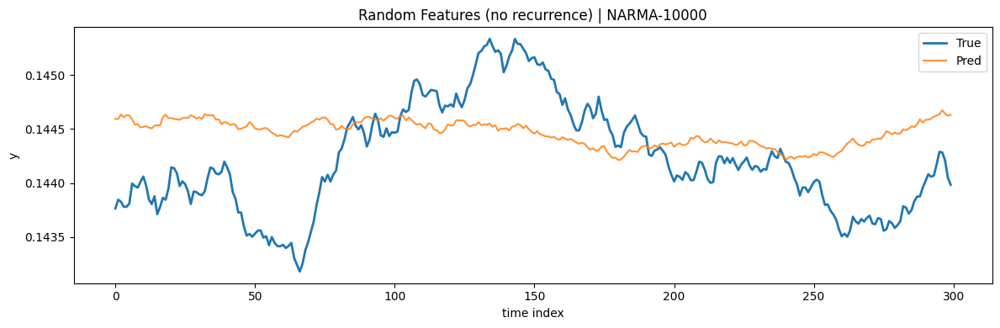

In [ ]:
# =========================================================
# 6) 実行例：まず order=30/200/500 を回す
#    ①まずはあなたの現状に合わせて b_divide_by_order=True
#    ②次に b_divide_by_order=False にして難化（u_highを下げるの推奨）
# =========================================================
for order in [30, 200, 500, 1000, 10000]:
    _ = compare_three_models_on_narma(
        order,
        N=100,
        T_series=6000,
        burn_in=1000,
        data_seed=123,
        u_high=0.2,
        start_t=1000,
        T_train=1000,
        b_divide_by_order=False,  # ←まずはTrue（現状追認）
        ridge=1e-2,
        # QRC
        alpha=1.0, beta=0.7, squeeze_r=0.3,
        sign_mode="plus", carry_state=True,
        # ESN
        spectral_radius=0.9, leak_rate=1.0,
        # RF
        rf_nonlinearity="tanh",
    )

このQRCは“記憶するリザバー”ではなく
**“履歴を統計として圧縮するリザバー”であると結論付けられる**

shot数と相関長の関係

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Dict, List, Tuple, Optional

def sweep_K_for_fixed_rho(
    *,
    order: int,
    rho: float,
    K_list: Tuple[int, ...],
    # --- data params (must match your current setup) ---
    T_series: int = 60000,
    burn_in: int = 15000,
    data_seed: int = 123,
    u_high: float = 0.2,
    b_divide_by_order: bool = False,
    sum_norm: str = "mean",
    center_u: bool = True,
    ma_window: int = 500,
    y_clip: float = 5.0,
    # --- training window ---
    start_t: int = 1000,
    T_train: int = 2000,
    ridge: float = 1e-2,
    # --- QRC params ---
    N: int = 100,
    alpha: float = 1.0,
    beta: float = 0.7,
    squeeze_r: float = 0.3,
    norm_const: float = 1.0,
    qrc_seed: int = 43,
    Win_scale: float = 1.0,
    carry_state: bool = True,
    state_leak: float = 1.0,
    # --- injection/nonlin modes (your best setting) ---
    inject_mode: str = "stochastic",      # uses resample_every
    nonlin_mode: str = "linear",
    linear_gain: float = 1.0,
    linear_bias: float = 0.5,
) -> Dict[str, object]:
    """
    For a fixed rho, sweep K (resample_every) and return metrics + best K.
    Requires your functions:
      - narma_series_stable(...)
      - make_scalar_dataset_next(u_series, y_series, start_t, T_train)
      - simulate_qrc_states_outprob_scalar_ablation(...)
      - fit_readout_ridge, predict_readout, mse_corr
    """

    # --- generate correlated NARMA (u is AR(1) with given rho)
    y_series, u_series = narma_series_stable(
        order=order,
        length=T_series,
        seed=data_seed,
        burn_in=burn_in,
        u_high=u_high,
        u_kind="ar1",
        rho=rho,
        ma_window=ma_window,
        b_divide_by_order=b_divide_by_order,
        y_clip=y_clip,
        sum_norm=sum_norm,
        center_u=center_u,
    )

    # --- build teacher-forced dataset (predict y[t+1] from states driven by u[t])
    U, Y = make_scalar_dataset_next(u_series, y_series, start_t=start_t, T=T_train)

    M = 12 * N
    rng = np.random.default_rng(qrc_seed)
    Win_fixed = rng.uniform(-1.0, 1.0, size=(M,)) * float(Win_scale)

    rows = []
    for K in K_list:
        S, _, _ = simulate_qrc_states_outprob_scalar_ablation(
            N=N, alpha=alpha, beta=beta, squeeze_r=squeeze_r,
            U=U,
            seed=qrc_seed,
            norm_const=norm_const,
            input_mode="scale",
            Win=Win_fixed,
            carry_state=carry_state,
            sign_mode="plus",
            inject_mode=inject_mode,          # "stochastic"
            nonlin_mode=nonlin_mode,          # "linear"
            linear_gain=linear_gain,
            linear_bias=linear_bias,
            state_leak=state_leak,
            resample_every=int(K),            # ★ここが shot数(更新周期)
            resample_mode="hold",
            fixed_signs_in_hold=True,
        )
        w, b = fit_readout_ridge(S, Y, ridge=ridge)
        Yhat = predict_readout(S, w, b)
        mse, corr = mse_corr(Y, Yhat)
        rows.append((int(K), float(mse), float(corr)))

    # best K by Corr (tie -> lower MSE)
    rows_sorted = sorted(rows, key=lambda x: (-x[2], x[1]))
    K_best, mse_best, corr_best = rows_sorted[0]

    # handy time scale proxy
    tau = 1.0 / max(1e-12, (1.0 - float(rho)))  # tau ~ 1/(1-rho)

    return {
        "rho": float(rho),
        "tau": float(tau),
        "rows": rows,                # list of (K, MSE, Corr)
        "best": {"K": K_best, "MSE": mse_best, "Corr": corr_best},
        "y_std": float(np.std(y_series)),
        "u_std": float(np.std(u_series)),
    }


def sweep_rho_and_find_scaling(
    *,
    order: int,
    rho_list: Tuple[float, ...] = (0.9, 0.95, 0.98, 0.99, 0.995, 0.999, 0.9995, 0.9999),
    K_list: Tuple[int, ...] = (1, 2, 5, 10, 20, 50, 100, 200),
    # pass-through params
    **kwargs
) -> List[Dict[str, object]]:
    results = []
    for rho in rho_list:
        out = sweep_K_for_fixed_rho(
            order=order,
            rho=float(rho),
            K_list=K_list,
            **kwargs
        )
        results.append(out)

        b = out["best"]
        print(f"rho={rho:.6f}  tau~{out['tau']:.2e}  K_best={b['K']:<4d}  Corr={b['Corr']:.6f}  MSE={b['MSE']:.6g}")

    return results


def plot_scaling_Kopt_vs_tau(results: List[Dict[str, object]], *, title: str = ""):
    taus = np.array([r["tau"] for r in results], float)
    Kopt = np.array([r["best"]["K"] for r in results], int)
    Corr = np.array([r["best"]["Corr"] for r in results], float)

    plt.figure(figsize=(6,4))
    plt.plot(taus, Kopt, marker="o")
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel(r"tau ~ 1/(1-rho)  (log)")
    plt.ylabel("K_opt (log)")
    plt.title(title or "Scaling: K_opt vs input correlation length")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(6,4))
    plt.plot(taus, Corr, marker="o")
    plt.xscale("log")
    plt.xlabel(r"tau ~ 1/(1-rho)  (log)")
    plt.ylabel("Best Corr")
    plt.title(title or "Best Corr vs input correlation length")
    plt.tight_layout()
    plt.show()


def plot_heatmap_corr_over_rho_K(results: List[Dict[str, object]], K_list: Tuple[int, ...], *, title: str=""):
    rhos = [r["rho"] for r in results]
    mat = np.full((len(rhos), len(K_list)), np.nan, float)
    for i, r in enumerate(results):
        d = {K: corr for (K, mse, corr) in r["rows"]}
        for j, K in enumerate(K_list):
            mat[i, j] = d.get(int(K), np.nan)

    plt.figure(figsize=(8, 4))
    plt.imshow(mat, aspect="auto", origin="lower")
    plt.xticks(np.arange(len(K_list)), [str(k) for k in K_list])
    plt.yticks(np.arange(len(rhos)), [f"{x:.4f}" for x in rhos])
    plt.colorbar(label="Corr")
    plt.xlabel("K (resample_every)")
    plt.ylabel("rho")
    plt.title(title or "Corr heatmap over (rho, K)")
    plt.tight_layout()
    plt.show()

rho=0.900000  tau~1.00e+01  K_best=10    Corr=0.960904  MSE=8.07977e-07
rho=0.950000  tau~2.00e+01  K_best=10    Corr=0.975350  MSE=5.07276e-07
rho=0.980000  tau~5.00e+01  K_best=10    Corr=0.984482  MSE=2.57494e-07
rho=0.990000  tau~1.00e+02  K_best=10    Corr=0.991740  MSE=1.26205e-07
rho=0.995000  tau~2.00e+02  K_best=10    Corr=0.995712  MSE=7.10907e-08
rho=0.999000  tau~1.00e+03  K_best=20    Corr=0.997975  MSE=1.79804e-08
rho=0.999500  tau~2.00e+03  K_best=20    Corr=0.998193  MSE=4.58934e-09
rho=0.999900  tau~1.00e+04  K_best=10    Corr=0.998268  MSE=2.9438e-09


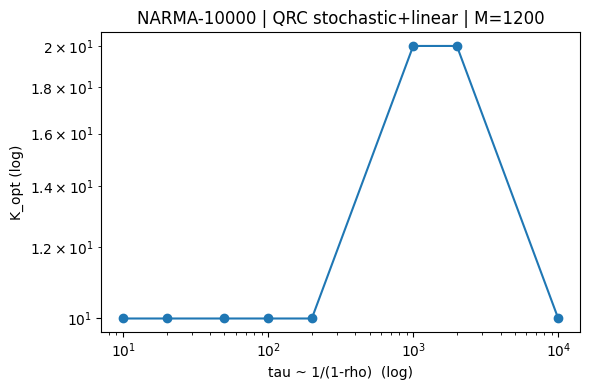

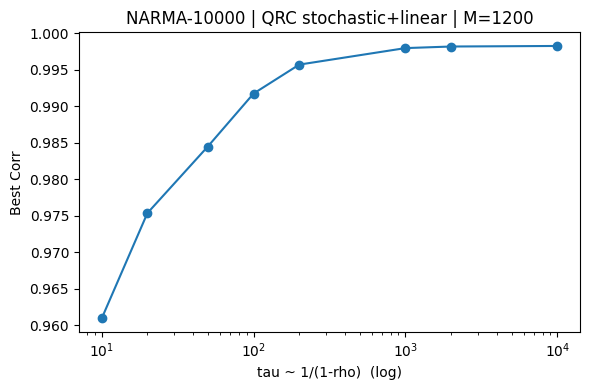

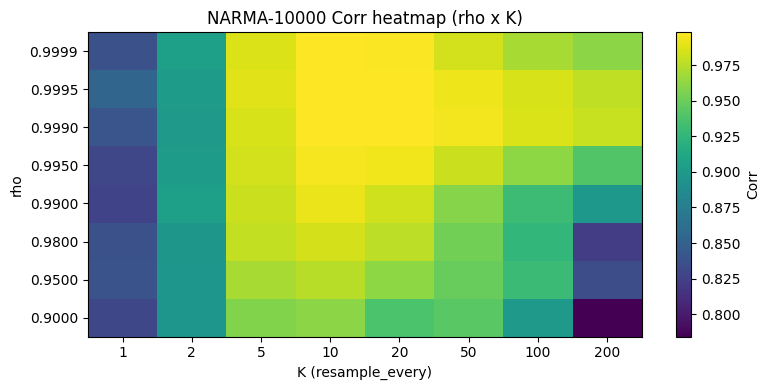

In [ ]:
rho_list = (0.90, 0.95, 0.98, 0.99, 0.995, 0.999, 0.9995, 0.9999)
K_list   = (1, 2, 5, 10, 20, 50, 100, 200)

results = sweep_rho_and_find_scaling(
    order=10000,
    rho_list=rho_list,
    K_list=K_list,
    N=100,
    T_series=60000,
    burn_in=15000,
    start_t=1000,
    T_train=2000,
    ridge=1e-2,
    u_high=0.2,
    b_divide_by_order=False,
    sum_norm="mean",
    center_u=True,
    ma_window=500,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    state_leak=1.0,
    inject_mode="stochastic",
    nonlin_mode="linear",
    linear_gain=1.0, linear_bias=0.5,
)

plot_scaling_Kopt_vs_tau(results, title="NARMA-10000 | QRC stochastic+linear | M=1200")
plot_heatmap_corr_over_rho_K(results, K_list, title="NARMA-10000 Corr heatmap (rho x K)")

rho=0.900000  tau~1.00e+01  K_best=8     Corr=0.963134  MSE=7.62755e-07
rho=0.950000  tau~2.00e+01  K_best=8     Corr=0.975406  MSE=5.06106e-07
rho=0.980000  tau~5.00e+01  K_best=10    Corr=0.984918  MSE=2.50313e-07
rho=0.990000  tau~1.00e+02  K_best=12    Corr=0.991149  MSE=1.35193e-07
rho=0.995000  tau~2.00e+02  K_best=12    Corr=0.995464  MSE=7.51896e-08
rho=0.999000  tau~1.00e+03  K_best=12    Corr=0.998641  MSE=1.20671e-08
rho=0.999500  tau~2.00e+03  K_best=12    Corr=0.998510  MSE=3.78431e-09
rho=0.999900  tau~1.00e+04  K_best=12    Corr=0.998174  MSE=3.10391e-09


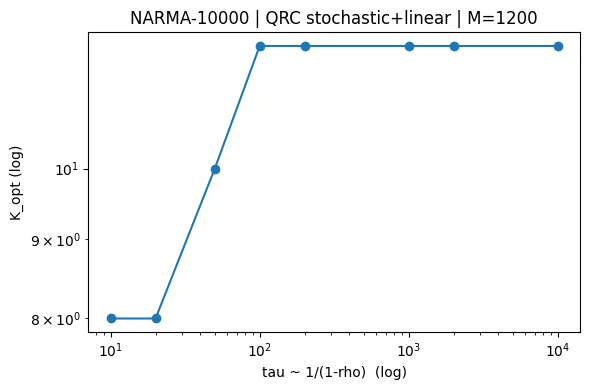

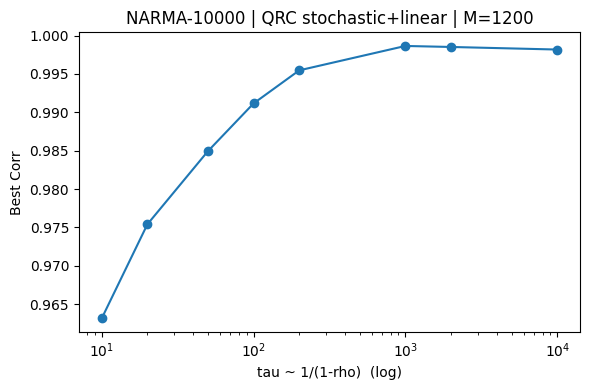

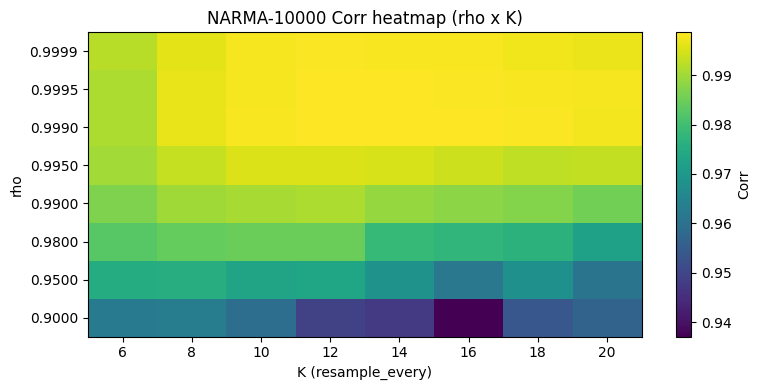

In [ ]:
rho_list = (0.90, 0.95, 0.98, 0.99, 0.995, 0.999, 0.9995, 0.9999)
K_list   = (6,8,10,12,14,16,18,20)

results = sweep_rho_and_find_scaling(
    order=10000,
    rho_list=rho_list,
    K_list=K_list,
    N=100,
    T_series=60000,
    burn_in=15000,
    start_t=1000,
    T_train=2000,
    ridge=1e-2,
    u_high=0.2,
    b_divide_by_order=False,
    sum_norm="mean",
    center_u=True,
    ma_window=500,
    alpha=1.0, beta=0.7, squeeze_r=0.3,
    carry_state=True,
    state_leak=1.0,
    inject_mode="stochastic",
    nonlin_mode="linear",
    linear_gain=1.0, linear_bias=0.5,
)

plot_scaling_Kopt_vs_tau(results, title="NARMA-10000 | QRC stochastic+linear | M=1200")
plot_heatmap_corr_over_rho_K(results, K_list, title="NARMA-10000 Corr heatmap (rho x K)")

2次のMC曲線

In [ ]:
import numpy as np
from typing import Dict, Tuple, Optional, List

# ---------- basic metrics ----------
def r2_score_safe(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    y_true = np.asarray(y_true, float).reshape(-1)
    y_pred = np.asarray(y_pred, float).reshape(-1)
    var = float(np.var(y_true))
    if var < 1e-15:
        return 0.0
    ss_res = float(np.mean((y_true - y_pred) ** 2))
    return max(0.0, 1.0 - ss_res / (var + 1e-15))

def fit_readout_ridge(S: np.ndarray, Y: np.ndarray, ridge: float = 1e-2) -> Tuple[np.ndarray, float]:
    S = np.asarray(S, float)
    Y = np.asarray(Y, float).reshape(-1)
    T, M = S.shape
    if Y.size != T:
        raise ValueError("S and Y length mismatch")
    X = np.hstack([S, np.ones((T, 1))])  # (T, M+1)
    Reg = np.diag(np.append(np.full(M, ridge), 0.0))  # bias not regularized
    theta = np.linalg.solve(X.T @ X + Reg, X.T @ Y)
    w = theta[:M]
    b = float(theta[M])
    return w, b

def predict_readout(S: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    return np.asarray(S, float) @ np.asarray(w, float) + float(b)

# ---------- target builders ----------
def build_delay_targets(
    u: np.ndarray,
    k_max: int,
    *,
    kind: str = "linear",  # "linear" or "square"
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns:
      U_aligned: u[t] aligned to targets (length T_eff)
      Y_targets: shape (T_eff, k_max) where column k-1 corresponds to delay k
    """
    u = np.asarray(u, float).reshape(-1)
    if k_max < 1:
        raise ValueError("k_max must be >= 1")

    # We will predict delay targets using states at time t, so need u[t-k]
    T = u.size
    T_eff = T - k_max
    if T_eff <= 10:
        raise ValueError("u is too short for given k_max")

    U_now = u[k_max:]  # u[t] for t=k_max..T-1 (not always used, but handy)
    Y = np.empty((T_eff, k_max), dtype=float)

    for k in range(1, k_max + 1):
        base = u[k_max - k : T - k]  # u[t-k] aligned with t=k_max..T-1
        if kind == "linear":
            Y[:, k - 1] = base
        elif kind == "square":
            Y[:, k - 1] = base ** 2
        else:
            raise ValueError('kind must be "linear" or "square"')

    return U_now, Y

def build_cross_targets(
    u: np.ndarray,
    pairs: List[Tuple[int, int]],
) -> np.ndarray:
    """
    Cross targets: u(t-k)*u(t-l) for specified (k,l) pairs.
    Returns Y: shape (T_eff, len(pairs))
    Alignment uses t = max(k,l) .. T-1
    """
    u = np.asarray(u, float).reshape(-1)
    max_d = max(max(k, l) for (k, l) in pairs)
    T = u.size
    T_eff = T - max_d
    if T_eff <= 10:
        raise ValueError("u too short for cross targets")
    Y = np.empty((T_eff, len(pairs)), dtype=float)
    for j, (k, l) in enumerate(pairs):
        a = u[max_d - k : T - k]
        b = u[max_d - l : T - l]
        Y[:, j] = a * b
    return Y

# ---------- MC core ----------
def memory_capacity_decomposition(
    S: np.ndarray,
    u: np.ndarray,
    *,
    k_max: int = 300,
    ridge: float = 1e-2,
    washout: int = 200,
    train_frac: float = 0.7,
    # Nonlinear part options
    compute_square: bool = True,
    compute_cross: bool = False,
    cross_max_delay: int = 50,      # build pairs (k,l) with 1<=k<l<=cross_max_delay
    cross_max_pairs: int = 500,     # cap for runtime
    seed: int = 0,
) -> Dict[str, object]:
    """
    S: (T,M) state sequence
    u: (T,) input sequence aligned to S (same time axis)
    We measure how well linear readout from S[t] reconstructs:
      - u[t-k]        (linear MC)
      - (u[t-k])^2    (square MC)
      - u[t-k]*u[t-l] (cross MC, optional)
    using R^2 per target and summing.

    Returns dict with per-delay curves and sums.
    """
    S = np.asarray(S, float)
    u = np.asarray(u, float).reshape(-1)
    T, M = S.shape
    if u.size != T:
        raise ValueError("S and u must have same length (time axis)")

    if washout >= T - (k_max + 5):
        raise ValueError("washout too large for given T and k_max")

    # Crop washout
    S0 = S[washout:]
    u0 = u[washout:]
    T0 = u0.size

    # Build targets (aligned)
    _, Y_lin = build_delay_targets(u0, k_max, kind="linear")  # (T_eff, k_max)
    _, Y_sq  = build_delay_targets(u0, k_max, kind="square")  # (T_eff, k_max)
    T_eff = Y_lin.shape[0]

    # Align states to same T_eff: states at time t=k_max.. end
    S_eff = S0[k_max:]  # (T_eff, M)

    # Train/test split (time order)
    n_train = int(T_eff * float(train_frac))
    if n_train < 50 or (T_eff - n_train) < 50:
        raise ValueError("Not enough data after split; increase T or adjust train_frac")

    S_tr, S_te = S_eff[:n_train], S_eff[n_train:]
    # shuffle not used (time series), but seed kept for reproducibility if you later extend

    # ---- linear MC per delay
    mc_lin = np.zeros(k_max, dtype=float)
    for k in range(k_max):
        y_tr = Y_lin[:n_train, k]
        y_te = Y_lin[n_train:, k]
        w, b = fit_readout_ridge(S_tr, y_tr, ridge=ridge)
        y_hat = predict_readout(S_te, w, b)
        mc_lin[k] = r2_score_safe(y_te, y_hat)

    # ---- square MC per delay
    mc_sq = np.zeros(k_max, dtype=float)
    if compute_square:
        for k in range(k_max):
            y_tr = Y_sq[:n_train, k]
            y_te = Y_sq[n_train:, k]
            w, b = fit_readout_ridge(S_tr, y_tr, ridge=ridge)
            y_hat = predict_readout(S_te, w, b)
            mc_sq[k] = r2_score_safe(y_te, y_hat)

    # ---- cross MC (optional)
    mc_cross_sum = 0.0
    cross_detail = None
    if compute_cross:
        # build pairs
        D = int(cross_max_delay)
        pairs = [(k, l) for k in range(1, D + 1) for l in range(k + 1, D + 1)]
        # cap pairs for runtime: random subset
        if len(pairs) > cross_max_pairs:
            rng = np.random.default_rng(seed)
            idx = rng.choice(len(pairs), size=cross_max_pairs, replace=False)
            pairs = [pairs[i] for i in idx]

        Yx = build_cross_targets(u0, pairs)  # (T0-max_d, P)
        max_d = max(max(k, l) for (k, l) in pairs)
        Sx = S0[max_d:]                      # align states
        # Apply washout already done; now split
        Tx = Yx.shape[0]
        n_train_x = int(Tx * float(train_frac))
        Sx_tr, Sx_te = Sx[:n_train_x], Sx[n_train_x:]
        Yx_tr, Yx_te = Yx[:n_train_x], Yx[n_train_x:]

        r2s = []
        for j in range(Yx.shape[1]):
            w, b = fit_readout_ridge(Sx_tr, Yx_tr[:, j], ridge=ridge)
            y_hat = predict_readout(Sx_te, w, b)
            r2s.append(r2_score_safe(Yx_te[:, j], y_hat))
        r2s = np.array(r2s, dtype=float)
        mc_cross_sum = float(np.sum(r2s))
        cross_detail = {"pairs": pairs, "r2": r2s}

    out = {
        "k_max": k_max,
        "mc_linear_curve": mc_lin,
        "mc_square_curve": mc_sq,
        "mc_linear_sum": float(np.sum(mc_lin)),
        "mc_square_sum": float(np.sum(mc_sq)),
        "mc_total_lin_plus_sq": float(np.sum(mc_lin) + np.sum(mc_sq)),
        "mc_cross_sum": mc_cross_sum,
        "cross_detail": cross_detail,
        "meta": {
            "T": T,
            "M": M,
            "washout": washout,
            "train_frac": train_frac,
            "ridge": ridge,
            "compute_square": compute_square,
            "compute_cross": compute_cross,
        }
    }
    return out

def simulate_esn_states_tanh_scalar(
    M: int,
    U: np.ndarray,  # (T,)
    *,
    seed: int = 43,
    spectral_radius: float = 0.9,
    input_scale: float = 0.5,
    leak_rate: float = 1.0,
    bias_scale: float = 0.1,
) -> np.ndarray:
    U = np.asarray(U, float).reshape(-1)
    T = U.size
    rng = np.random.default_rng(seed)

    Win = rng.uniform(-1.0, 1.0, size=(M,)) * float(input_scale)
    Wres = rng.normal(0.0, 1.0, size=(M, M)) / np.sqrt(M)

    eigvals = np.linalg.eigvals(Wres)
    sr = np.max(np.abs(eigvals)) + 1e-12
    Wres = Wres * (float(spectral_radius) / sr)

    b = rng.uniform(-1.0, 1.0, size=M) * float(bias_scale)

    x = np.zeros(M, dtype=float)
    S = np.empty((T, M), dtype=float)

    for t in range(T):
        pre = x @ Wres + U[t] * Win + b
        x_new = np.tanh(pre)
        x = (1.0 - leak_rate) * x + leak_rate * x_new
        S[t] = x

    return S

In [ ]:
# 例: correlated input u(t)（あなたの generate_correlated_u を使用）
u = generate_correlated_u(
    length=30000,
    seed=123,
    u_high=0.2,
    kind="ar1",
    rho=0.9999,
    burn_in=2000,
)

# QRC states (例: stochastic_refresh + linear nonlinearity)
N = 100
M = 12 * N
rng = np.random.default_rng(43)
Win_fixed = rng.uniform(-1.0, 1.0, size=(M,)) * 1.0

S_qrc, xT, dbg = simulate_qrc_states_outprob_scalar_ablation(
    N=N, alpha=1.0, beta=0.7, squeeze_r=0.3,
    U=u,
    seed=43,
    norm_const=1.0,
    input_mode="scale",
    Win=Win_fixed,
    carry_state=True,
    sign_mode="plus",
    inject_mode="stochastic_refresh",
    refresh_prob=0.1,                 # 期待ホールド長 ~10
    fixed_signs_in_refresh=True,
    nonlin_mode="linear",
    linear_gain=1.0, linear_bias=0.5,
    state_leak=1.0,
)

mc_qrc = memory_capacity_decomposition(
    S_qrc, u,
    k_max=300,
    ridge=1e-2,
    washout=500,
    train_frac=0.7,
    compute_square=True,
    compute_cross=False,              # まずは False 推奨（重い）
)

print("[QRC] M =", M)
print("  MC_linear_sum =", mc_qrc["mc_linear_sum"])
print("  MC_square_sum =", mc_qrc["mc_square_sum"])
print("  MC_total(lin+sq) =", mc_qrc["mc_total_lin_plus_sq"])

[QRC] M = 1200
  MC_linear_sum = 218.82956658374923
  MC_square_sum = 196.16543917037444
  MC_total(lin+sq) = 414.99500575412367


In [ ]:
S_esn = simulate_esn_states_tanh_scalar(
    M=M, U=u,
    seed=43,
    spectral_radius=0.9,
    input_scale=0.5,
    leak_rate=1.0,
    bias_scale=0.1,
)

mc_esn = memory_capacity_decomposition(
    S_esn, u,
    k_max=300,
    ridge=1e-2,
    washout=500,
    train_frac=0.7,
    compute_square=True,
    compute_cross=False,
)

print("[ESN] M =", M)
print("  MC_linear_sum =", mc_esn["mc_linear_sum"])
print("  MC_square_sum =", mc_esn["mc_square_sum"])
print("  MC_total(lin+sq) =", mc_esn["mc_total_lin_plus_sq"])

[ESN] M = 1200
  MC_linear_sum = 281.7994797984038
  MC_square_sum = 276.0656021202775
  MC_total(lin+sq) = 557.8650819186813


In [ ]:
mc_qrc_cross = memory_capacity_decomposition(
    S_qrc, u,
    k_max=200,
    ridge=1e-2,
    washout=500,
    train_frac=0.7,
    compute_square=True,
    compute_cross=True,
    cross_max_delay=40,
    cross_max_pairs=400,
    seed=0,
)
print("MC_cross_sum =", mc_qrc_cross["mc_cross_sum"])

MC_cross_sum = 287.9976250538499
